# Turtle Games - Customer Segmentation & Predictive Modeling

# Scenario

Turtle Games is a global game manufacturer and retailer. As a retailer, they sell both their own products and those manufactured by other companies. Their product portfolio consists of video games, books, board games, and toys.
The primary goal of the analysis is to understand the dynamics behind loyalty point accumulation, understand customer trends and segments to support targeted marketing, and to leverage product reviews to better inform product and marketing strategy. 

Tailoring the loyalty program to their customers, Turtle Games is guaranteed to achieve higher engagement, loyalty , and spending levels.
Source: https://www.bcg.com/publications/2023/loyalty-programs-need-to-continue-to-evolve

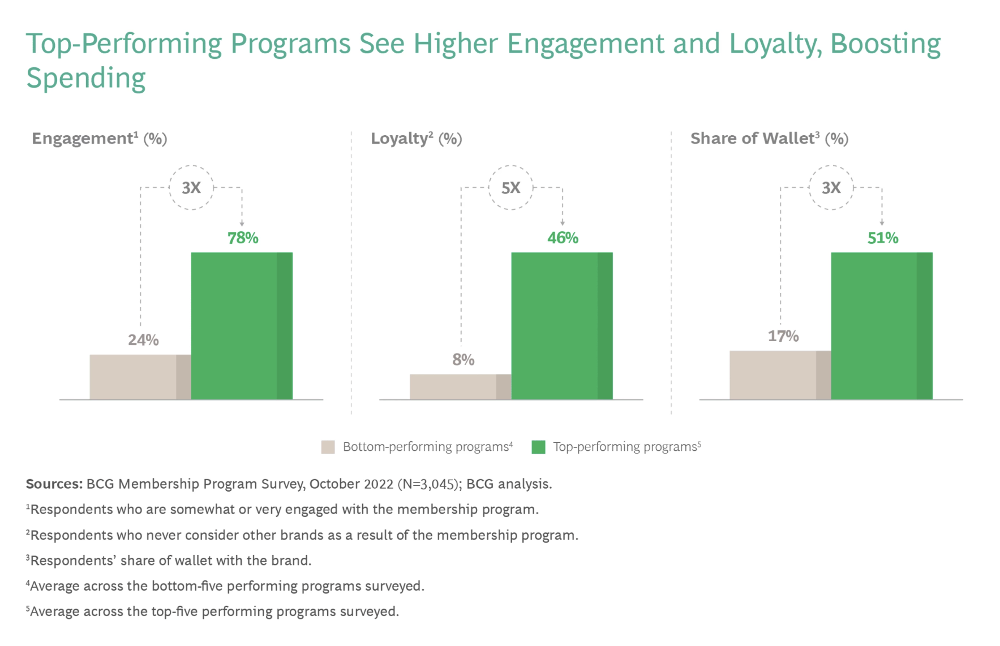


## Analysis Steps 

**Python**
- I. Data Cleaning, Exploratory Analysis and initial Linear Regression models
- II. Advanced Regression Models: Including Decision Trees and Random Forests to predict Loyalty Points
- III. Clustering: Group Customers into Clusters based on Common Traits
- IV. Reviews' analysis using Natural Language Process (NLP) and Document Term Matrix (DTM)

**R**
- V. Further Descriptive and Exploratory Data Analysis
- VI. Additional Predictive Models 

# I. Data cleaning, exploratory analysis and inital linear regression models

## 0. Define libraries required for the analysis

In [9]:
# Import basic python libraries
import numpy as np
import pandas as pd

# Import visualization libraries
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib as mpl
from matplotlib.patches import Patch 

# Import Regression / Statistical libraries
import statsmodels.api as sm 
from statsmodels.formula.api import ols
from statsmodels.stats.outliers_influence import variance_inflation_factor
from scipy.stats import shapiro
from sklearn.model_selection import train_test_split
from statsmodels.stats import diagnostic as sms
from sklearn.tree import DecisionTreeRegressor, plot_tree 
from sklearn.metrics import accuracy_score, confusion_matrix, ConfusionMatrixDisplay, classification_report
from sklearn.metrics import adjusted_rand_score
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Import libraries for stratification
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import mean_absolute_error, r2_score

# Import necessary libraries.
import matplotlib.cm as cm

# Import clustering libraries
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.metrics import accuracy_score
from scipy.spatial.distance import cdist

import warnings
warnings.filterwarnings('ignore')

# Import libraries required for hierarchical clustering
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.preprocessing import StandardScaler
%matplotlib inline

# Import the standard scaler library 
from sklearn.preprocessing import StandardScaler

# Import libraries required for Natural language processing (NPL)
from wordcloud import WordCloud
from nltk.tokenize import word_tokenize, RegexpTokenizer
from nltk.probability import FreqDist
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from textblob import TextBlob
from scipy.stats import norm
from sklearn.feature_extraction.text import CountVectorizer

# Download the StopWords and WordNet lists.
import nltk
nltk.download ('stopwords')
nltk.download('wordnet')

# Import the Counter class.
from collections import Counter

# Import RandomForestClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix

# Import SMOTE
from imblearn.over_sampling import SMOTE

# Import re module
import re



[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/alexandraakaoui/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     /Users/alexandraakaoui/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


## 1. Load, explore and cleanup the data 

In [11]:
# Set colorblind friendly palettes for the plots 
mpl.rcParams['image.cmap'] = 'cividis'

# Set size of all matplotlib plots
plt.rcParams['figure.figsize'] = [15, 10]

In [12]:
# Load the CSV file(s) as reviews.
turtle = pd.read_csv('turtle_reviews.csv')

# View the DataFrame.
turtle.head()

,gender,age,remuneration (k£),spending_score (1-100),loyalty_points,education,language,platform,product,review,summary
0,Male,18,12.30,39,210,graduate,EN,Web,453,"When it comes to a DM's screen, the space on t...",The fact that 50% of this space is wasted on a...
1,Male,23,12.30,81,524,graduate,EN,Web,466,An Open Letter to GaleForce9*:\n\nYour unpaint...,Another worthless Dungeon Master's screen from...
2,Female,22,13.12,6,40,graduate,EN,Web,254,"Nice art, nice printing. Why two panels are f...","pretty, but also pretty useless"
3,Female,25,13.12,77,562,graduate,EN,Web,263,Amazing buy! Bought it as a gift for our new d...,Five Stars
4,Female,33,13.94,40,366,graduate,EN,Web,291,As my review of GF9's previous screens these w...,Money trap


### Null and Zero Values Check
1. There are no null values in all columns
2. Turtle DataFrame was also checked for zero values and there are none in all checked columns

In [14]:
# Any missing values?
print(turtle.info())

# Check if any of the columns in the DataFrame are  equal to 0
(turtle==0).any()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 11 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   gender                  2000 non-null   object 
 1   age                     2000 non-null   int64  
 2   remuneration (k£)       2000 non-null   float64
 3   spending_score (1-100)  2000 non-null   int64  
 4   loyalty_points          2000 non-null   int64  
 5   education               2000 non-null   object 
 6   language                2000 non-null   object 
 7   platform                2000 non-null   object 
 8   product                 2000 non-null   int64  
 9   review                  2000 non-null   object 
 10  summary                 2000 non-null   object 
dtypes: float64(1), int64(4), object(6)
memory usage: 172.0+ KB
None


gender                    False
age                       False
remuneration (k£)         False
spending_score (1-100)    False
loyalty_points            False
education                 False
language                  False
platform                  False
product                   False
review                    False
summary                   False
dtype: bool

### Loyalty points and product number

Each row doesn't seem to represent a unique transaction. If it were the case, then loyalty points collected would have been in a similar range bracket with the product purchased. 

This is because according to the meta description the loyalty points are based on purchase points collected. 

The data then includes accumulated purchase points. 

In [16]:
# Select the loyalty points and product column and sort by product number
# This is mainly to see if there is any relation between the purchased product and the loyalty points on a top level
turtle_selected = turtle[['loyalty_points', 'product']].sort_values(by='product')
turtle_selected

,loyalty_points,product
1220,476,107
1602,785,107
39,1159,107
1026,534,107
831,944,107
...,...,...
959,3015,11086
1939,1470,11086
1730,506,11086
1541,3880,11086


### Clean up and Duplicate Check

**Cleanup steps included:**
- The DataFrame was checked for duplicates and none were found
- Remuneration column was rounded to the nearest 2 decimal places
- Removing all whitespace and changing all strings to lowercase

**Grouping by columns excluding product, review and summary:**
- Since loyalty points are not necessarily linked to the product code, reviews or summaries, the rows of the dataframes were grouped by the remaining columns. 
- The assumption was made that each customer can buy different products and hence write different reviews
- Rows were grouped by all columns excluding product, review and summary (this is after confirming that each unique customer / unique customer demographic group has the same loyalty points)
- It was assumed that rows with identical values in age, gender, education, remuneration, spending score and loyalty points are highly likely coming from one customer or one customer group sharing the same demographics
- This is why these rows with identical values were assigned a unique customer id

**Observations**
The origianl DataFrame includes 2000 rows but they are in fact generated by 782 unique customers / customer demographics groups


In [18]:
# Check if there are duplicates including all columns of the DataFrame
turtle.duplicated().sum()

0

In [19]:
# Round up the remuneration column to make sure they're all rounded up to two decimal places
turtle['remuneration (k£)'] = turtle['remuneration (k£)'].round(2)

In [20]:
# Strip whitespace and lowercase all string columns
for col in turtle.select_dtypes(include='object').columns:
    turtle[col] = turtle[col].str.strip().str.lower()

### Comparing grouping with and without the loyalty points
To understand whether or not the loyalty points collected match the demographics of the customers, two different grouped DataFrames were created: once including the loyalty points and once excluding it. 

Each row in both DataFrames was then transformed into a string with a '-' separating each entry and the two sets were compared. 
Obviously the strings were created by excluding the loyalty points.

It was found that both DataFrames have the same customer groupings and this is the cleaned up data version that will be used for the modelling.

In [22]:
# Group customers by all columns excluding the product, reviews and summary
# Rows with identical values in the group_cols are highly likely one unique customer

# Create a list of columns to group by (this excludes product, review and summary)
group_cols = [col for col in turtle.columns if col not in ['product','review','summary']]

# Group the DataFrame by the group_cols
grouped = turtle.groupby(group_cols)

# Count the number of occurences for each group to determine how many rows share the same demographic information
group_df = grouped.size().reset_index(name='count')

# Display all rows, even those with only one entry
duplicates = group_df[group_df['count'] >= 1]

# Sum the count of entries to verify they're equal to 2000
duplicates['count'].sum()

2000

In [23]:
# Group customers by all columns excluding the loyalty_points, product, reviews and summary
# Rows with identical values in the group_cols are highly likely one unique customer

# Create a list of columns to group by (this excludes product, review and summary)
group_cols2 = [col for col in turtle.columns if col not in ['loyalty_points','product','review','summary']]

# Group the DataFrame by the group_cols
grouped2 = turtle.groupby(group_cols2)

# Count the number of occurences for each group to determine how many rows share the same demographic information
group_df2 = grouped2.size().reset_index(name='count')

# Display all rows, even those with only one entry
duplicates2 = group_df2[group_df2['count'] >= 1]

# Sum the count of entries to verify they're equal to 2000
duplicates2['count'].sum()

2000

In [24]:
# Verify that the loyalty points actually belong to the same customer / customer group

# Exclude the loyalty points by assigning group_cols2 (not including the loyalty points) to the common_cols
common_cols = group_cols2  

# Create a column 'compare_key' where all data in common_cols are joined, separate by '-'
group_df['compare_key'] = group_df[common_cols].astype(str).agg('-'.join, axis=1)
group_df2['compare_key'] = group_df2[common_cols].astype(str).agg('-'.join, axis=1)

# Create two sets from the compare_key column of each DataFrame
# This removes duplicates and allows easy comparison operations like (difference)
set1 = set(group_df['compare_key'])
set2 = set(group_df2['compare_key'])

# Compare both sets by checking elements that are only in set1 or elements only in set2
only_in_1 = set1 - set2
only_in_2 = set2 - set1


# Print the results of the subtraction operation
# There is no difference between both sets indicating that the loyalty points indeed belong to the same customer/customer group
print(f"Groups only in method 1 (projected to common columns): {len(only_in_1)}")
print(f"Groups only in method 2: {len(only_in_2)}")

Groups only in method 1 (projected to common columns): 0
Groups only in method 2: 0


In [25]:
# Check the number of customers together with their sum of entries in the original DataFrame
group_df['count'].value_counts()

count
1    571
7    194
2     11
8      5
9      1
Name: count, dtype: int64

In [26]:
group_df

,gender,age,remuneration (k£),spending_score (1-100),loyalty_points,education,language,platform,count,compare_key
0,female,17,13.94,40,233,postgraduate,en,web,1,female-17-13.94-40-postgraduate-en-web
1,female,17,35.26,54,797,postgraduate,en,web,1,female-17-35.26-54-postgraduate-en-web
2,female,17,53.30,48,1071,postgraduate,en,web,7,female-17-53.3-48-postgraduate-en-web
3,female,17,69.70,26,759,postgraduate,en,web,1,female-17-69.7-26-postgraduate-en-web
4,female,18,12.30,81,436,graduate,en,web,1,female-18-12.3-81-graduate-en-web
...,...,...,...,...,...,...,...,...,...,...
777,male,72,37.72,56,1264,postgraduate,en,web,7,male-72-37.72-56-postgraduate-en-web
778,male,72,39.36,47,1107,phd,en,web,1,male-72-39.36-47-phd-en-web
779,male,72,40.18,55,1322,phd,en,web,7,male-72-40.18-55-phd-en-web
780,male,72,66.42,93,3695,phd,en,web,1,male-72-66.42-93-phd-en-web


### Age Column entries issue:

The age column show quality issues. This was checked for both education level and remuneration. 

Graduate, phd and postgraduate seem to have a min age between 17-18. Also 17 and 18 year olds were shown to have high annual remuneration, which could be possible but is highly unlikely. 

This will be reported to Turtle Games for data quality improvement. 

In [28]:
# Group by education and calculate the average age
edu = group_df.groupby('education')['age'].agg(['mean', 'min', 'max']).reset_index()
# Rename columns 'mean' -> 'mean_age', 'min' -> 'min_age', 'max' -> 'max_age' 
edu = edu.rename(columns={
    'mean': 'mean_age',
    'min': 'min_age',
    'max': 'max_age'
})
edu

,education,mean_age,min_age,max_age
0,basic,42.000000,32,49
1,diploma,47.706667,32,70
2,graduate,36.956772,18,70
3,phd,40.340659,17,72
4,postgraduate,40.177215,17,72


In [29]:
# Filter rows with phd and postgraduate education labels and ages below 22
young_postgrad = group_df[(group_df['education'].isin(['phd', 'postgraduate'])) & (group_df['age'] < 22)]

# Count the number of young postgrad
count_young_postgrad = young_postgrad.shape[0]
print(f"Number of PhD/postgraduate entries with age under 22: {count_young_postgrad}")

# Display the IDs of the customers belonging to this group
print("Customer IDs with age under 22 in PhD/Postgraduate:")

young_postgrad = young_postgrad.reset_index(drop=True)
young_postgrad

Number of PhD/postgraduate entries with age under 22: 20
Customer IDs with age under 22 in PhD/Postgraduate:


,gender,age,remuneration (k£),spending_score (1-100),loyalty_points,education,language,platform,count,compare_key
0,female,17,13.94,40,233,postgraduate,en,web,1,female-17-13.94-40-postgraduate-en-web
1,female,17,35.26,54,797,postgraduate,en,web,1,female-17-35.26-54-postgraduate-en-web
2,female,17,53.30,48,1071,postgraduate,en,web,7,female-17-53.3-48-postgraduate-en-web
3,female,17,69.70,26,759,postgraduate,en,web,1,female-17-69.7-26-postgraduate-en-web
4,male,17,18.86,98,774,phd,en,web,1,male-17-18.86-98-phd-en-web
5,male,17,27.06,4,45,phd,en,web,1,male-17-27.06-4-phd-en-web
6,male,17,27.06,92,1042,phd,en,web,7,male-17-27.06-92-phd-en-web
7,male,17,44.28,52,964,phd,en,web,1,male-17-44.28-52-phd-en-web
8,male,17,48.38,41,830,phd,en,web,7,male-17-48.38-41-phd-en-web
9,male,17,48.38,55,1114,phd,en,web,1,male-17-48.38-55-phd-en-web


In [30]:
# Group by education and calculate the average age
remu = group_df.groupby('remuneration (k£)')['age'].agg(['mean', 'min', 'max']).reset_index()
# Rename columns 'mean' -> 'mean_age', 'min' -> 'min_age', 'max' -> 'max_age' 
remu = remu.rename(columns={
    'mean': 'mean_age',
    'min': 'min_age',
    'max': 'max_age'
})
remu.head(20)

,remuneration (k£),mean_age,min_age,max_age
0,12.30,37.615385,18,70
1,13.12,38.714286,18,68
2,13.94,30.666667,17,51
3,14.76,41.071429,18,66
4,15.58,41.500000,22,69
5,16.40,36.166667,23,67
6,17.22,38.000000,22,51
7,18.86,40.785714,17,70
8,19.68,38.857143,27,58
9,20.50,37.928571,26,58


### Assigning customer IDs to the original DataFrame

The original DataFrame was assigned a customer ID based on the identified groupings above. 
The cleaned-up DataFrame includes 2000 rows and 782 unique customers (identified by their customer ID)

In [32]:
# Assign a unique customer id to all rows that have identical values for cols in group_cols
# The values in these rows are grouped in a string separated with a '|' 
# All rows with identical strings get assigned a unique customer id

turtle['customer_id'] = (
    turtle[group_cols]
    .astype(str)
    .agg('|'.join, axis=1)
    .factorize()[0] + 1  # Starts IDs from 1
)

In [33]:
# Reorganize the turtle DataFrame by moving the customer_id and placing it as the first column
new_order = ['customer_id', 'gender', 'age', 'education', 'remuneration (k£)', 
             'spending_score (1-100)', 'loyalty_points', 'language', 'platform', 'product', 'review', 'summary']
turtle = turtle[new_order]
turtle.head()

,customer_id,gender,age,education,remuneration (k£),spending_score (1-100),loyalty_points,language,platform,product,review,summary
0,1,male,18,graduate,12.30,39,210,en,web,453,"when it comes to a dm's screen, the space on t...",the fact that 50% of this space is wasted on a...
1,2,male,23,graduate,12.30,81,524,en,web,466,an open letter to galeforce9*:\n\nyour unpaint...,another worthless dungeon master's screen from...
2,3,female,22,graduate,13.12,6,40,en,web,254,"nice art, nice printing. why two panels are f...","pretty, but also pretty useless"
3,4,female,25,graduate,13.12,77,562,en,web,263,amazing buy! bought it as a gift for our new d...,five stars
4,5,female,33,graduate,13.94,40,366,en,web,291,as my review of gf9's previous screens these w...,money trap


### Reviews Check 
Review columns were checked for duplicates to see if there are any duplicated entries. 
32 duplicates were identified, however the majority seem unproblematic and highly likely to be repetitive reviews.
This is the likes of: love it, great, good product...etc.

There are, however, 3 duplicated reviews that look like they were copied over by mistake and these are:
- on-time and nice item.
- this set is slightly worse than earlier ones (..
- great expansion to a great game.

This would be taken into account in the Natural language processing modeling. 

In [35]:
duplicate_reviews = turtle[turtle.duplicated(subset='review', keep='first')]
duplicate_reviews.shape

(32, 12)

In [36]:
duplicate_reviews

,customer_id,gender,age,education,remuneration (k£),spending_score (1-100),loyalty_points,language,platform,product,review,summary
326,127,male,41,graduate,58.22,35,1463,en,web,2849,love it,five stars
371,172,male,32,diploma,71.34,75,3455,en,web,5726,great!,five stars
408,9,male,66,phd,15.58,3,31,en,web,1459,great,five stars
416,17,female,37,graduate,17.22,35,417,en,web,830,love it,five stars
430,31,male,62,phd,24.60,4,69,en,web,2173,love it,five stars
811,12,female,37,postgraduate,15.58,99,1067,en,web,1183,great game,five stars
959,160,female,32,graduate,63.96,73,3015,en,web,11086,love it,five stars
979,180,male,37,graduate,76.26,90,4747,en,web,4405,great game,five stars
1006,7,female,37,diploma,14.76,6,61,en,web,1183,great game,five stars
1037,38,female,32,postgraduate,27.88,73,1314,en,web,2130,awesome,five stars


## 2. Drop columns
It was noticed that the column for language and platform are redundant and could be removed. 

In [38]:
# Check the language and platform columns to see if they're the same for all rows
print('Is the language EN for all rows in the DataFrame?: ',(turtle['language']=='en').all())
print('Is the platform Web for all rows in the DataFrame?: ',(turtle['platform']=='web').all())


Is the language EN for all rows in the DataFrame?:  True
Is the platform Web for all rows in the DataFrame?:  True


In [39]:
# Drop unnecessary columns
# Drop the language and platform columns as they're deemed unnecessary and redundant
turtle = turtle.drop(columns=['language','platform'],axis=1)
group_df = group_df.drop(columns=['language','platform','compare_key'],axis=1)

In [40]:
# View column names of the cleaned original DataFrame including the customer_id
turtle.columns

Index(['customer_id', 'gender', 'age', 'education', 'remuneration (k£)',
       'spending_score (1-100)', 'loyalty_points', 'product', 'review',
       'summary'],
      dtype='object')

In [41]:
# View column names for the grouped DataFrame by customer demographic excluding product, review and summary
group_df.columns

Index(['gender', 'age', 'remuneration (k£)', 'spending_score (1-100)',
       'loyalty_points', 'education', 'count'],
      dtype='object')

## 3. Rename columns

In [43]:
# Rename the column headers in the original cleaned up DataFrame
turtle = turtle.rename(columns={
    'remuneration (k£)':'remuneration_k',
    'spending_score (1-100)': 'spending_score'
})
# View column names.
turtle.columns

Index(['customer_id', 'gender', 'age', 'education', 'remuneration_k',
       'spending_score', 'loyalty_points', 'product', 'review', 'summary'],
      dtype='object')

In [44]:
# Rename the column headers in the grouped DataFrame 
group_df = group_df.rename(columns={
    'remuneration (k£)':'remuneration_k',
    'spending_score (1-100)': 'spending_score'
})
# View column names.
group_df.columns

Index(['gender', 'age', 'remuneration_k', 'spending_score', 'loyalty_points',
       'education', 'count'],
      dtype='object')

## 4. Capitalize the education and gender for the visualization

In [46]:
# Capitalize the first letter of the Education column
turtle['education']=turtle['education'].str.capitalize()
turtle['gender']=turtle['gender'].str.capitalize()
turtle

,customer_id,gender,age,education,remuneration_k,spending_score,loyalty_points,product,review,summary
0,1,Male,18,Graduate,12.30,39,210,453,"when it comes to a dm's screen, the space on t...",the fact that 50% of this space is wasted on a...
1,2,Male,23,Graduate,12.30,81,524,466,an open letter to galeforce9*:\n\nyour unpaint...,another worthless dungeon master's screen from...
2,3,Female,22,Graduate,13.12,6,40,254,"nice art, nice printing. why two panels are f...","pretty, but also pretty useless"
3,4,Female,25,Graduate,13.12,77,562,263,amazing buy! bought it as a gift for our new d...,five stars
4,5,Female,33,Graduate,13.94,40,366,291,as my review of gf9's previous screens these w...,money trap
...,...,...,...,...,...,...,...,...,...,...
1995,778,Female,37,Phd,84.46,69,4031,977,the perfect word game for mixed ages (with mom...,the perfect word game for mixed ages (with mom
1996,779,Female,43,Phd,92.66,8,539,979,great game. did not think i would like it whe...,super fun
1997,780,Male,34,Graduate,92.66,91,5614,1012,great game for all.........\nkeeps the mind ni...,great game
1998,781,Male,34,Phd,98.40,16,1048,1031,fun game!,four stars


In [47]:
# Capitalize the first letter of the Education column
group_df['education']=group_df['education'].str.capitalize()
group_df['gender']=group_df['gender'].str.capitalize()
group_df

,gender,age,remuneration_k,spending_score,loyalty_points,education,count
0,Female,17,13.94,40,233,Postgraduate,1
1,Female,17,35.26,54,797,Postgraduate,1
2,Female,17,53.30,48,1071,Postgraduate,7
3,Female,17,69.70,26,759,Postgraduate,1
4,Female,18,12.30,81,436,Graduate,1
...,...,...,...,...,...,...,...
777,Male,72,37.72,56,1264,Postgraduate,7
778,Male,72,39.36,47,1107,Phd,1
779,Male,72,40.18,55,1322,Phd,7
780,Male,72,66.42,93,3695,Phd,1


## 5. Save both DataFrames to a CSV file
The two final DataFrames will be saved as CSV files:
- **df** is the group_df which is the DataFrame containing the numerical data of all unique customers / unique customer groups. It will be used for all **Exploratory analysis and data modeling**
- **df_rev** is the turtle DataFrame which is the original cleaned-up DataFrame with assigned customer IDs to the identified groups. As it includes product numbers, reviews and summaries, it will be used for **Natural language processing models**. 

In [49]:
# Create a CSV file from the cleaned-up turtle DataFrame with the assigned customer ID as output.
turtle.to_csv('turtle_reviews_updated.csv',index=False)

In [50]:
# Create a CSV file from the group_df as output.
group_df.to_csv('turtle_uni_customers.csv',index=False)

In [51]:
# Import new CSV file with Pandas.
df_rev = pd.read_csv('turtle_reviews_updated.csv')

# View DataFrame.
df_rev

,customer_id,gender,age,education,remuneration_k,spending_score,loyalty_points,product,review,summary
0,1,Male,18,Graduate,12.30,39,210,453,"when it comes to a dm's screen, the space on t...",the fact that 50% of this space is wasted on a...
1,2,Male,23,Graduate,12.30,81,524,466,an open letter to galeforce9*:\n\nyour unpaint...,another worthless dungeon master's screen from...
2,3,Female,22,Graduate,13.12,6,40,254,"nice art, nice printing. why two panels are f...","pretty, but also pretty useless"
3,4,Female,25,Graduate,13.12,77,562,263,amazing buy! bought it as a gift for our new d...,five stars
4,5,Female,33,Graduate,13.94,40,366,291,as my review of gf9's previous screens these w...,money trap
...,...,...,...,...,...,...,...,...,...,...
1995,778,Female,37,Phd,84.46,69,4031,977,the perfect word game for mixed ages (with mom...,the perfect word game for mixed ages (with mom
1996,779,Female,43,Phd,92.66,8,539,979,great game. did not think i would like it whe...,super fun
1997,780,Male,34,Graduate,92.66,91,5614,1012,great game for all.........\nkeeps the mind ni...,great game
1998,781,Male,34,Phd,98.40,16,1048,1031,fun game!,four stars


In [52]:
# Import new CSV file with Pandas.
df = pd.read_csv('turtle_uni_customers.csv')

# View DataFrame.
df

,gender,age,remuneration_k,spending_score,loyalty_points,education,count
0,Female,17,13.94,40,233,Postgraduate,1
1,Female,17,35.26,54,797,Postgraduate,1
2,Female,17,53.30,48,1071,Postgraduate,7
3,Female,17,69.70,26,759,Postgraduate,1
4,Female,18,12.30,81,436,Graduate,1
...,...,...,...,...,...,...,...
777,Male,72,37.72,56,1264,Postgraduate,7
778,Male,72,39.36,47,1107,Phd,1
779,Male,72,40.18,55,1322,Phd,7
780,Male,72,66.42,93,3695,Phd,1


## 6. Exploratory Analysis of the unique identified customers

### **Preliminary Observations**
1. There is a visible linear relation between the following and this is by checking the scatter plots on the pairplot
   
   a. Loyalty points and Remuneration

   b. Loyalty points and spending score
2. No linear relation between age and any of the chosen factors. This is also confirmed by looking at the correlation results.
   The correlation results were also calculated using the Spearman Correlation as it doesn't assume the normality of the data. This was
   done as a second double-check step. No discrepancies were noticed.

3. There is a clustering of points on the following charts:
   
   a. Spending score and remuneration

   b. Loyalty points and spending score

   c. Loyalty points and remuneration
   
4. Although there is a visible linear relationship between spending score, remuneration and loyalty points, there is a significant fraction of customers who aren't accumulating loyalty points despite the fact they're spending scores and remuneration are high.
This could be caused by one of the following:

   a. They're not meeting the program rules by not using the loyalty card upon purchase

   b. High-earners could be not engaged enough with the program showing an issue in the structure of the program and it not being tailored to the customers

   c. The loyalty program is not tiered and by this, the rewards don't match the expectations of high-earners

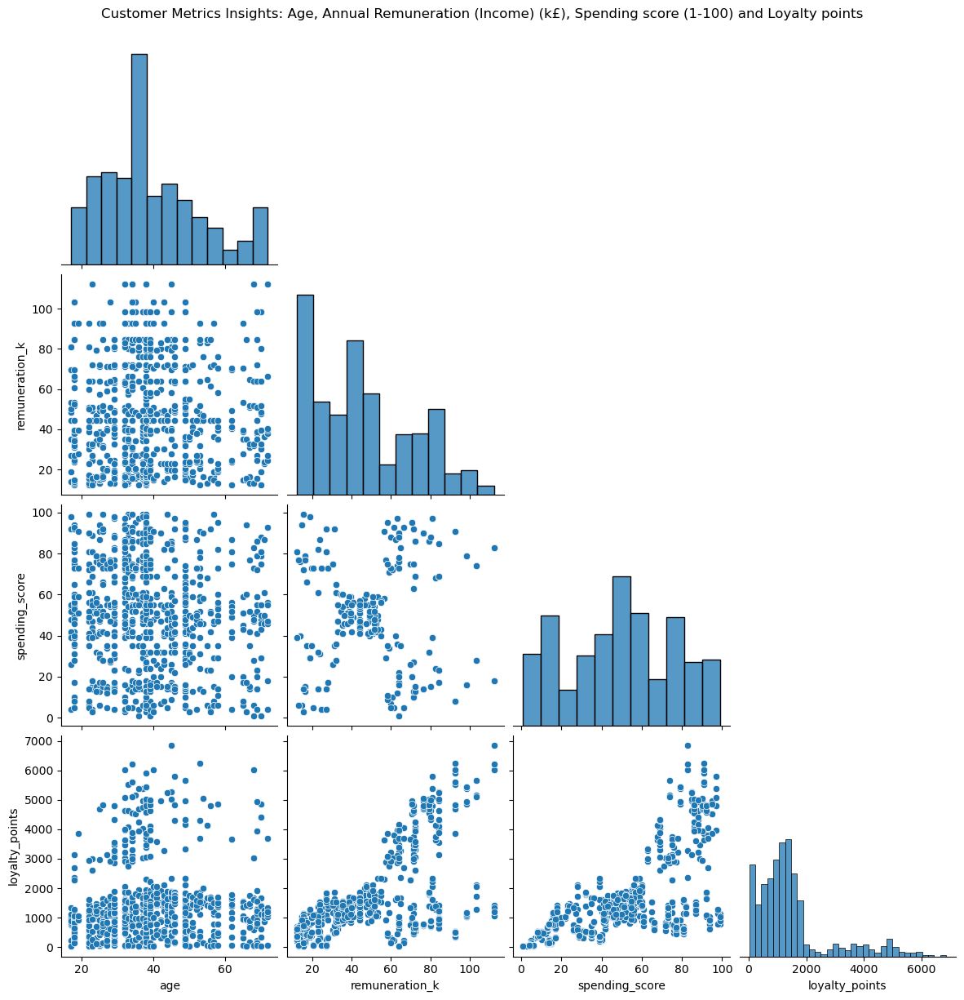

In [55]:
# Explore the data
# Select the columns with numerical values for the pairplot
num_columns = ['age','remuneration_k','spending_score','loyalty_points']

# Create a pairplot for the numerical columns to initially assess them
a = sns.pairplot(df[num_columns],corner=True,height=3)

# Set chart title
a.fig.suptitle("Customer Metrics Insights: Age, Annual Remuneration (Income) (k£), Spending score (1-100) and Loyalty points", y=1.02)

# Save the figure with 
a.fig.set_size_inches(12,12)
a.savefig('Pairplot',dpi=300)

plt.show()

### **Transformations of the Loyalty points**

Since the loyalty points showed non-normallity on the previous historgram and since there is a non-linear relationship between it and the age, two tranformations were applied to see if they would positively affect the data and hence better prep it for linear regression or multiple linear regression:
- Log Transformation of the loyalty points
- Square root transformation of the loyalty points

***Log Transformation Observations***
The log transformation negatively affected the linear relation between loyalty points and both remuneration and spending score. 

It also didn't help in normalizing the loyalty points nor did it improve the linearity of the log loyalty vs age. 


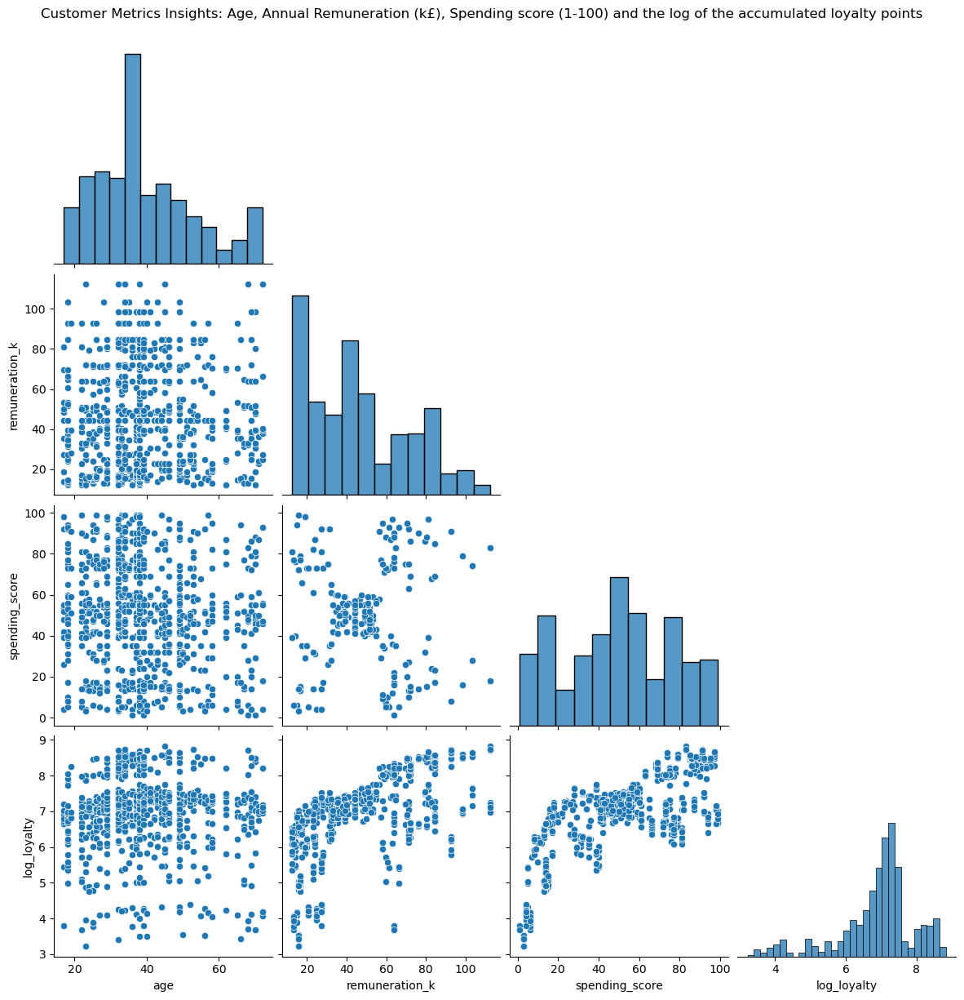

In [58]:
# Use the log of the loyalty points
# This is to get a more normal distributed histogram of the loyalty points and prep for the regression modeling
df['log_loyalty']=np.log(df['loyalty_points'])

# Define the columns for the pairplot
log_columns = ['age','remuneration_k','spending_score','log_loyalty']

# Create a pairplot using the log loyalty column
log =sns.pairplot(df[log_columns],corner=True,height=3)

# Set chart title
log.fig.suptitle("Customer Metrics Insights: Age, Annual Remuneration (k£), Spending score (1-100) and the log of the accumulated loyalty points",
y=1.02)
plt.show()



***Square root transformation*** The square root transformation helped normalize the sq_loyalty histogram. 
The linear relation between sq_loyalty and both spending score and remuneration is still visible. 
The age linearity, however, didn't show improvements which strongly suggest that there is a non-linear relationship between age and loyalty points. 
The relationship between age and loyalty points could potentially be better modeled using different models.

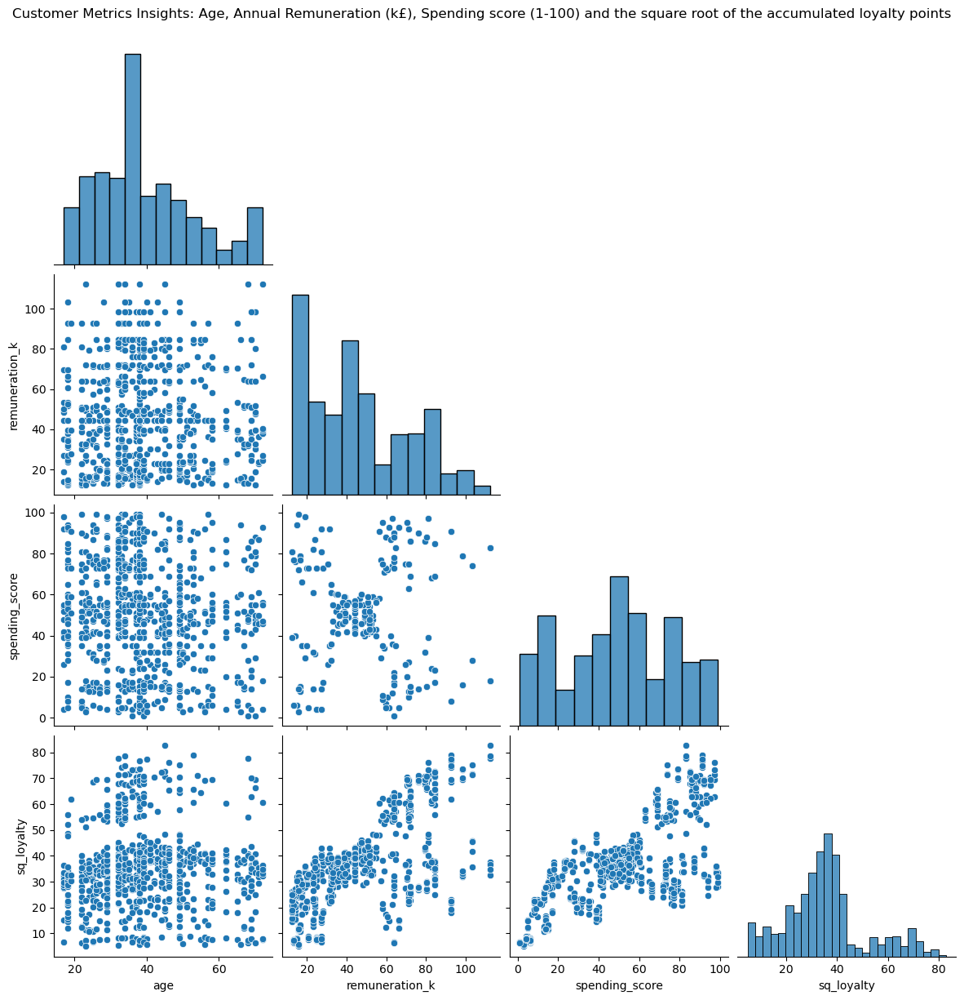

In [60]:
# Use the sqaure root of the loyalty points
# This is to get a more normal distributed histogram of the loyalty points and prep for the regression modeling
df['sq_loyalty']=np.sqrt(df['loyalty_points'])

# Define the columns for the pairplot
sqrt_columns = ['age','remuneration_k','spending_score','sq_loyalty']

# Create a pairplot using the log loyalty column
sqrt=sns.pairplot(df[sqrt_columns],corner=True,height=3)

# Set chart title
sqrt.fig.suptitle("Customer Metrics Insights: Age, Annual Remuneration (k£), Spending score (1-100) and the square root of the accumulated loyalty points",
y=1.02)
plt.show()

### **Gender Hue**
Adding the gender as a hue on the pairplot shows that the **female customers** consists the majority of the customer base and that's seen on all 4 historgrams. 

There is, however, a visible male dominance for the age brackets of 60+

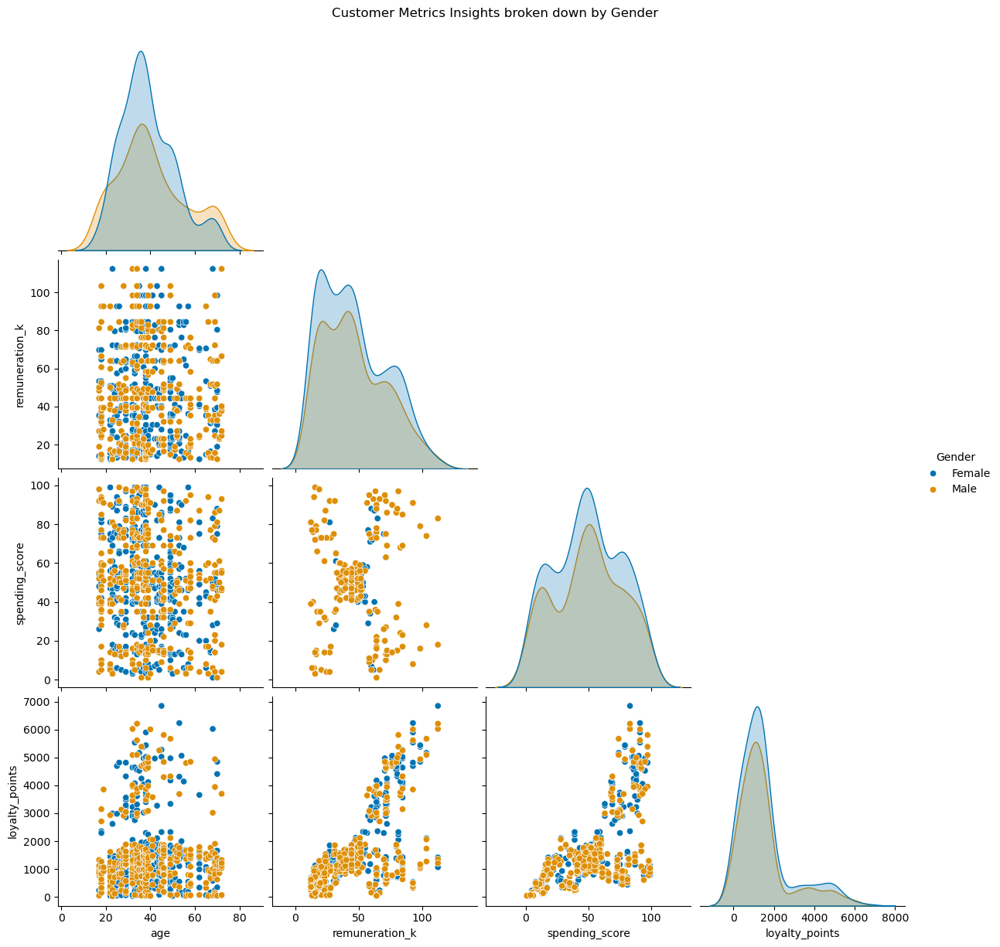

In [62]:
# Explore the data
# Select the columns with numerical values for the pairplot
gen_columns = ['age','remuneration_k','spending_score','loyalty_points','gender']

# Create a pairplot for the numerical columns to initially assess them
gen=sns.pairplot(df[gen_columns],hue='gender',corner=True,height=3,palette='colorblind')

# Set chart title
gen.fig.suptitle("Customer Metrics Insights broken down by Gender", y=1.02)
gen._legend.set_title("Gender")

plt.show()



### **Education Level**
Adding the Education as a hue on the pairplot we can deduct that **graduates** consist the majority of the customer base and this is by checking all 4 histograms

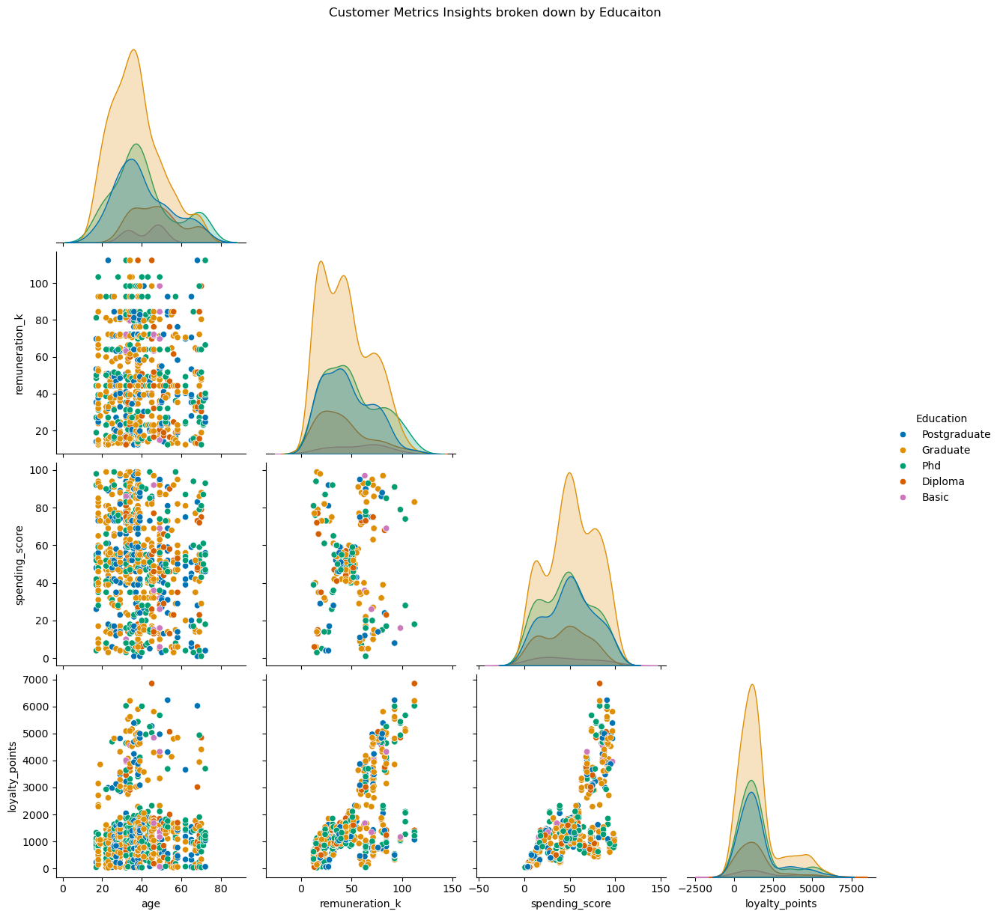

In [64]:
# Explore the data
# Select the columns with numerical values for the pairplot
edu_columns = ['age','remuneration_k','spending_score','loyalty_points','education']

# Create a pairplot for the numerical columns to initially assess them
ed = sns.pairplot(df[edu_columns],hue='education',corner=True,height=3,palette='colorblind')

# Set chart title
ed.fig.suptitle("Customer Metrics Insights broken down by Educaiton", y=1.02)
ed._legend.set_title("Education")

plt.show()

### **Preliminary Statistic Obsevation**

**Age**
1. The middle 50% of the customers are between 29 and 49
2. The range of the customers' age is 72-17 = 55 years
3. The data has a slight right skew since the mean is slightly higher than the median

**Remuneration**
1. The middle 50% of the customers earn between 23.16 and 63.96 k a year
2. The top 25% of the customers earn between 63.96k and 112.34k 
3. The range of the customers' remuneration is 112.34 - 12.3 = 100.4 which is quite a big range that's definitely affected by the top earners in the set.
4. The data has a slight right skew since the mean is also slightly higher than the median

**Spending Score**
1. The middle 50% of the customers have a spending score that ranges between 29 and 73
2. The range is quite large with a value of 98
3. The spending score is fairly normally distributed

**Loyalty points**
1. The data has a right skew suggesting that most clients have fewer loyalty points with only a few with very high loyalty points positively affecting the mean
2. The middle 50% of the customers have loyalty points between 701 and 1658 confirming the previous observation.

In [66]:
# Basic descriptive statistics.
df[num_columns].describe()

,age,remuneration_k,spending_score,loyalty_points
count,782.000000,782.000000,782.000000,782.000000
mean,39.554987,46.058414,49.604859,1497.404092
std,13.666746,25.249759,26.593610,1313.241715
min,17.000000,12.300000,1.000000,25.000000
25%,29.000000,23.165000,29.000000,701.000000
50%,38.000000,44.280000,50.000000,1187.000000
75%,49.000000,63.960000,73.000000,1658.000000
max,72.000000,112.340000,99.000000,6847.000000


In [67]:
# Calculate the outlier percentage in the loyalty points
# Calculate the 1st and 3rd quartile of the loyalty points data
Q1 = df['loyalty_points'].quantile(0.25)
Q3 = df['loyalty_points'].quantile(0.75)

# Calculate the interquartile range
IQR = Q3 - Q1

# Calculate the lower and upper bounds of the data
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Create a DataFrame including only loyalty point data that are below or above the lower and upper bound
outliers = df[(df['loyalty_points'] < lower_bound) | (df['loyalty_points'] > upper_bound)]

# Calcualte an outlier percentage
outlier_percentage = len(outliers) / len(df) * 100

# Print out the outlier percentage
print(f"Loyalty points outlier percentage: {outlier_percentage:.2f}%")

Loyalty points outlier percentage: 12.92%


### **Correlation Observations**
**Positive Correlation**
- There is mild positive correlation between loyalty points, spending score and remuneration.

**Weak Correlation**
- There is weak correlation between age and all the other factors.
- There is a weak negative correlation between age and spending score, suggesting that the higher the customer age the lower their spending is.

In [69]:
# Calculate the correlation for all 4 variables
df[num_columns].corr()

,age,remuneration_k,spending_score,loyalty_points
age,1.000000,0.006024,-0.124630,0.028904
remuneration_k,0.006024,1.000000,-0.001645,0.630901
spending_score,-0.124630,-0.001645,1.000000,0.632116
loyalty_points,0.028904,0.630901,0.632116,1.000000


## 7. Linear regression

### 7a) spending vs loyalty
Since the spending score and the loyalty points showed linearity, they are modeled using a simple linear regression. 

Further checks are then carried out to see the suitability of the model.

**OLS Regression results**
- pvalue < 0.05 showing that spending score is statistically significant, meaning that it has a positive effect on the loyalty points collected by the customers
- R-squared value shows that the changes in the spending score explain around 40% of the variability in the collected loyalty points.
- The value of the R-squared can be better improved by adding more variables or considering meaningful transformations.

**Heteroscedasticity**
- Plotting the residuals vs the spending score, we can see heteroscedasticity (funnel shaped plot). This indicates that the variance of the residuals is affected by the change in the spending score. This makes the results in the ols regression table less reliable as it violates one key-assumption of the linear regression model

In [72]:
# Define independent variable.
x_sp = df['spending_score']

# Define dependent variable.
y_sp = df['loyalty_points']

# Create model and print summary of metrics.
# Run the OLS test
sp = 'y_sp ~ x_sp'
test_spend = ols(sp,data = df).fit() 

# View the output
test_spend.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   y_sp   R-squared:                       0.400
Model:                            OLS   Adj. R-squared:                  0.399
Method:                 Least Squares   F-statistic:                     519.1
Date:                Sun, 20 Jul 2025   Prob (F-statistic):           1.80e-88
Time:                        14:18:21   Log-Likelihood:                -6524.6
No. Observations:                 782   AIC:                         1.305e+04
Df Residuals:                     780   BIC:                         1.306e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    -51.0144     77.103     -0.662      0.508    -202.369     100.340
x_sp          31.2151      1.370     22.783      0.000      28.526      33.905
==============================================================================
Omnibus:                       88.013   Durbin-Watson:                   1.125
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              148.229
Skew:                           0.739   Prob(JB):                     6.49e-33
Kurtosis:                       4.537   Cond. No.                         119.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [73]:
# Set the X coefficient and the constant to generate the regression table.
# x coef: 31.2151
# Constant coef: --51.0144	
# Create the linear equation.
y_pred_sp = -51.0144 + 31.2151 * x_sp

# View the output.
y_pred_sp

0      1197.5896
1      1634.6010
2      1447.3104
3       760.5782
4      2477.4087
         ...    
777    1697.0312
778    1416.0953
779    1665.8161
780    2851.9899
781     510.8574
Name: spending_score, Length: 782, dtype: float64

In [74]:
# Create a user defined function to plot a scatter plot with a line of best fit / zero line for residuals charts

def scat_line(X,Y,Ypred,title,Xlabel,Ylabel):
    ''' The aim of this function is to create scatter plots and best fit lines or zero lines for residual charts. 
    The function starts by plotting the scatter plot of the passed X and Y variables, and then moves onto drawing the line. 
    Titles and chart labels are passed to the function to produce labeled charts'''

    # Plot the scatter plot
    plt.scatter(X, Y,alpha=0.7)

    # Plot the line
    plt.plot(X, Ypred, color='red')

    # Add titles and x and y axis labels
    plt.title(title)
    plt.xlabel(Xlabel)
    plt.ylabel(Ylabel)
    # Save the figure with 
    plt.tight_layout()
    plt.savefig(title,dpi=300)

    plt.show()

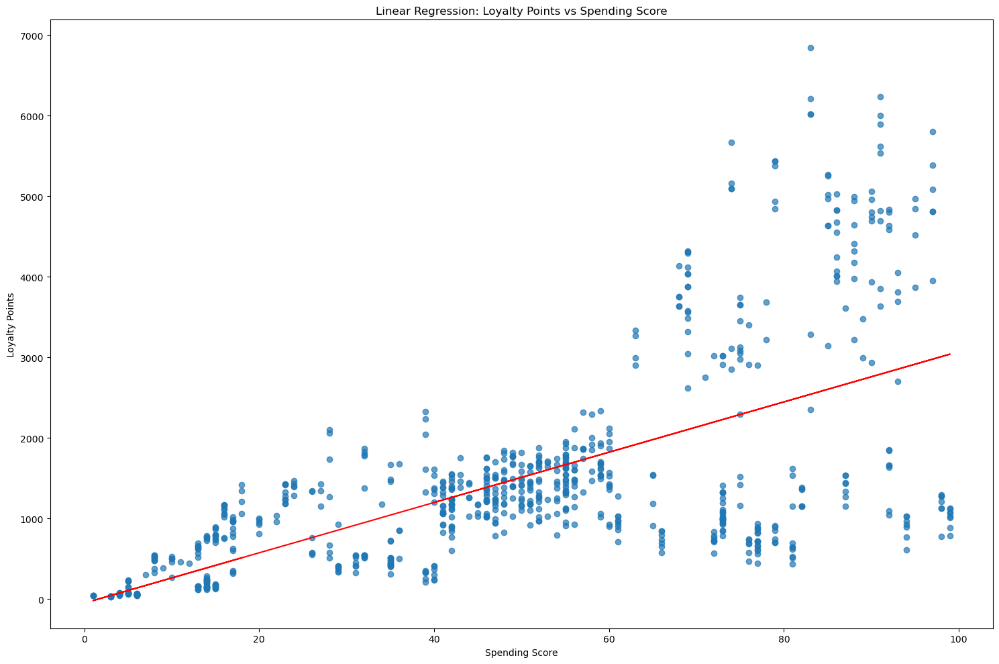

In [75]:
# Plot the Linear Regression model using the predefined function
scat_line(x_sp,y_sp,y_pred_sp,'Linear Regression: Loyalty Points vs Spending Score',
          'Spending Score','Loyalty Points')

### Residuals chart observation
Residuals chart is showing heteroscedasticity which means that the model's prediction error is not constant but is affected by the changes in the input values
This affects the p-values in the ols results which means the shown values are unreliable. 

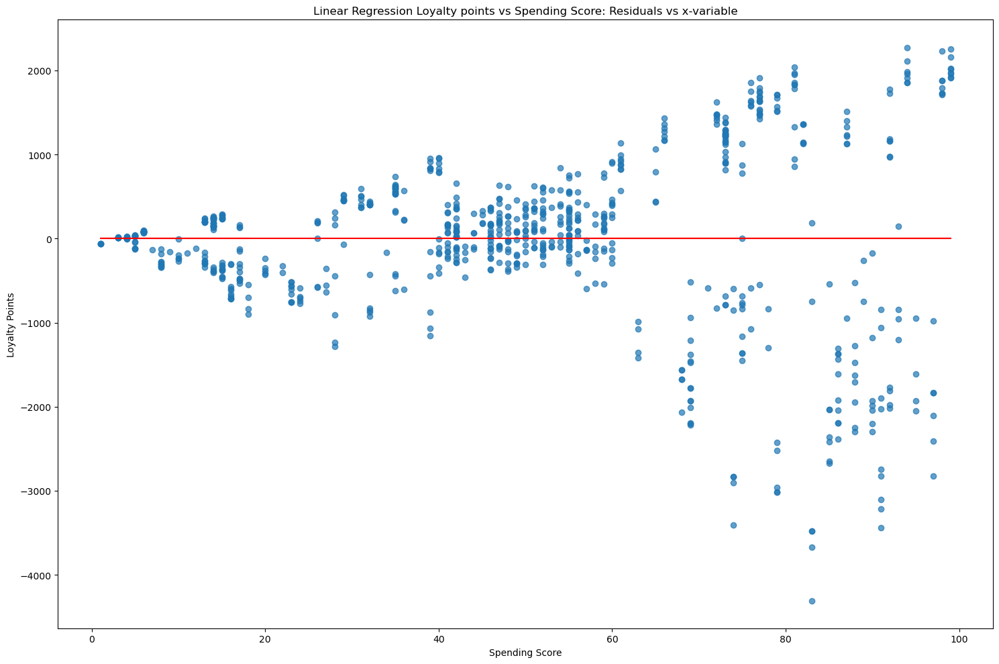

In [77]:
# Plot the residuals=(y-predict - y-observe) versus the x-values.
# Ideally, there should be no pattern in this plot

scat_line(x_sp,test_spend.predict()-y_sp,y_sp-y_sp,'Linear Regression Loyalty points vs Spending Score: Residuals vs x-variable',
          'Spending Score','Loyalty Points')

### 7b) remuneration vs loyalty

Since the remuneration and the loyalty points showed linearity, they are modeled using a simple linear regression. 

Further checks are then carried out to see the suitability of the model.

**OLS Regression results**
- pvalue < 0.05 showing that remuneration is statistically significant, meaning that it has a positive effect on the loyalty points collected by the customers
- R-squared value shows that changes in the remuneration explain around 39.8% of the variability in the collected loyalty points.
- The value of the R-squared can be improved by adding more variables or considering meaningful transformations.

**Heteroscedasticity**
- Plotting the residuals vs the remuneration, we can see heteroscedasticity (funnel shaped plot). This indicates that the variance of the residuals is affected by the change in the spending score. This makes the results in the ols regression table less reliable. 

In [80]:
# Define independent variable.
x_rn = df['remuneration_k']

# Define dependent variable.
y_rn = df['loyalty_points']

# Create model and print summary of metrics.
# Run the OLS test
rn = 'y_rn ~ x_rn'
test_renu = ols(rn,data = df).fit() 

# View the output
test_renu.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   y_rn   R-squared:                       0.398
Model:                            OLS   Adj. R-squared:                  0.397
Method:                 Least Squares   F-statistic:                     515.8
Date:                Sun, 20 Jul 2025   Prob (F-statistic):           4.87e-88
Time:                        14:18:22   Log-Likelihood:                -6525.6
No. Observations:                 782   AIC:                         1.306e+04
Df Residuals:                     780   BIC:                         1.306e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    -13.9200     75.881     -0.183      0.854    -162.875     135.035
x_rn          32.8132      1.445     22.710      0.000      29.977      35.649
==============================================================================
Omnibus:                       21.752   Durbin-Watson:                   2.184
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               36.593
Skew:                           0.205   Prob(JB):                     1.13e-08
Kurtosis:                       3.977   Cond. No.                         109.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [81]:
# Set the X coefficient and the constant to generate the regression table.
# x coef: 32.8132
# Constant coef: -13.92
# Create the linear equation.
y_pred_rn = -13.92 + 32.8132 * x_rn

# View the output.
print('Predicted values for the loyalty points and remuneration model ')
y_pred_rn


Predicted values for the loyalty points and remuneration model 


0       443.496008
1      1143.073432
2      1735.023560
3      2273.160040
4       389.682360
          ...     
777    1223.793904
778    1277.607552
779    1304.514376
780    2165.532744
781    3672.314888
Name: remuneration_k, Length: 782, dtype: float64

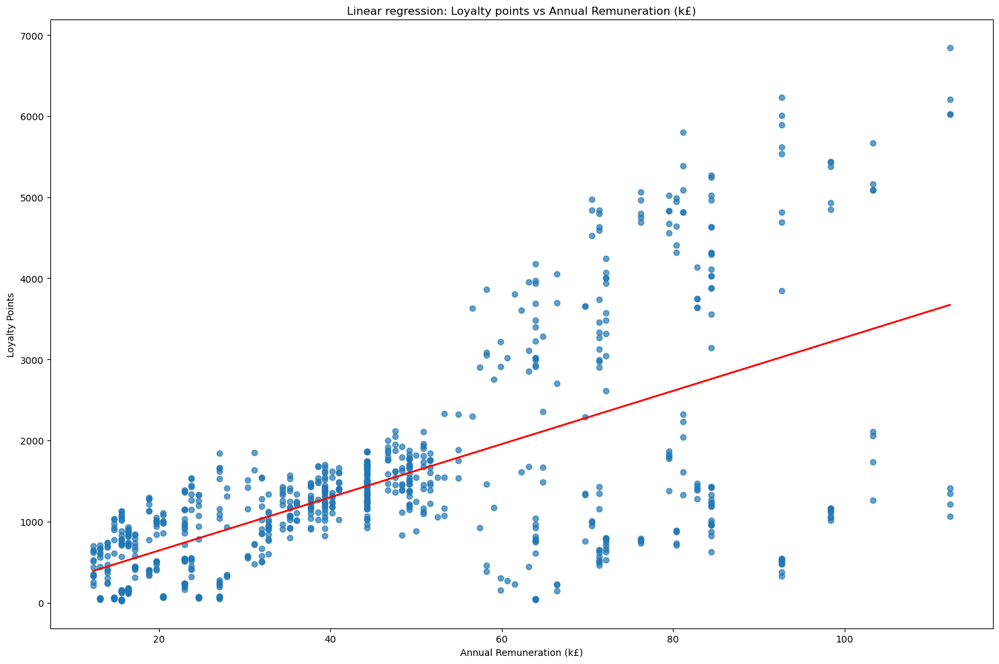

In [82]:
# Plot the Linear Regression model using the predefined function
scat_line(x_rn,y_rn,y_pred_rn,'Linear regression: Loyalty points vs Annual Remuneration (k£)',
          'Annual Remuneration (k£)','Loyalty Points')

### Residuals chart observation
Residuals chart is showing heteroscedasticity which means that the model's prediction error is not constant but is affected by the changes in the input values
This affects the the p-values in the ols results which means the shown values are unreliable. 

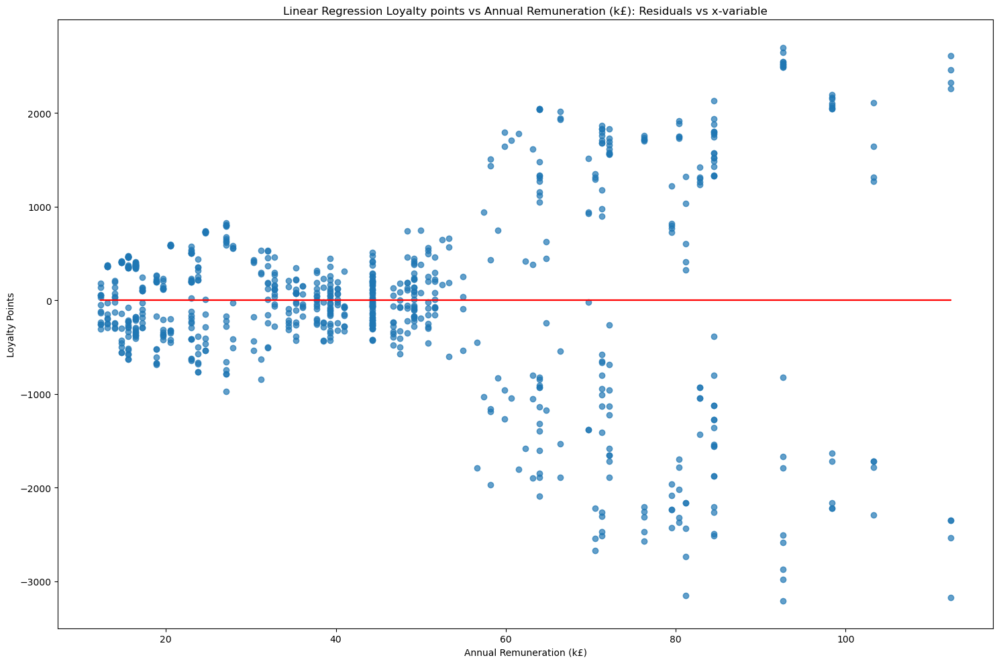

In [84]:
# Plot the residuals=(y-predict - y-observe) versus the x-values.
# Ideally, there should be no pattern in this plot

scat_line(x_rn,test_renu.predict()- y_rn,y_rn - y_rn,'Linear Regression Loyalty points vs Annual Remuneration (k£): Residuals vs x-variable',
          'Annual Remuneration (k£)','Loyalty Points')

### 7c) age vs loyalty


There is no linear relation between the age and loyalty as previously mentioned. So the expectation is for the linear regression model not to be suitable for modelling the age and loyalty. 

This is confirmed by the following:

- The P-value for the age as an independent factor is higher than 0.05 with a value of 0.42 which means that age is not significant to the loyalty points.
- The scatter plot is showing non-linearity and doesn't look like a typical linear regression plot
- The Residuals chart is showing heteroscedasticity which is expected.

**Age** will not be excluded for now as an independent variable as it could give better results with other models. 

In [87]:
# Define independent variable.
x_ag = df['age']

# Define dependent variable.
y_ag = df['loyalty_points']

# Create model and print summary of metrics.
# Run the OLS test
ag = 'y_ag ~ x_ag'
test_ag = ols(ag,data = df).fit() 

# View the output
test_ag.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   y_ag   R-squared:                       0.001
Model:                            OLS   Adj. R-squared:                 -0.000
Method:                 Least Squares   F-statistic:                    0.6522
Date:                Sun, 20 Jul 2025   Prob (F-statistic):              0.420
Time:                        14:18:23   Log-Likelihood:                -6723.7
No. Observations:                 782   AIC:                         1.345e+04
Df Residuals:                     780   BIC:                         1.346e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1387.5427    143.917      9.641      0.000    1105.033    1670.052
x_ag           2.7774      3.439      0.808      0.420      -3.974       9.529
==============================================================================
Omnibus:                      236.296   Durbin-Watson:                   1.607
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              531.155
Skew:                           1.659   Prob(JB):                    4.58e-116
Kurtosis:                       5.302   Cond. No.                         128.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [88]:
# Set the X coefficient and the constant to generate the regression table.
# x coef: 2.7774
# Constant coef: 1387.5427
# Create the linear equation.
y_pred_ag = 1387.5427  +2.7774 * x_ag

# View the output.
print('Predicted values for the loyalty points and age model ')

y_pred_ag


Predicted values for the loyalty points and age model 


0      1434.7585
1      1434.7585
2      1434.7585
3      1434.7585
4      1437.5359
         ...    
777    1587.5155
778    1587.5155
779    1587.5155
780    1587.5155
781    1587.5155
Name: age, Length: 782, dtype: float64

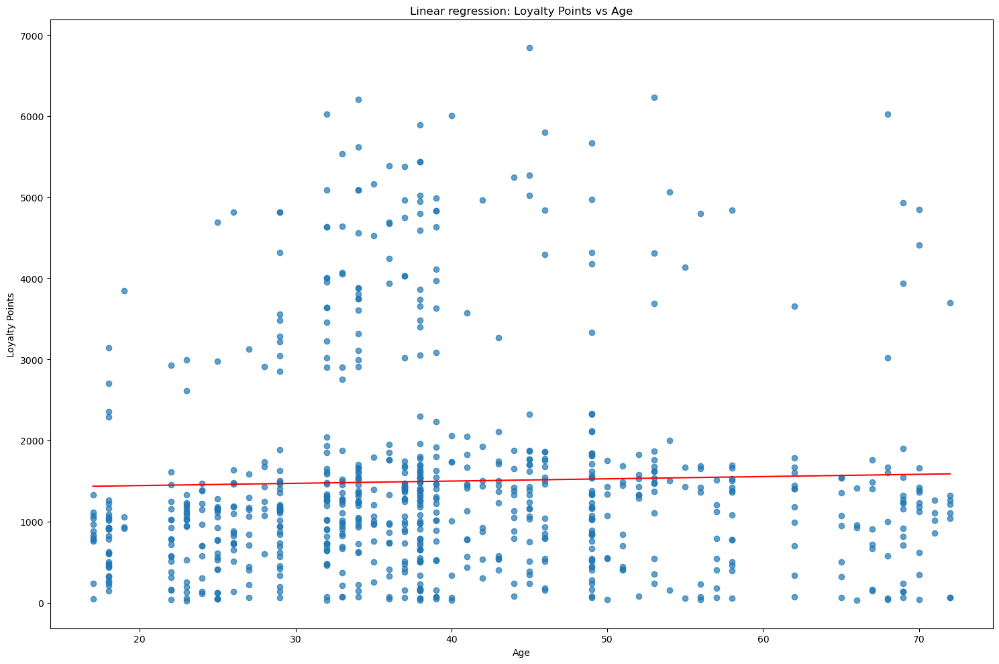

In [89]:
# Plot the Linear Regression model using the predefined function
scat_line(x_ag,y_ag,y_pred_ag,'Linear regression: Loyalty Points vs Age',
          'Age','Loyalty Points')

### Residuals chart observation
Residuals chart is showing heteroscedasticity which means that the model's prediction error is not constant but is affected by the changes in the input values
This affects the the p-values in the ols results which means the shown values are unreliable. 

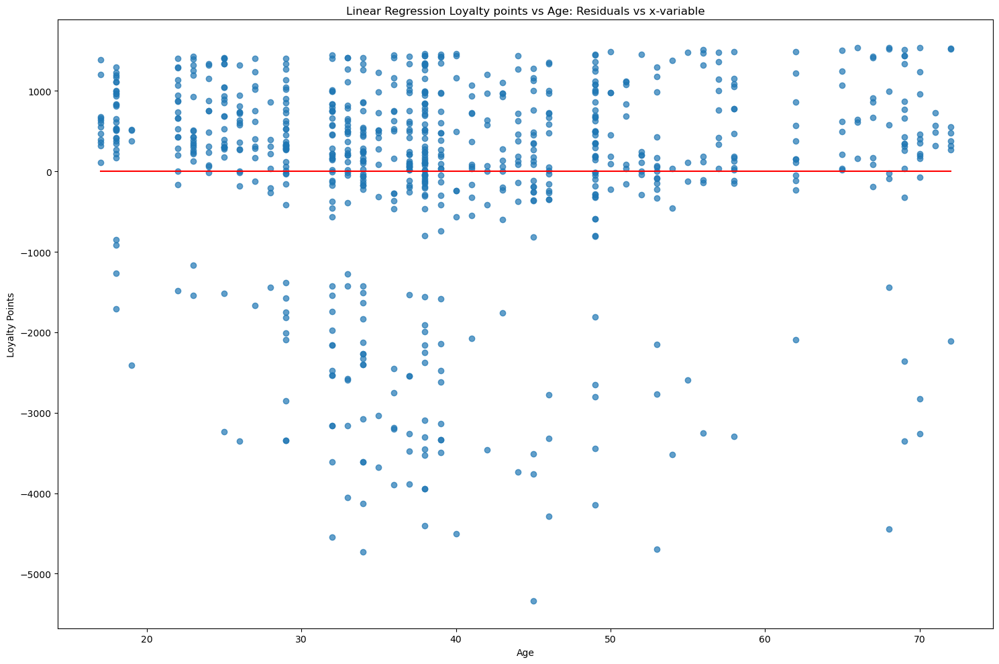

In [91]:
# Plot the residuals=(y-predict - y-observe) versus the x-values.
# Ideally, there should be no pattern in this plot
scat_line(x_ag,test_ag.predict()- y_ag,y_ag - y_ag,'Linear Regression Loyalty points vs Age: Residuals vs x-variable',
          'Age','Loyalty Points')

### Variance Inflaction Factor for all independent variables (age, remuneration and spending score)
The Variance inflation factor for the chosen independent variables is showing moderate (acceptable) collinearity. 

This means that we're still within the acceptable limits (<5) of using those independent variables without it negatively affecting the model.

Any higher values would mean that the considered independent variables are not in fact independent and would jeopardize the quality of the model. 

In [93]:
# User defined function to calculate the Variance Inflation Factor

def vif (df):
    '''The aim of this function is to calculate the variance inflation factor of each independent variable in the dataset.
    This is the measure of how strong the collinearity is between 
    independent variables. Individual collinearity values shouldn't exceed 5'''
    vif = pd.DataFrame()
    vif['VIF Factor'] = [variance_inflation_factor(df.values, i) for i in range(df.shape[1])]
    vif['features'] = df.columns
    return vif.round(1)

In [94]:
# Calculate the variance inflation factor (VIF)for each independent variable and save in DataFrame
# Create new dataframe with the considered dependent variables only
x_df = pd.DataFrame(df, columns=['age','remuneration_k','spending_score'])
vif(x_df)

,VIF Factor,features
0,4.2,age
1,3.5,remuneration_k
2,3.3,spending_score


In [95]:
# Calculate the variance inflation factor (VIF)for each independent variable and save in DataFrame
# Create new dataframe with the considered dependent variables only
x_df_ag = pd.DataFrame(df, columns=['remuneration_k','spending_score'])
vif(x_df_ag)

,VIF Factor,features
0,2.5,remuneration_k
1,2.5,spending_score


## 8. Multiple Linear Regression Model(MLR) using
Four MLR regression models will be built for comparison's sake and all models will have the loyalty points as the dependent variable:
1. MLR with age, spending score and remuneration_k
2. MLR with spending score and remuneration_k
3. MLR with the square root transformation of the loyalty points with age, spending score and remuneration_k as the independent variables
4. MLR with the square root transformation of the loyalty points with age, spending score and remuneration_k as the independent variables

The comparison aims to evaluate models, and based on a preliminary check of the previous simple linear regression models, there is sufficient reason for us to not consider the age as an independent variable. 
1. p-value for age and loyalty points >0.05 in the OLS results table which suggests low significance of age changes on loyalty points
2. Correlation results show the lowest correlation score between age and loyalty points
3. VIF score is the highest for age, suggesting a moderate collinearity between age, remuneration and spending score

However, assessing the results of all multiple linear regression models, we can conclude that no improvements were detected. This could be caused by the non-linear relation of the age with the loyalty points, which already suggests that a multiple linear regression may not be the best possible model to capture the data. 
A transformation of the loyalty points (namely taking the square root of the loyalty points) was also considered but there are still signs of heteroscedasticity and non-normal distribution of the residuals. 



In [97]:
# User defined function to model the data using multiple linear regression model and:
# - Perform both Breusch-Pagan and Shapiro-Wilk test 
# - Plot the actual vs predicated values 
# - Plot the residuals 
# - Plot the qq plot

def mlr (X_train,X_test,Y_train,Y_test,title):
    ''' This function is used to fit a multiple linear regression model using the input (train and test data). 
    The output consists of the following: 
    - Plot of the actual vs predicted values of the loyalty points. 
    - Plot of the residuals vs predicted values
    - QQ plot to check the normality of the residuals
    It then tests the data for heteroscedasticity using the Breusch-Pagan test and for normality using the Shapiro-Wilk test'''
    
    
    # Fitting the model using the statsmodel OLS library
    mlr = sm.OLS(Y_train,sm.add_constant(X_train)).fit()

    # Set the predicted response vector
    y_pred_mlr = mlr.predict(sm.add_constant(X_test))

    # Show a summary of the model
    print_mlr = mlr.summary()
    #print(Y_test.shape)
    #print(y_pred_mlr.shape)

    # View the output to print the regression table
    print(print_mlr)

    # Plot the actual vs predicted values MLR fit
    plt.scatter(Y_test, y_pred_mlr, alpha=0.7)
    # Add the refrence line
    plt.plot([Y_test.min(), Y_test.max()], [Y_test.min(), Y_test.max()], 'r--')  # reference line
    # Add a title and x and y labels on the chart
    plt.xlabel("Actual Values")
    plt.ylabel("Predicted Values")
    plt.title(f'{title} - Actual vs Predicted (MLR)')
    # Save the figure with 
    plt.tight_layout()
    plt.savefig(f'{title} - Actual vs Predicted (MLR)')
    plt.show()

    # Calculate the residuals 
    residuals = Y_test - y_pred_mlr
    # Plot the residuals vs predicted values
    plt.scatter(y_pred_mlr, residuals, alpha=0.7)
    plt.axhline(0, color='red', linestyle='--')
    # Add a title, x and y labels on the chart
    plt.xlabel("Predicted Values")
    plt.ylabel("Residuals")
    plt.title(f'{title} - Residuals vs Predicted Values')
    # Save the figure with 
    plt.tight_layout()
    plt.savefig(f'{title} - Residuals vs Predicted Values',dpi=300)
    plt.show()

    # Plot the qq plot
    sm.qqplot(residuals, line='45', fit=True)
    # Add a title, x and y labels on the chart
    plt.title(f'{title} - QQ Plot of Residuals')
    plt.ylabel("Residual Quartiles")
    plt.xlabel("Normal Quartiles")
    # Save the figure with 
    plt.tight_layout()
    plt.savefig(f'{title} - QQ Plot of Residuals',dpi=300)
    plt.show()

    # Shapiro Wilk Test on residuals
    stat_mlr,p_mlr = shapiro(residuals)
    print('Shapiro-Wilk statistic=%.3f, p_mlr=%.3f'% (stat_mlr,p_mlr))
    if p_mlr>0.05:
        print('Multiple Linear Regression of Loyalty points vs Age, Annual Remuneration (k£) and Spending score: Residuals appear normal')
    else: 
        print('Multiple Linear Regression of Loyalty points vs Age, Annual Remuneration (k£) and Spending score: Residuals are not normal')

    # Breusch-Pagan Test
    # Determine heteroscedasticity
    bp = sms.het_breuschpagan(mlr.resid,mlr.model.exog)
    terms_mlr = ['LM stat', 'LM Test p-value', 'F-stat', 'F-test p-value']

    print('Breusch-Pagan Test Results:')
    print(dict(zip(terms_mlr, bp)))

### 8a) MLR with age, spending score and remuneration_k


In [99]:
# Define the variables for the first MLR model
# Define the dependent variable
y_mlr1 = df['loyalty_points']

#Define the independent variables
X_mlr1 = df[['age','remuneration_k','spending_score']]

# Training and testing subsets with Multiple Linear Regression
X_train_mlr1,X_test_mlr1,y_train_mlr1,y_test_mlr1 = train_test_split(X_mlr1,y_mlr1,
                                                 test_size = 0.3,
                                                 random_state = 42)

print(X_train_mlr1.shape)
print(y_train_mlr1.shape)

(547, 3)
(547,)


                            OLS Regression Results                            
Dep. Variable:         loyalty_points   R-squared:                       0.805
Model:                            OLS   Adj. R-squared:                  0.804
Method:                 Least Squares   F-statistic:                     748.4
Date:                Sun, 20 Jul 2025   Prob (F-statistic):          2.10e-192
Time:                        14:18:24   Log-Likelihood:                -4254.2
No. Observations:                 547   AIC:                             8516.
Df Residuals:                     543   BIC:                             8534.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const          -1965.4246    102.935    -19.

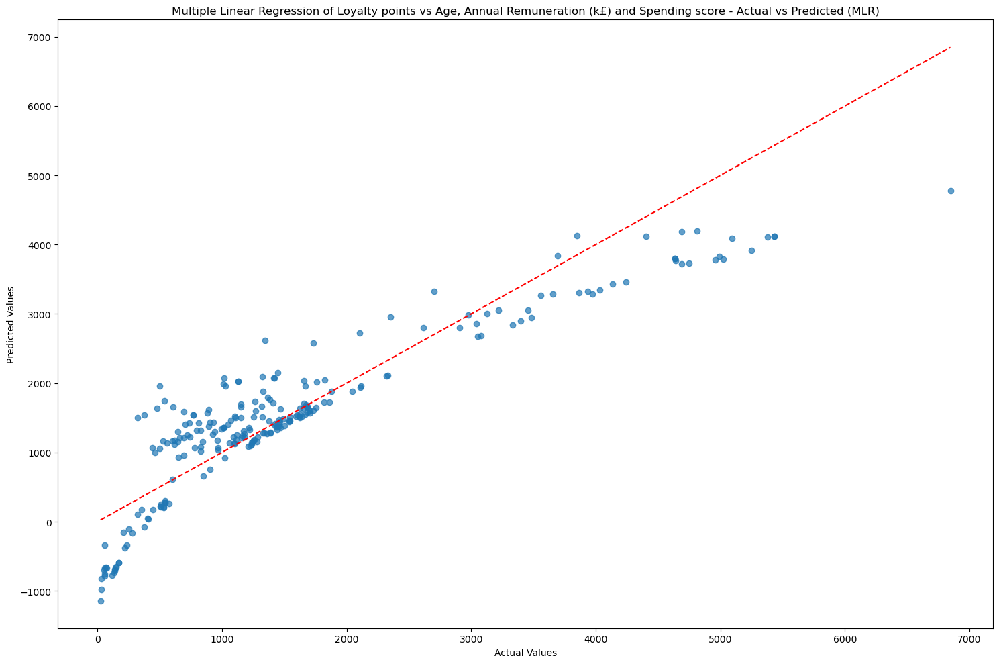

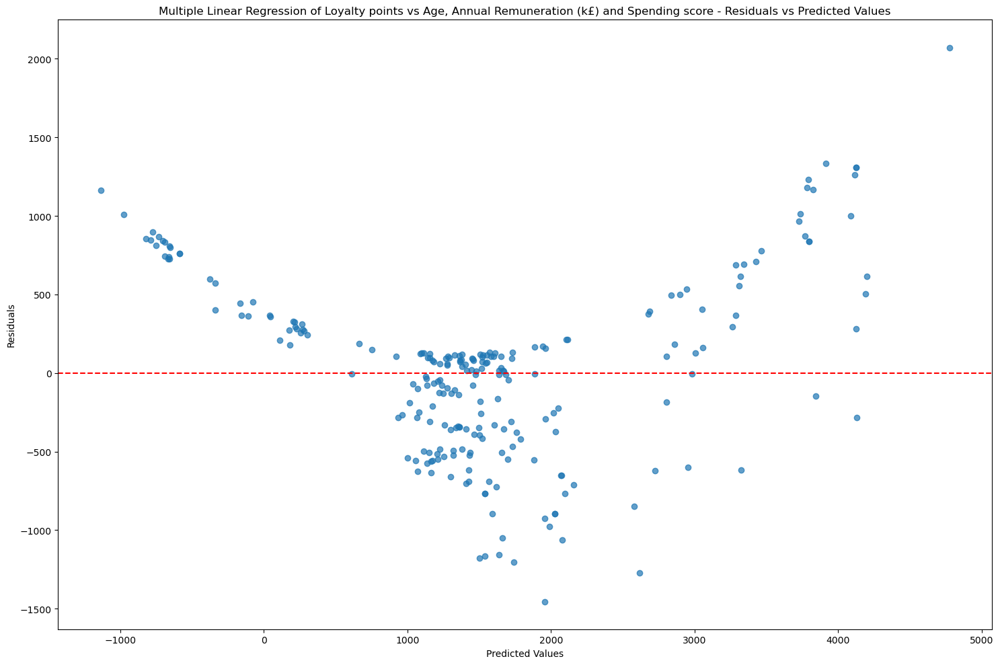

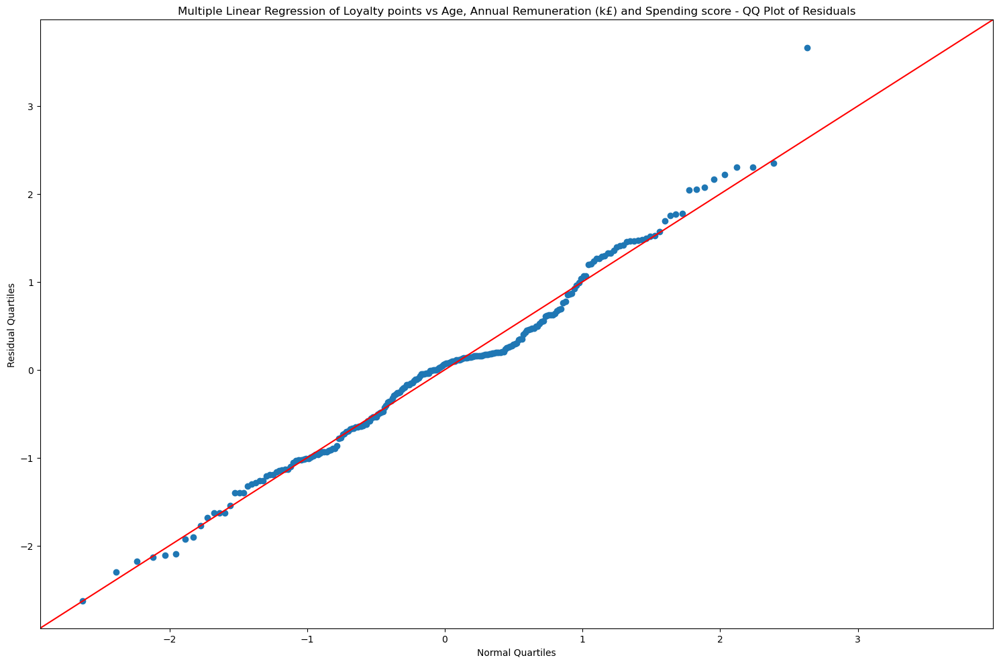

Shapiro-Wilk statistic=0.986, p_mlr=0.025
Multiple Linear Regression of Loyalty points vs Age, Annual Remuneration (k£) and Spending score: Residuals are not normal
Breusch-Pagan Test Results:
{'LM stat': 66.70341889133644, 'LM Test p-value': 2.1673102983569047e-14, 'F-stat': 25.137215824987102, 'F-test p-value': 3.054336012510113e-15}


In [100]:
# Build a mulitple linear regression model using the user defined function
mlr(X_train_mlr1,X_test_mlr1,y_train_mlr1,y_test_mlr1,'Multiple Linear Regression of Loyalty points vs Age, Annual Remuneration (k£) and Spending score')

#### Model observations and comments
The regression table results show p-value <0.05 for all independent variables. This suggests that each independent variable is statistically significant in explaining variability in the loyalty points. The model achieves and R-squared of 80.5% indicating that 80.5% of the variability in the loyalty points can be explained by the predictors
However, these results may not be reliable and this is because the model violated key linear regression assumptions:
- Heteroscedasticity is present as confirmed by the residuals plot and confirmed by the Breusch Pagan test (p-value <0.05)
- Non-Normal distribution of the residuals suggesting that errors don't follow a normal distribution
Alternative models will have to be considered.

### 8b) MLR with spending score and remuneration_k

In [103]:
# Define the variables for the first MLR model
# Define the dependent variable
y_mlr2 = df['loyalty_points']

#Define the independent variables
X_mlr2 = df[['remuneration_k','spending_score']]

# Training and testing subsets with Multiple Linear Regression
X_train_mlr2,X_test_mlr2,y_train_mlr2,y_test_mlr2 = train_test_split(X_mlr2,y_mlr2,
                                                 test_size = 0.3,
                                                 random_state = 42)

print(X_train_mlr2.shape)
print(y_train_mlr2.shape)

(547, 2)
(547,)


                            OLS Regression Results                            
Dep. Variable:         loyalty_points   R-squared:                       0.795
Model:                            OLS   Adj. R-squared:                  0.795
Method:                 Least Squares   F-statistic:                     1057.
Date:                Sun, 20 Jul 2025   Prob (F-statistic):          4.39e-188
Time:                        14:18:25   Log-Likelihood:                -4267.8
No. Observations:                 547   AIC:                             8542.
Df Residuals:                     544   BIC:                             8555.
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const          -1562.7685     70.707    -22.

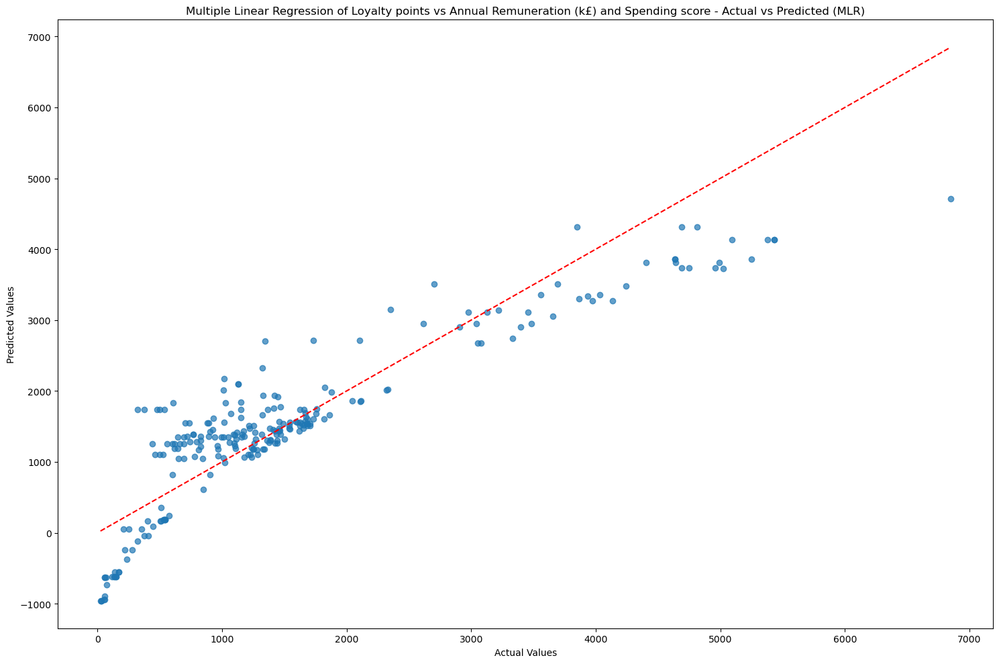

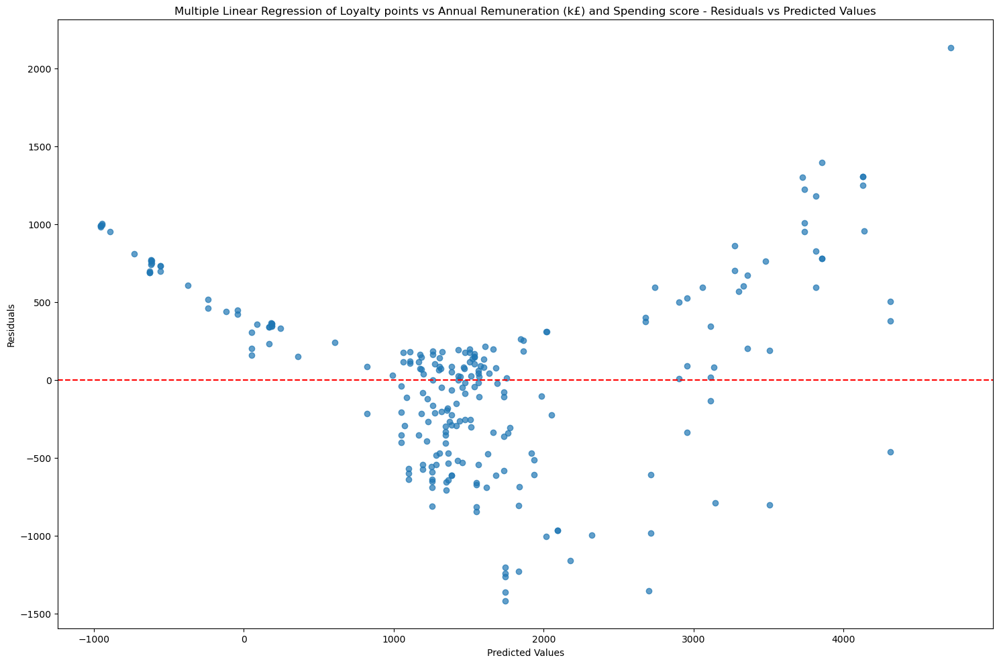

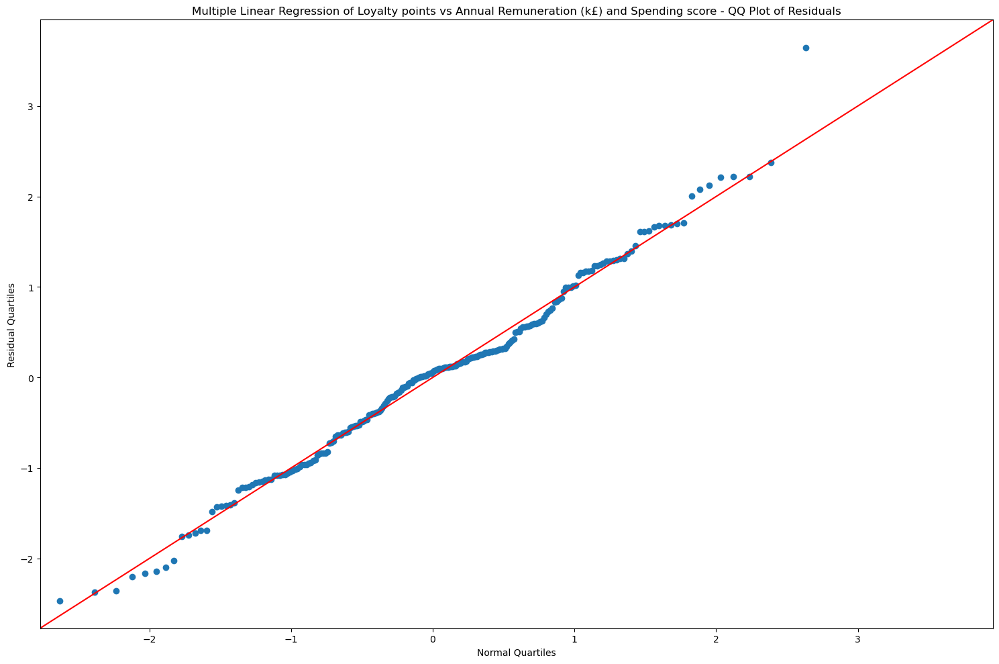

Shapiro-Wilk statistic=0.990, p_mlr=0.120
Multiple Linear Regression of Loyalty points vs Age, Annual Remuneration (k£) and Spending score: Residuals appear normal
Breusch-Pagan Test Results:
{'LM stat': 77.63798385752276, 'LM Test p-value': 1.383967884572244e-17, 'F-stat': 44.99199100686465, 'F-test p-value': 8.271935012479953e-19}


In [104]:
# Build a mulitple linear regression model using the user defined function
mlr(X_train_mlr2,X_test_mlr2,y_train_mlr2,y_test_mlr2,'Multiple Linear Regression of Loyalty points vs Annual Remuneration (k£) and Spending score')

#### Model Observations and comments
The regression table results show p-value <0.05 for all independent variables. This suggests that each independent variable is statistically significant in explaining variability in the loyalty points. The model achieves an R-squared of 79.5% indicating that 79.5% of the variability in the loyalty points can be explained by the predictors
However, these results may not be reliable and this is because the model violated key linear regression assumptions:
- Heteroscedasticity is present as confirmed by the residuals plot and confirmed by the Breusch Pagan test (p-value <0.05)
This model has shown improvement. Residuals follow a normal distribution and the accuracy has only slightly decreased. The heteroscedasticity, however, suggests that the results of this model could be unreliable. 
Alternative models will have to be considered.

### Multiple Linear Regression Model using transformed loyalty points
Two MLR regression models will be built for comparison's sake and both will have the **square root of the loyalty points** as the dependent variable:
1. MLR with age, spending score and remuneration_k
2. MLR with spending score and remuneration_k

The square root is used to transform the data since using the original loyalty points in the previous two models showed heteroscedasticity and they both failed the Shapiro Wilk test. 

Taking the square root of the loyalty points has reflected positively on the linear relation between the transformed loyalty points and the features. 
However, the residuals vs predicted values plot continues to show signs of heteroscedasticity, suggesting that the variance of the residuals is not constant. The QQ plot, showing the normality of the residuals' variance, has also not improved.
This suggests that the transformation hasn't really helped in fulfilling the assumptions of the linear regression model. 

And although we see improvement in the R-squared values in this case, this improvement should be treated with caution. This is because the current model violates important linear regression assumptions such as non-linearity, non-normality of the residuals and heteroscedasticity. This was noticed in both models with and without the age as an independent variable. 

This again strongly suggests that another model may be a better fit in this case. 

### 8c) MLR with tranformed loyalty points and with age, spending score and remuneration_k as the independent variables
This was done using the square root of the loyalty points.

In [108]:
# Define the variables for the MLR model
# Define the dependent variable
y_mlr3 = df['sq_loyalty']

#Define the independent variables
X_mlr3 = df[['age','remuneration_k','spending_score']]

# Training and testing subsets with Multiple Linear Regression
X_train_mlr3,X_test_mlr3,y_train_mlr3,y_test_mlr3 = train_test_split(X_mlr3,y_mlr3,
                                                 test_size = 0.3,
                                                 random_state = 42)

print(X_train_mlr3.shape)
print(y_train_mlr3.shape)

(547, 3)
(547,)


                            OLS Regression Results                            
Dep. Variable:             sq_loyalty   R-squared:                       0.895
Model:                            OLS   Adj. R-squared:                  0.894
Method:                 Least Squares   F-statistic:                     1540.
Date:                Sun, 20 Jul 2025   Prob (F-statistic):          5.11e-265
Time:                        14:18:27   Log-Likelihood:                -1670.4
No. Observations:                 547   AIC:                             3349.
Df Residuals:                     543   BIC:                             3366.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const             -8.5910      0.914     -9.

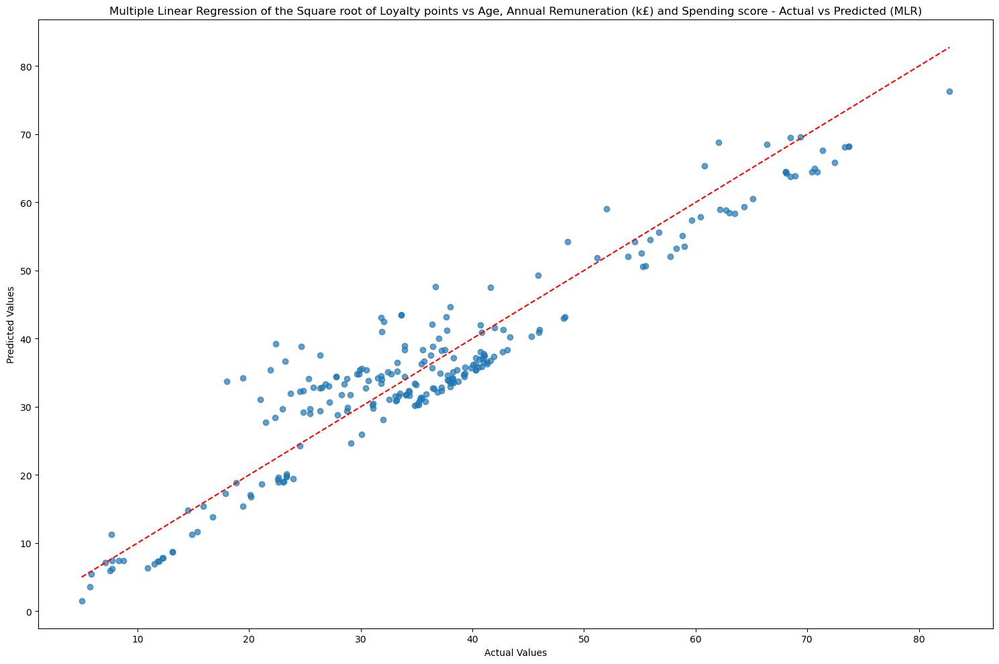

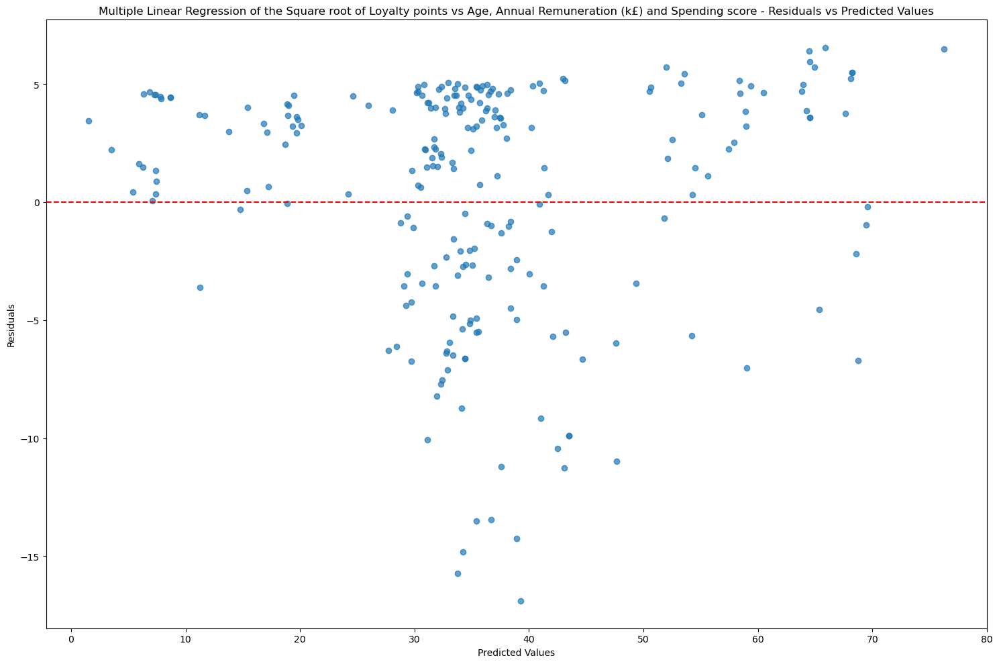

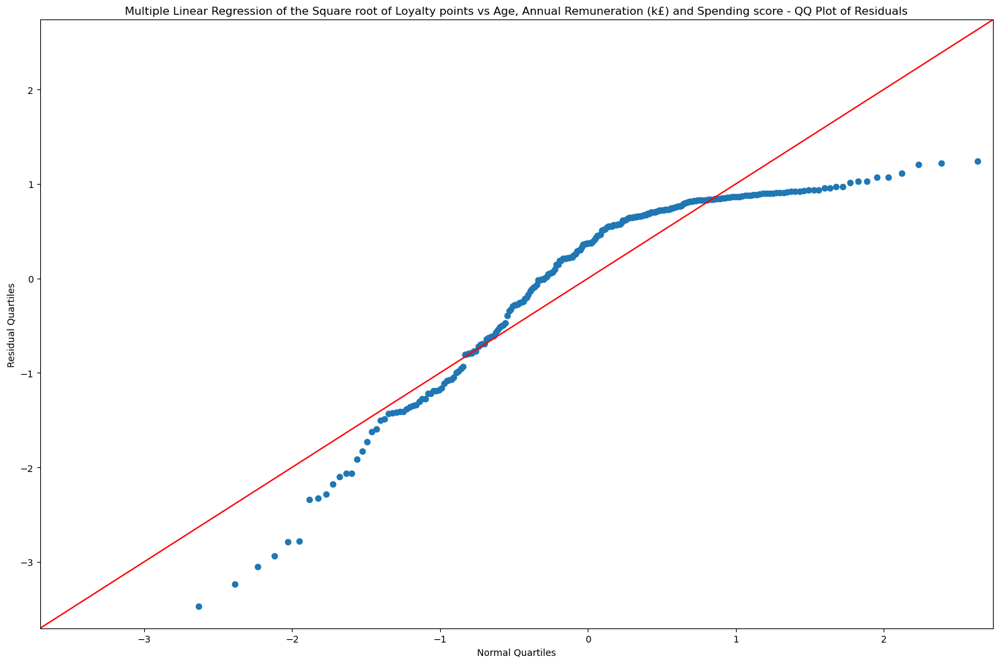

Shapiro-Wilk statistic=0.866, p_mlr=0.000
Multiple Linear Regression of Loyalty points vs Age, Annual Remuneration (k£) and Spending score: Residuals are not normal
Breusch-Pagan Test Results:
{'LM stat': 9.64894550540228, 'LM Test p-value': 0.021798499133271722, 'F-stat': 3.250126936329243, 'F-test p-value': 0.02156283710923841}


In [109]:
# Build a mulitple linear regression model using the user defined function
mlr(X_train_mlr3,X_test_mlr3,y_train_mlr3,y_test_mlr3,'Multiple Linear Regression of the Square root of Loyalty points vs Age, Annual Remuneration (k£) and Spending score')

#### Model Observations and comments
The regression table results show p-value <0.05 for all independent variables. This suggests that each independent variable is statistically significant in explaining variability in the loyalty points. The model achieves an R-squared of 89.5% indicating that 89.5% of the variability in the loyalty points can be explained by the predictors
However, the results may not be reliable, and this is because the model violated key linear regression assumptions despite the transformation applied to the loyalty points:
- Heteroscedasticity is present as confirmed by the residuals plot and confirmed by the Breusch Pagan test (p-value <0.05)
- Non-Normal distribution of the residuals suggesting that errors don't follow a normal distribution
- Due to the model's unreliability, predicted values were not inverse-transformed before plotting
Alternative models will have to be considered.

### 8d) MLR with tranformed loyalty points and with spending score and remuneration_k as the independent variables
This was done using the square root of the loyalty points. 

In [112]:
# Define the variables for the MLR model
# Define the dependent variable
y_mlr4 = df['sq_loyalty']

#Define the independent variables
X_mlr4 = df[['remuneration_k','spending_score']]

# Training and testing subsets with Multiple Linear Regression
X_train_mlr4,X_test_mlr4,y_train_mlr4,y_test_mlr4 = train_test_split(X_mlr4,y_mlr4,
                                                 test_size = 0.3,
                                                 random_state = 42)

print(X_train_mlr4.shape)
print(y_train_mlr4.shape)

(547, 2)
(547,)


                            OLS Regression Results                            
Dep. Variable:             sq_loyalty   R-squared:                       0.885
Model:                            OLS   Adj. R-squared:                  0.884
Method:                 Least Squares   F-statistic:                     2088.
Date:                Sun, 20 Jul 2025   Prob (F-statistic):          6.15e-256
Time:                        14:18:28   Log-Likelihood:                -1695.4
No. Observations:                 547   AIC:                             3397.
Df Residuals:                     544   BIC:                             3410.
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const             -3.6962      0.641     -5.

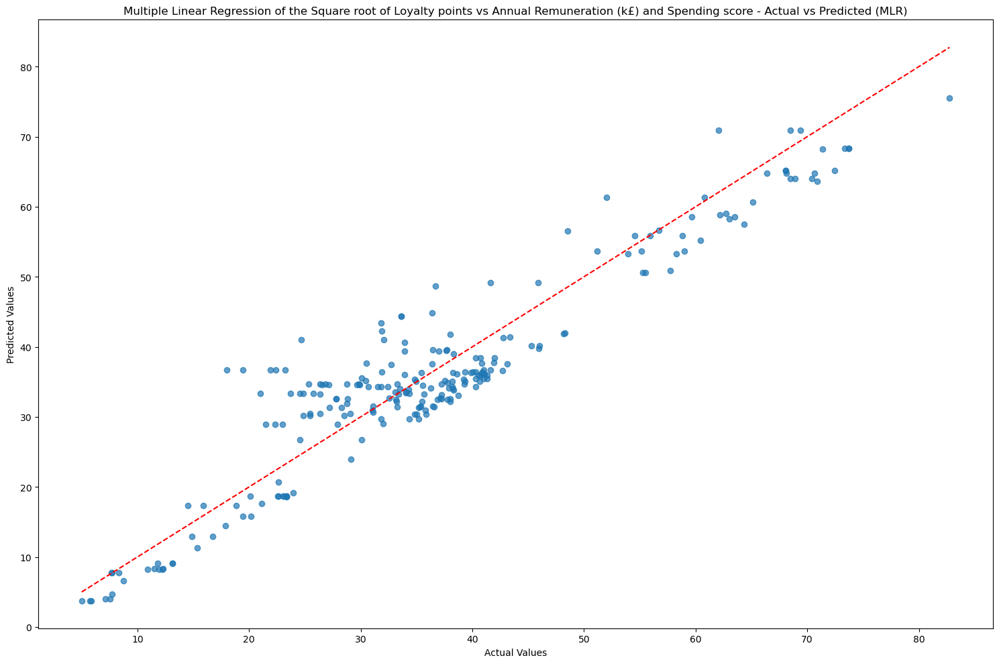

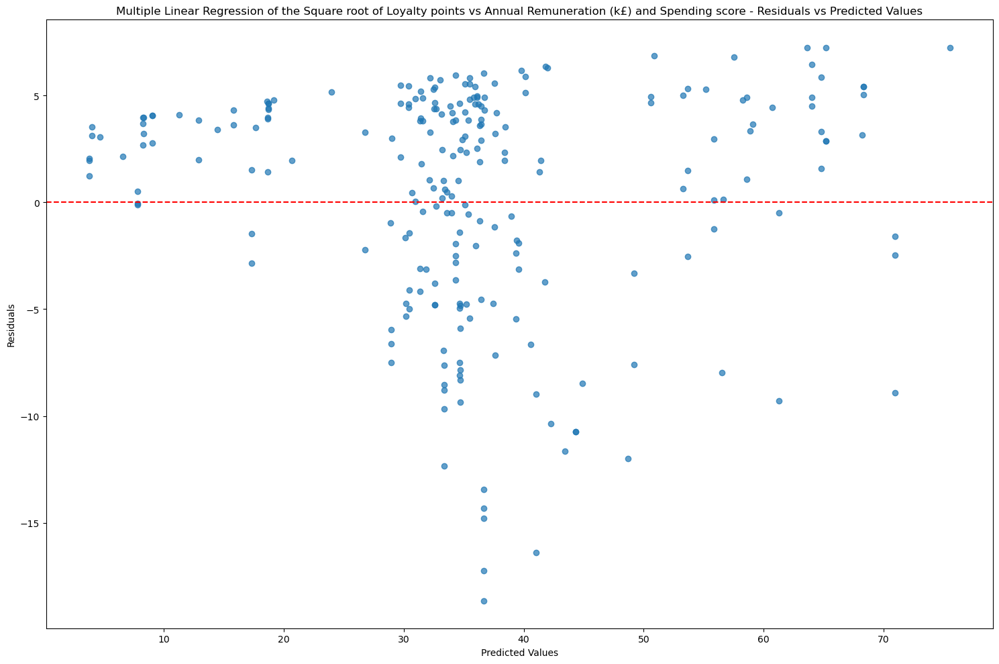

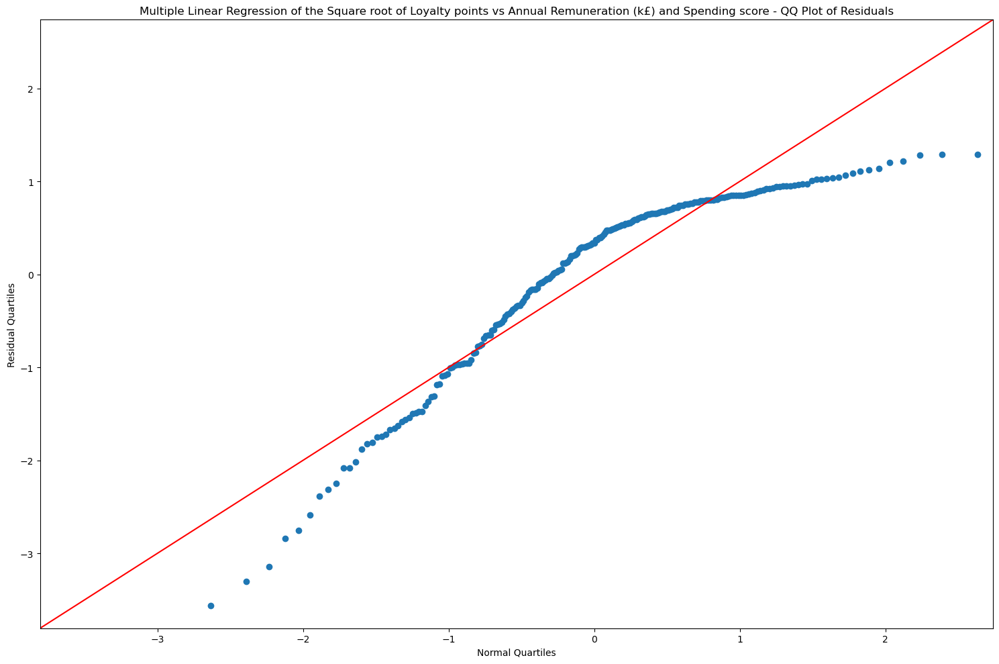

Shapiro-Wilk statistic=0.881, p_mlr=0.000
Multiple Linear Regression of Loyalty points vs Age, Annual Remuneration (k£) and Spending score: Residuals are not normal
Breusch-Pagan Test Results:
{'LM stat': 11.52716838604063, 'LM Test p-value': 0.0031398376223694445, 'F-stat': 5.855366726174936, 'F-test p-value': 0.0030481135908769995}


In [113]:
# Build a mulitple linear regression model using the user defined function
mlr(X_train_mlr4,X_test_mlr4,y_train_mlr4,y_test_mlr4,'Multiple Linear Regression of the Square root of Loyalty points vs Annual Remuneration (k£) and Spending score')

#### Model Observations and comments
The regression table results show p-value <0.05 for all independent variables. This suggests that each independent variable is statistically significant in explaining variability in the loyalty points. The model achieves an R-squared of 88.5% indicating that 88.5% of the variability in the loyalty points can be explained by the predictors
However, the results may not be reliable, and this is because the model violated key linear regression assumptions despite the transformation applied to the loyalty points:
- Heteroscedasticity is present as confirmed by the residuals plot and confirmed by the Breusch Pagan test (p-value <0.05)
- Non-Normal distribution of the residuals suggesting that errors don't follow a normal distribution
- Due to the model's unreliability, predicted values were not inverse-transformed before plotting
Alternative models will have to be considered.

### Drop the log and square root column of the loyalty points

In [116]:
# Drop the log and square root columns from the DataFrame to update the saved csv file
df.drop(columns = ['log_loyalty','sq_loyalty'], inplace=True)


In [117]:
df.head()

,gender,age,remuneration_k,spending_score,loyalty_points,education,count
0,Female,17,13.94,40,233,Postgraduate,1
1,Female,17,35.26,54,797,Postgraduate,1
2,Female,17,53.30,48,1071,Postgraduate,7
3,Female,17,69.70,26,759,Postgraduate,1
4,Female,18,12.30,81,436,Graduate,1


## 9. Linear Regression - Observations and insights

**Linear Regression**
A linear regression model was initially applied, but it proved to not be suitable for the data at hand. This is because linear regression assumptions, such as homoscedasticity and normality of the residuals, were violated. This has remained unchanged even after applying common data transformations (such as the log and the square root of the loyalty points).
A more flexible model would help better depict the data and build a robust regression model. Decision tree regressor would be considered as it is better suited for complex, non-linear relationships and doesn't require the fulfillment of the linear regression assumptions. 

For the transformed models as they still didn't fulfill the linear regression assumptions, the data was not reverted back to its original form. 

Other models would then be investigated to try and find a model that better suits the data at hand. 


# II. Further Predictive Modeling: Decision Tree and Random Forest Regressors

## Methodology

**Data Prep for a Regression Tree**

To prepare the data for DecisionTreeRegressor and RandomForestRegressor the following steps were taken:
Dummy variables were created for the following categorical columns:
   - gender
   - education

**Decision Tree / Random Forest Regressor**

The thinking process behind the DecisionTreeRegressor is as follows:
1. An original tree was created with no restrictions
2. Results were evaluated and over-fitting was suspected
3. Feature importance was evaluated to determine the features to be included
4. R-squared score vs Tree depth were plotted to identify the ideal tree depth for pruning
5. Pruned tree was created based on a max_depth of 9
6. Features with low-importance were removed and the results of the pruned tree were re-evaluated
7. RandomForestRegressor was created based on the features with high importance namely spending_score and remuneration
8. Evaluation metrics were assessed for all the models. This includes R-squared, MAE, RMSE

## 1. Load and prepare the data

In [125]:
# To avoid any accidental changes in the DataFrame with unique customers
# Upload the file again from the cleaned up turtle_uni_customers
df2 = pd.read_csv('turtle_uni_customers.csv')
df2.head()

,gender,age,remuneration_k,spending_score,loyalty_points,education,count
0,Female,17,13.94,40,233,Postgraduate,1
1,Female,17,35.26,54,797,Postgraduate,1
2,Female,17,53.30,48,1071,Postgraduate,7
3,Female,17,69.70,26,759,Postgraduate,1
4,Female,18,12.30,81,436,Graduate,1


In [126]:
# Define categorical variables
cat_vars = ['gender', 'education']

# Create dummy variables with drop_first to avoid multicollinearity
df_dummies = pd.get_dummies(df2, columns=cat_vars, drop_first=True)

# df_dummies now has all numeric variables including the dummies
print(df_dummies.columns)

Index(['age', 'remuneration_k', 'spending_score', 'loyalty_points', 'count',
       'gender_Male', 'education_Diploma', 'education_Graduate',
       'education_Phd', 'education_Postgraduate'],
      dtype='object')


## 2. Specify dependent and independent variables

In [128]:
# Specify Y
y_tree = df_dummies['loyalty_points']

# Specify X.
X_tree = df_dummies.drop(['loyalty_points'],axis=1)

X_tree.head()

,age,remuneration_k,spending_score,count,gender_Male,education_Diploma,education_Graduate,education_Phd,education_Postgraduate
0,17,13.94,40,1,False,False,False,False,True
1,17,35.26,54,1,False,False,False,False,True
2,17,53.30,48,7,False,False,False,False,True
3,17,69.70,26,1,False,False,False,False,True
4,18,12.30,81,1,False,False,True,False,False


In [129]:
# Review X and Y.
print('y',y_tree.shape)
print('X',X_tree.shape)

y (782,)
X (782, 9)


In [130]:
# Split the data into test and train data.
X_train_tree, X_test_tree, y_train_tree, y_test_tree = train_test_split(X_tree,y_tree, test_size = 0.3, random_state = 42)


## 3. Create Decision tree regressor

**Observations**

***Original Decision Tree:***

- R-squared is very high suggesting over-fitting which is expected as the tree has been left to run and choose the depth.
    Depth = 20
    Leaves = 517
    Mean Absolute Error (MAE):116.89
    Mean Squared Error (MSE):58221.15
    R-squared: 96.66%
    Avg % error: 1.721%

***Pruned Decision Tree:***

- Optimal depth was determined to be 9
- R-squared is still as high (96.29%) as the original tree, could still be over-fitting
- Included all features even features with low importance, making the model more difficult to interpret and also to generalize

***Pruned Decision Tree including only important features:***

- Resulted in the following metrics, which suggests that the model has a strong performance
  - Mean Absolute Error (MAE):193.35
  - Mean Squared Error (MSE): 101972.11
  - R-squared: 94.15%
- This is because the model can predict 95.15% of the variability in the loyalty points based on changes in spending score and annual remuneration.
- The average error is 2.83% of the full range. This suggests that the model's predictions are relatively accurate.


In [133]:
# Create a user defined function to model the data using a Decision Tree Regressor
def dec_tree(X_train, X_test, y_train, y_test,depth=None,return_model=False):
    # Create the Decision Tree Regressor
    regressor = DecisionTreeRegressor(max_depth =depth ,random_state = 42)

    # Train the Decision Tree Regressor
    regressor = regressor.fit(X_train, y_train)
    
    # Predict the response for test dataset
    y_predict = regressor.predict(X_test)

    # Evaluate the model.
    # Printing Accuracy and additional information regarding the tree created
    print('Depth =', regressor.get_depth())
    print('Leaves =',regressor.get_n_leaves())

    # Calculate the regression metrics
    mae_tree = mean_absolute_error(y_test,y_predict)
    mse_tree = mean_squared_error(y_test,y_predict)
    r2_tree = r2_score(y_test,y_predict)
    avg_err_tree = mae_tree/6822

    # Print the regression metrics
    print(f'Mean Absolute Error (MAE):{mae_tree:.2f}')
    print(f'Mean Squared Error (MSE):{mse_tree:.2f}')
    print(f'R-squared: {r2_tree:.2%}')
    print(f'Avg % error: {avg_err_tree:.2%}')

    # Feature importance
    dtc_input = regressor
    importances = pd.DataFrame({'feature':X_train.columns,'importance':np.round(dtc_input.feature_importances_,3)})
    importances = importances.sort_values('importance',ascending=False)
    print(importances.to_string(index=False))

    # Return model and predictions for external use
    if return_model:
        return regressor, y_predict

### 3a) Original Decision Tree

In [135]:
# Leverage the user defined function to model the data using a decision tree
dec_tree(X_train_tree, X_test_tree, y_train_tree, y_test_tree)

Depth = 20
Leaves = 517
Mean Absolute Error (MAE):116.89
Mean Squared Error (MSE):58221.15
R-squared: 96.66%
Avg % error: 1.71%
               feature  importance
        spending_score       0.578
        remuneration_k       0.403
                   age       0.017
                 count       0.001
           gender_Male       0.000
     education_Diploma       0.000
    education_Graduate       0.000
         education_Phd       0.000
education_Postgraduate       0.000


### 3b) Plot the R-squared Score vs Tree Depth to determine the optimal depth for pruning

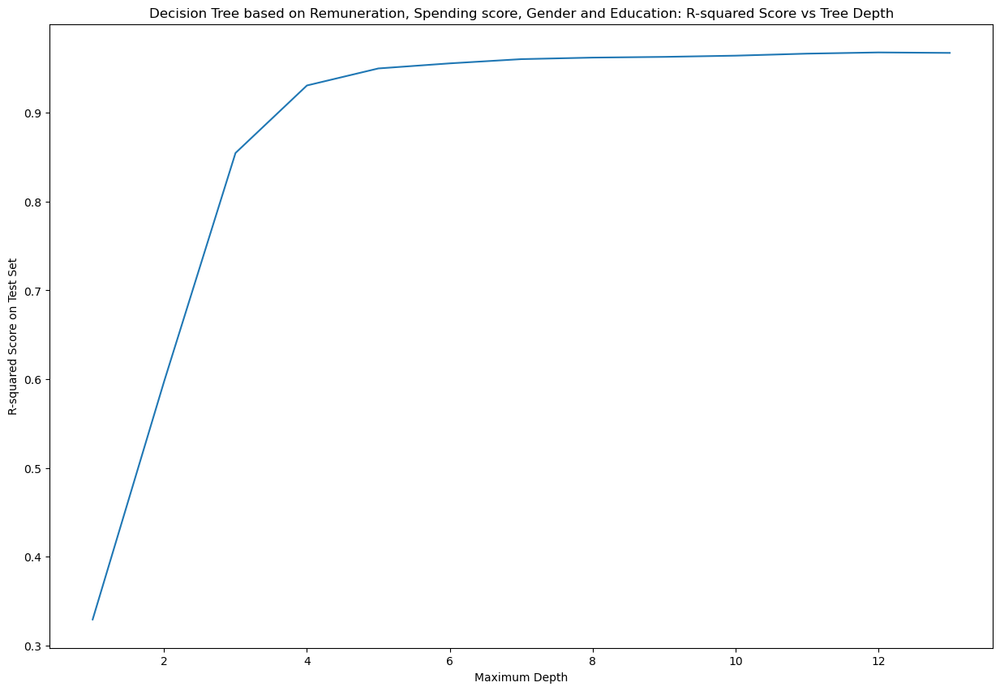

In [137]:
# Range of max_depth values to test
max_depth_range = range(1, 14)

# Store R-squared scores
r2_scores = []

for depth in max_depth_range:
    reg = DecisionTreeRegressor(max_depth=depth, random_state=42)
    reg.fit(X_train_tree, y_train_tree)
    y_pred = reg.predict(X_test_tree)
    score = r2_score(y_test_tree, y_pred)
    r2_scores.append(score)

# Plotting
pd.Series(r2_scores, index=max_depth_range).plot()
plt.title('Decision Tree based on Remuneration, Spending score, Gender and Education: R-squared Score vs Tree Depth')
plt.xlabel('Maximum Depth')
plt.ylabel('R-squared Score on Test Set')
plt.savefig("R-Squared Score.png", dpi=300)
plt.show()


### 3c) Prune the Decision Tree Regressor

In [139]:
# Prune the decision tree by passing a depth of 6
dec_tree(X_train_tree, X_test_tree, y_train_tree, y_test_tree,depth=6)

Depth = 6
Leaves = 61
Mean Absolute Error (MAE):178.51
Mean Squared Error (MSE):77460.20
R-squared: 95.56%
Avg % error: 2.62%
               feature  importance
        spending_score       0.578
        remuneration_k       0.409
                   age       0.013
                 count       0.000
           gender_Male       0.000
     education_Diploma       0.000
    education_Graduate       0.000
         education_Phd       0.000
education_Postgraduate       0.000


In [140]:
# Prune the decision tree by passing a depth of 7
dec_tree(X_train_tree, X_test_tree, y_train_tree, y_test_tree,depth=7)

Depth = 7
Leaves = 107
Mean Absolute Error (MAE):154.42
Mean Squared Error (MSE):69162.03
R-squared: 96.03%
Avg % error: 2.26%
               feature  importance
        spending_score       0.579
        remuneration_k       0.405
                   age       0.016
                 count       0.000
           gender_Male       0.000
     education_Diploma       0.000
    education_Graduate       0.000
         education_Phd       0.000
education_Postgraduate       0.000


In [141]:
# Prune the decision tree by passing a depth of 8
dec_tree(X_train_tree, X_test_tree, y_train_tree, y_test_tree,depth=8)

Depth = 8
Leaves = 163
Mean Absolute Error (MAE):150.46
Mean Squared Error (MSE):66146.78
R-squared: 96.21%
Avg % error: 2.21%
               feature  importance
        spending_score       0.576
        remuneration_k       0.407
                   age       0.016
                 count       0.000
           gender_Male       0.000
     education_Diploma       0.000
    education_Graduate       0.000
         education_Phd       0.000
education_Postgraduate       0.000


In [142]:
# Prune the decision tree by passing a depth of 9
dec_tree(X_train_tree, X_test_tree, y_train_tree, y_test_tree,depth=9)

Depth = 9
Leaves = 231
Mean Absolute Error (MAE):137.99
Mean Squared Error (MSE):64730.04
R-squared: 96.29%
Avg % error: 2.02%
               feature  importance
        spending_score       0.575
        remuneration_k       0.407
                   age       0.017
                 count       0.001
           gender_Male       0.000
     education_Diploma       0.000
    education_Graduate       0.000
         education_Phd       0.000
education_Postgraduate       0.000


### 3d) Remodel after removing the features with low importance

In [144]:
# Specify Y
y_finaltree = df_dummies['loyalty_points']


X_finaltree = df_dummies.drop(['age','count','gender_Male',
              'education_Diploma','education_Graduate','education_Phd',
              'education_Postgraduate','loyalty_points'],axis=1)


In [145]:
# Split the data into test and train data.
X_train_finaltree, X_test_finaltree, y_train_finaltree, y_test_finaltree = train_test_split(X_finaltree,y_finaltree, test_size = 0.3, random_state = 42)


In [146]:
# Decision Tree returning the model for the plotting of the decision tree and for the actual vs predicted plot
regressor, y_predict_finaltree = dec_tree(X_train_finaltree, X_test_finaltree, y_train_finaltree, y_test_finaltree,depth=9,return_model =True)

Depth = 9
Leaves = 121
Mean Absolute Error (MAE):193.35
Mean Squared Error (MSE):101972.11
R-squared: 94.15%
Avg % error: 2.83%
       feature  importance
spending_score        0.59
remuneration_k        0.41


**Pruned Decision Tree - Tree Interpretation**

- High-Spend customers on the right side of the tree are the most valuable with the highest predicted values in the tree
- They should be targeted with exclusive offers and high-value perks to match their status
- Mid-Income with Mid-Spending behavior can be pushed to the higher tiers through offers and exclusive deals. This would encourage their retention and engagement.
- Low Incom / Low Spend are represented on the left of the tree and they have the lowest predicted values for loyalty points. The return on investment on this segment would be minimal but they could still be included through referral or first subscription discounts

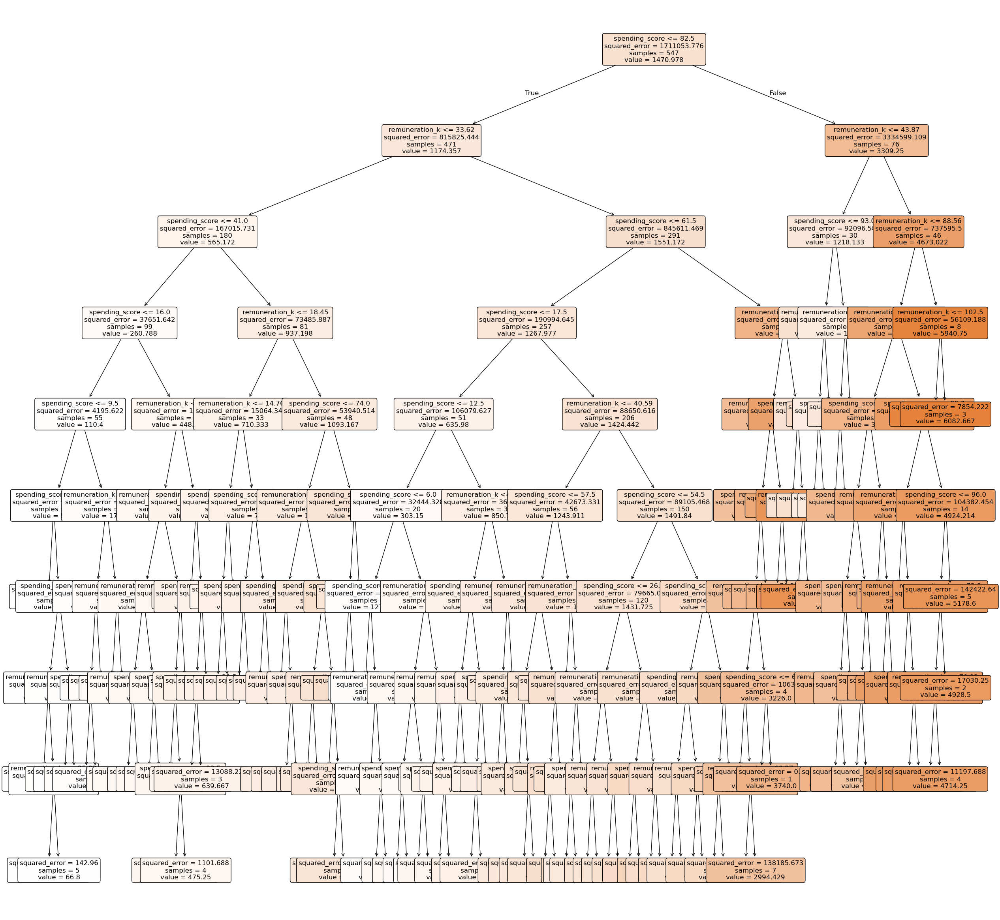

In [148]:
# Plot the tree
plt.figure(figsize=(30,30))
plot_tree(
    regressor,
    filled=True,
    feature_names=X_finaltree.columns,
    rounded=True,
    fontsize=12
)
plt.show()

**Pruned Decision Tree Actual vs Predicted - Plot Interpreation**

- The plot is a scatter plot of predicted vs actual values.
- The closer the points are to the y_test (ie. actual values), the more accurate the predictions are.
- Notice how points converge to the actual values in the next model built using RandomForestRegression
- The model also shows bias towards loyalty points under the 2000 point bracket, whereas the model struggles with loyalty points above that range.

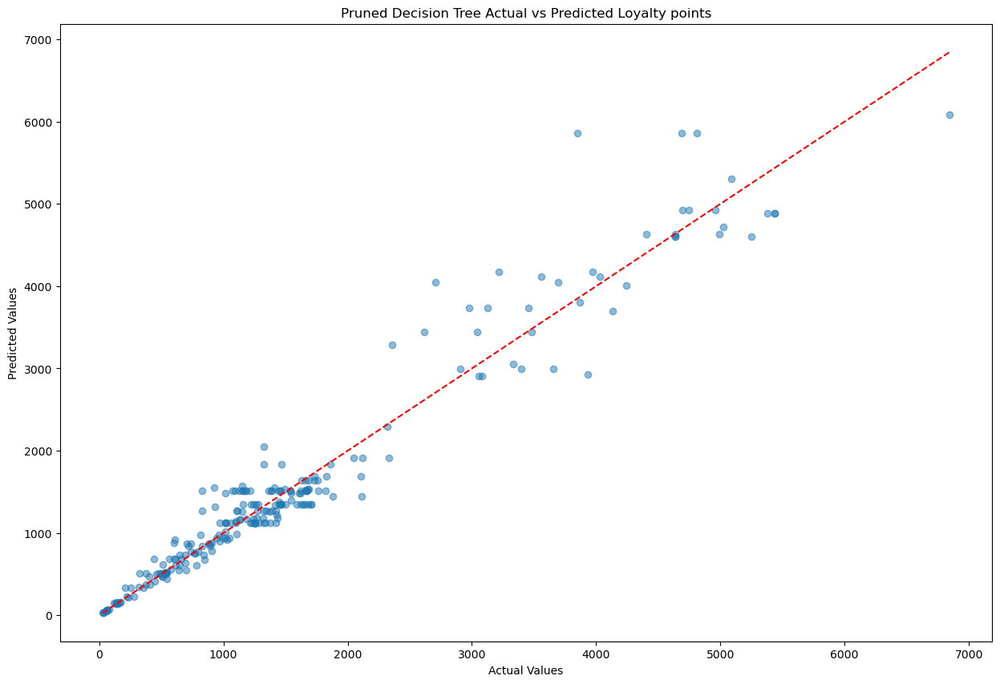

In [150]:
# Plot the Pruned Decision Tree
plt.scatter(y_test_finaltree, y_predict_finaltree, alpha=0.5)
plt.plot([y_test_finaltree.min(), y_test_finaltree.max()], [y_test_finaltree.min(), y_test_finaltree.max()], 'r--')  # Diagonal line
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("Pruned Decision Tree Actual vs Predicted Loyalty points")
plt.savefig("Puned Decision.png", dpi=300,bbox_inches='tight')
plt.show()

**Decision Tree Observations**

Features with low importance were removed in the second pruned tree, and that has decreased the accuracy of the model slightly (96.11% to 94.15%)

This is, however, favorable as it means that the model is not over-fitting the data and that unimportant features are removed, hence reducing noise. 

## 4. Remodel using the RandomForestRegressor
RandomForestRegressor is a strong modeling choice as it aggregates predictions across multiple decision trees. 

The random forest regressor resulted in an R-squared of 94.95%, a slight improvement over the pruned decision tree. A stratified cross-validation was applied to check the produced R-squared. A stratified cross-validation using qcut ensures that the folds have a balanced distribution of the loyalty points. 

The R-squared and MAE was then calculated for the individual bins to evaluate the accuracy of the model. 

To print the results the following source was used: 
https://www.datacareer.de/blog/random-forest-in-python-with-scikit-learn/

In [154]:
# Split the data into test and train data.
X_train_randfor, X_test_randfor, y_train_randfor, y_test_randfor = train_test_split(X_finaltree,y_finaltree, test_size = 0.3, random_state = 42)


In [155]:
# Create a RandomForestRegressor 
regressor4 = RandomForestRegressor(n_estimators = 100, 
                                   min_samples_leaf = 2,
                                   bootstrap = True,
                                   n_jobs = -1,
                                   random_state = 42)
# Fit the model using the train data
regressor4.fit(X_train_randfor,y_train_randfor)

# Predict using the test data
y_predict_randfor = regressor4.predict(X_test_randfor)

# Assign the X_test_randfor to the results DataFrame
result = X_test_randfor

# Create a new column loyaly_points to include the y_test_randfor values
result['loyalty_points']=y_test_randfor

# Create a column for the predicted loyalty points and assign y_predict_randfor to it
result['predicted_loyaltypoints'] = y_predict_randfor.tolist()

# Print the head of the DataFrame
result.head()

,remuneration_k,spending_score,loyalty_points,predicted_loyaltypoints
596,76.26,90,4747,4849.624019
588,19.68,73,994,937.751520
208,34.44,60,1429,1263.722003
291,22.96,82,1369,1250.630798
174,71.34,13,618,617.529363


In [156]:
# Evaluate the model

# Calculate the regression metrics
mae_randfor = mean_absolute_error(y_test_randfor,y_predict_randfor)
mse_randfor = mean_squared_error(y_test_randfor,y_predict_randfor)
rmse_randfor = np.sqrt(mse_randfor)
r2_randfor = r2_score(y_test_randfor,y_predict_randfor)
avg_err_randfor = mae_randfor/6822

# Print the regression metrics
print(f'Mean Absolute Error (MAE):{mae_randfor:.2f}')
print(f'Mean Squared Error (MSE):{mse_randfor:.2f}')
print(f'Root Mean Squared Error (RMSE):{rmse_randfor:.2f}')
print(f'R-squared: {r2_randfor:.2%}')
print(f'Avg % error: {avg_err_randfor:.2%}')

Mean Absolute Error (MAE):178.90
Mean Squared Error (MSE):87995.57
Root Mean Squared Error (RMSE):296.64
R-squared: 94.95%
Avg % error: 2.62%


**Random Forest Plot Interpreation**

- The plot is a scatter plot of predicted vs actual values.
- The closer the points are to the y_test (ie. actual values), the more accurate the predictions are.
- By comparing the Random Forest to the Pruned Decision tree plot, we can notice the improvement in convergence on the Random Forest plot.

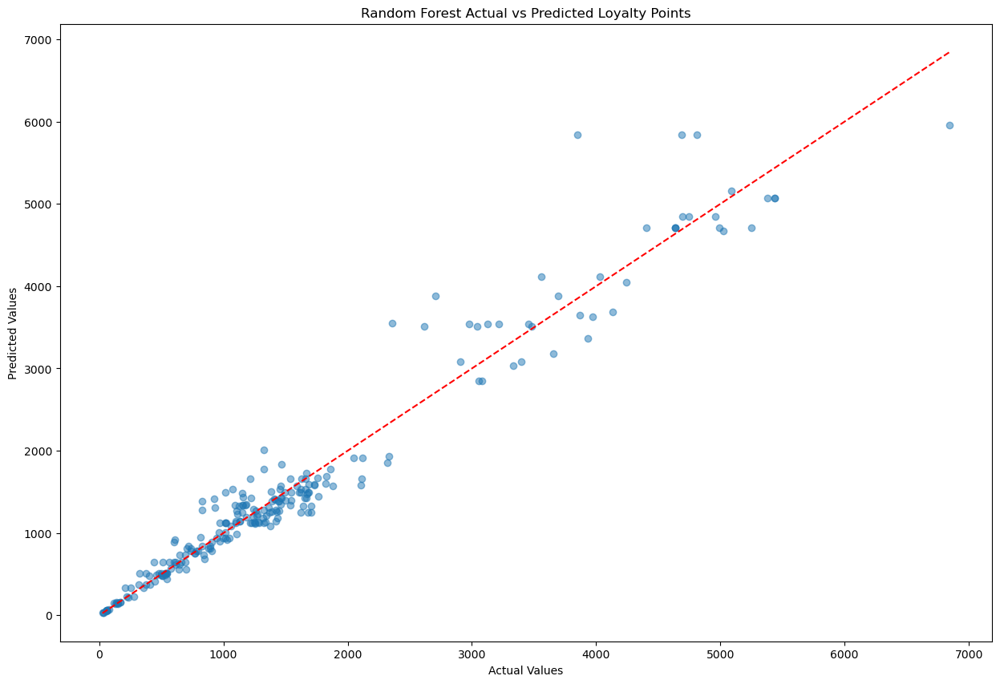

In [158]:
# Plot the actual vs predicted values for the RandomForest
plt.scatter(y_test_randfor, y_predict_randfor, alpha=0.5)
plt.plot([y_test_randfor.min(), y_test_randfor.max()], [y_test_randfor.min(), y_test_randfor.max()], 'r--')  # Diagonal line
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("Random Forest Actual vs Predicted Loyalty Points")
plt.savefig("Random Forest.png", dpi=300, bbox_inches='tight')
plt.show()

In [159]:
# Use qcut to bin the loyalty points
df_dummies['loyalty_bins'] = pd.qcut(df_dummies['loyalty_points'], q=5, labels=False)
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
r2_scores = []
mae_scores = []

for train_idx, test_idx in skf.split(X_finaltree, df_dummies['loyalty_bins']):
    X_train, X_test = X_finaltree.iloc[train_idx], X_finaltree.iloc[test_idx]
    y_train, y_test = y_finaltree.iloc[train_idx], y_finaltree.iloc[test_idx]
    
    model = RandomForestRegressor(n_estimators = 100, 
                                   min_samples_leaf = 2,
                                   bootstrap = True,
                                   n_jobs = -1,
                                   random_state = 42)
    model.fit(X_train, y_train)
    preds = model.predict(X_test)
    
    r2_scores.append(r2_score(y_test, preds))
    mae_scores.append(mean_absolute_error(y_test, preds))

print(f"Avg R²: {np.mean(r2_scores):.2%}")
print(f"Avg MAE: {np.mean(mae_scores):.2f}")
print(f"All R² scores: {r2_scores}") # Print the list of scores
print(f"All MAE scores: {mae_scores}") # Print the list of scores


Avg R²: 96.51%
Avg MAE: 155.24
All R² scores: [0.968229993024708, 0.9718743562124867, 0.9646260232828886, 0.9668112617589806, 0.9540278427571696]
All MAE scores: [160.26744926296396, 155.08572136911948, 143.68882903599058, 146.05937617736194, 171.08428566087838]


## 5. Discuss: Insights and observations

Based on the results of the stratified RandomForestRegressor, the model can predict on average 96.51% of the variability in the loyalty points based on the customers' annual remuneration and spending score.
Given the range of the loyalty points, an MAE of  155.24 suggests an improved average prediction error of 2.27% of the full range, an improvement over the 2.83% error produced with the pruned decision tree. This indicates that the random forest not only predicts more accurately, it also generalizes more effectively. 

The presence of visible clustering in the data encouraged the use of the stratified cross-validation, which is to ensure that the model takes a balanced distribution of the loyalty points into account. 

Considering models that are more tailored for such behaviour would lead to more informative insights, hence why a cluster-based regressor would be considered in R. Alternative models may also be easier to interpret and would be more suited to the trends in the data. 

# III. Clustering Methodology

We know from previous regression models that the two most important features affecting the loyalty program are:
- spending_score
- remuneration (k)

The next logical step is definitely to check if there are clusters in the data that would help us better interpret the data and create a loyalty program tailored to the customers' needs.

The following methodology was followed:

- Scaling the data
- For K-Means Clustering since we need to specify the k values, the elbow and silhouette methods were applied to both scaled and unscaled data
- Hierarchical clustering was also applied to both scaled and unscaled data. 

All models resulted in a k=5 and the final model was fitted using the hierarchical model's scaled data. 
This is because the hierarchical clustering method is affected by differences in scales and that was considered the safest route. 

The resulting scatter plot divides the data into 5 groups based on the spending and income level, annotations were displayed on the chart the legend was dedicated to the defining the loyalty tiers.

## 1. Load and explore the data

In [164]:
# To guarantee correctness of the data, load the csv file and assign it to df_orig
# Load the CSV file(s) as df3.
df_orig = pd.read_csv('turtle_uni_customers.csv')

# View DataFrame.
df_orig.head()
df3 = df_orig.copy()

In [165]:
# Drop unnecessary columns.
df3.drop(columns=['gender','age','education'],inplace=True)

# View DataFrame.
df3.head()

,remuneration_k,spending_score,loyalty_points,count
0,13.94,40,233,1
1,35.26,54,797,1
2,53.30,48,1071,7
3,69.70,26,759,1
4,12.30,81,436,1


## 2. Plot

**Scatter plot observations**

Plotting the scatterplot of the remuneration vs the spending score, we can see that there are 5 visible clusters. 

This is to be confirmed by using the Silhouette and Elbow methods to determine the number of clusters.

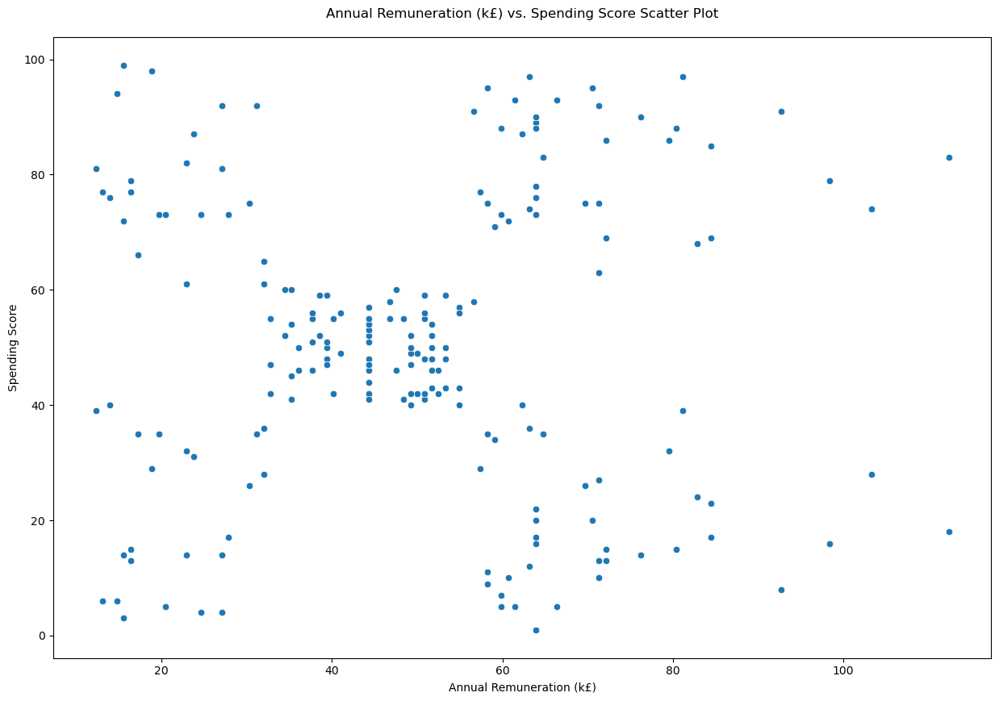

In [167]:
# Create a scatterplot with Seaborn.
b = sns.scatterplot(data=df3, x='remuneration_k', y='spending_score',palette='colorblind')

# Set chart title
plt.title("Annual Remuneration (k£) vs. Spending Score Scatter Plot", y=1.02)
plt.xlabel("Annual Remuneration (k£)")
plt.ylabel("Spending Score")
plt.show()



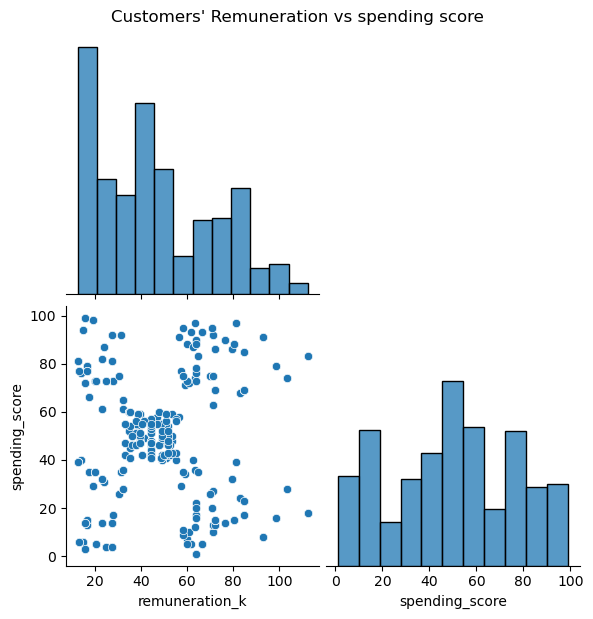

In [168]:
# Create the variables for the pairplot
var_cls = df3[['remuneration_k','spending_score']]

# Create a pairplot with Seaborn.
d = sns.pairplot(df3,vars =var_cls, corner=True,height=3,palette='colorblind')

# Set chart title
d.fig.suptitle("Customers' Remuneration vs spending score", y=1.02)

plt.show()


## 3. Elbow and silhoutte methods

Since K-Means Clustering requires specifying the number of clusters k in advance, the Elbow and Silhouette methods were used to help determine the ideal value for k. 

The data was scaled since both K-Means and Hierarchical clustering are sensitive to differences in scale. 

The elbow and silhouette methods were applied on scaled and unscaled data for comparison purposes. 

**Both methods indicate that k=5 would be the optimal number of clusters.**

For comparison purposes, the K-Means model was run using k=3, 4, 5 and 6. This is to evaluate the quality of the clusters. 

In [170]:
# Create a Standard scaler object
scaler = StandardScaler()

# Fit the scaler using the remuneration and spending score columns
scaled_data = scaler.fit_transform(df3[['remuneration_k','spending_score']])

# Transform the NumPy array created by the scaler to a panda DataFrame
scaled_df3 = pd.DataFrame(scaled_data, columns=['remuneration_k','spending_score'], index=df3.index)

In [171]:
# User Defined function to determine the number of clusters using the Elbow Method
def elbow (df,title_prefix):
    # Elbow chart for us to decide on the number of optimal clusters.
    ss = []
    for i in range(1, 11):
        kmeans = KMeans(n_clusters=i,
                    init='k-means++',
                    max_iter=300,
                    n_init=10,
                    random_state=42)
        kmeans.fit(df)
        ss.append(kmeans.inertia_)

    # Plot the elbow method.
    plt.plot(range(1, 11),ss,marker='o')

    # Insert labels and title.
    plt.title(f"{title_prefix} The Elbow Method")
    plt.xlabel("Number of clusters")
    plt.ylabel("SS distance")
    
    plt.show()

In [172]:
# User-defined function to determine the number of clusters using the Silhouette Method
def sil(df,title_prefix):

    # Find the range of clusters to be used using silhouette method.
    sil = []
    kmax = 10

    for k in range(2, kmax+1):
        kmeans_s = KMeans(n_clusters=k).fit(df)
        labels = kmeans_s.labels_
        sil.append(silhouette_score(df,
                                labels,
                                metric='euclidean'))

    # Plot the silhouette method.
    plt.plot(range(2, kmax+1),sil,marker='o')

    # Insert labels and title.
    plt.title(f"{title_prefix} Silhouette Method")
    plt.xlabel("Number of clusters")
    plt.ylabel("Sil")

    plt.show()

### 3a) Elbow method using unscaled data

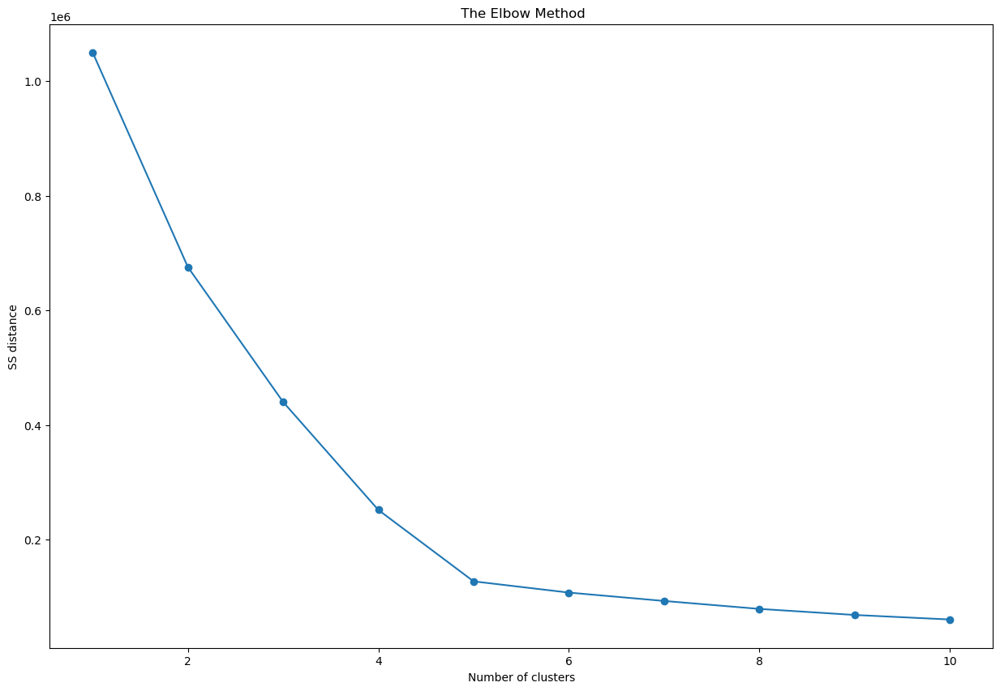

In [174]:
# Determine the number of clusters: Elbow method using the unscaled data
elbow(var_cls,'')

### 3b) Elbow method using scaled data

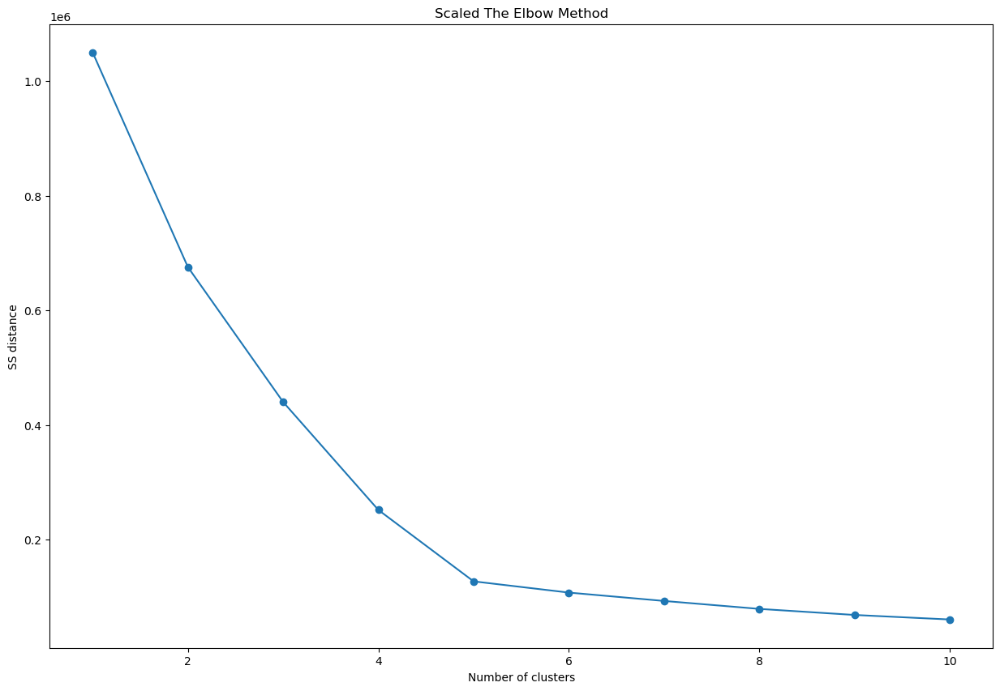

In [176]:
# Determine the number of clusters: Elbow method using the scaled data
elbow(var_cls,'Scaled')

### 3c) Silhouette method using unscaled data

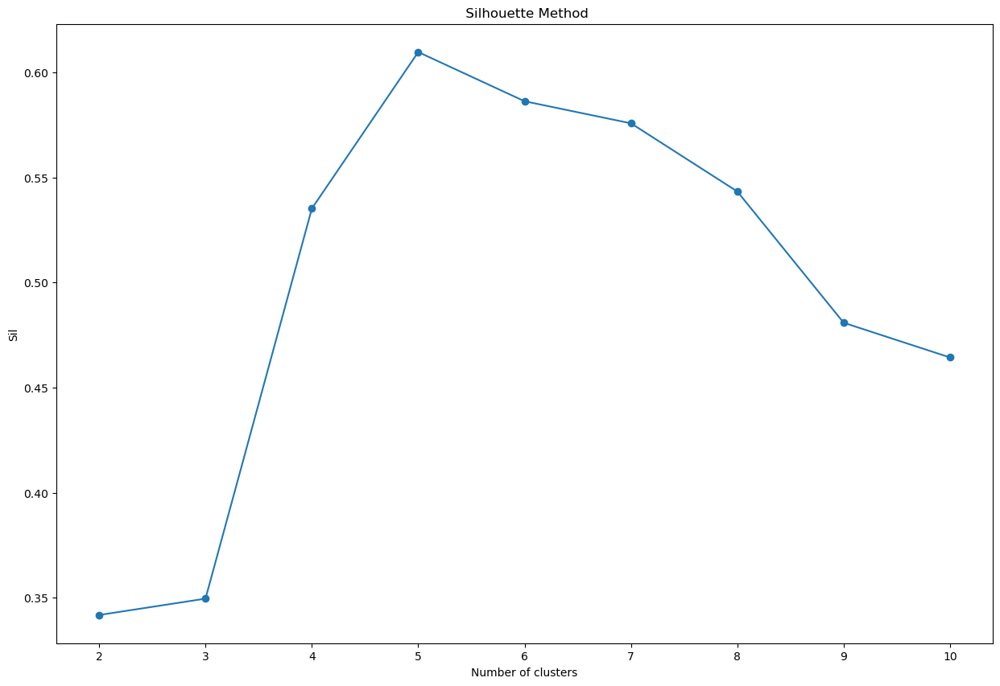

In [178]:
# Determine the number of clusters using the Silhouette Method using unscaled data
sil(var_cls,'')

### 3d) Silhouette method using scaled data

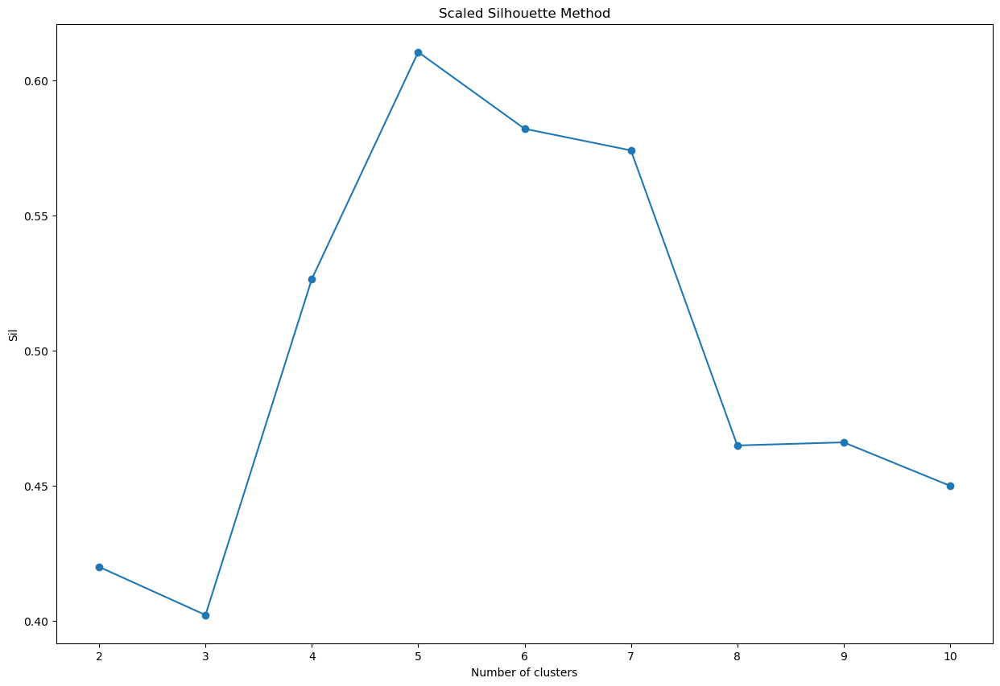

In [180]:
# Determine the number of clusters using the Silhouette Method using scaled data
sil(scaled_df3,'Scaled')

## 4. Evaluate k-means model at different values of *k*

In [182]:
# User Defined function to use the kmeans with a certain number of clusters and plot scatterplot with the identified clusters
def kmean_scat(k,df,title_prefix):

    ''' This defined function creates clusters based on the inputted k, it also plots a pairplot of the created clusters 
    together with a scatter plot. The function also prints out the income and spending score with their designated clusters''' 

    # Create a copy of the DataFrame to not make changes to the original DataFrame
    df = df.copy()
    kmeans_k3 = KMeans(n_clusters = k, 
                max_iter = 300,
                init='k-means++',
                random_state=42).fit(df)

    clusters_k3 = kmeans_k3.labels_

    df['K-Means Predicted'] = clusters_k3

    # Plot the predicted.
    e = sns.pairplot(df,hue='K-Means Predicted',
             diag_kind= 'kde',palette='colorblind',height=3)

    e.fig.suptitle(f"{title_prefix} Annual Income (k£) vs Spending Score Clusters pairplot using (k={k})",y=1.02)

    plt.show()
    
    # Check the number of observations per predicted class.
    #df['K-Means Predicted'].value_counts()
    
    # View the K-Means predicted.
    print(df.head())
    
    # Create a scatterplot.
    sns.scatterplot(x='remuneration_k' , 
                y ='spending_score',
                data=df,
                hue='K-Means Predicted',
                palette='colorblind')

    # Set chart title
    plt.title(f"{title_prefix} Annual Remuneration (k£) vs. Spending Score Clusters Scatter Plot using (k={k})", y=1.02)
    plt.xlabel("Annual Remuneration (k£)")
    plt.ylabel("Spending Score")
    plt.show()

### 4a) Before Scaling the DataFrame

#### Set k=3 to examine the model and evaluate the accuracy

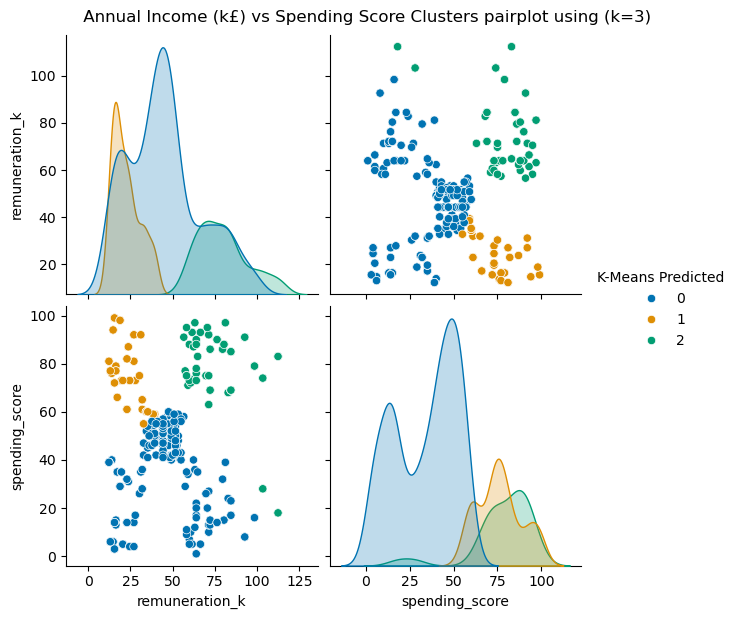

   remuneration_k  spending_score  K-Means Predicted
0           13.94              40                  0
1           35.26              54                  0
2           53.30              48                  0
3           69.70              26                  0
4           12.30              81                  1


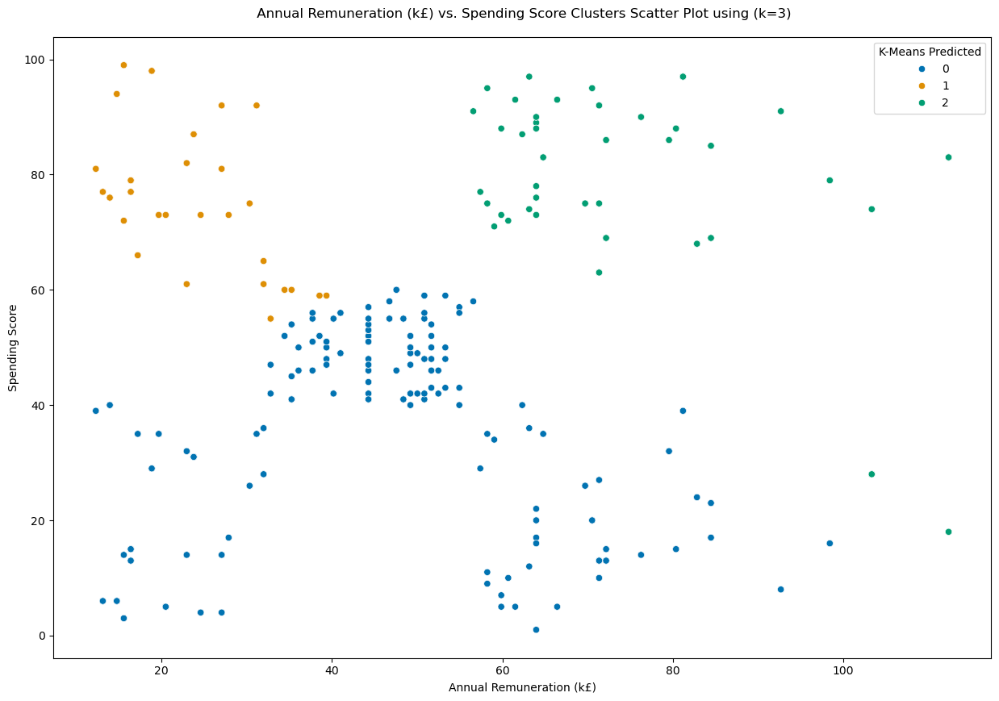

In [185]:
# Pass the number of ks together with clustering DataFrame and '' no title changes to the title
kmean_scat(3,var_cls,'')

#### Set k=4 to examine the model and evaluate the accuracy

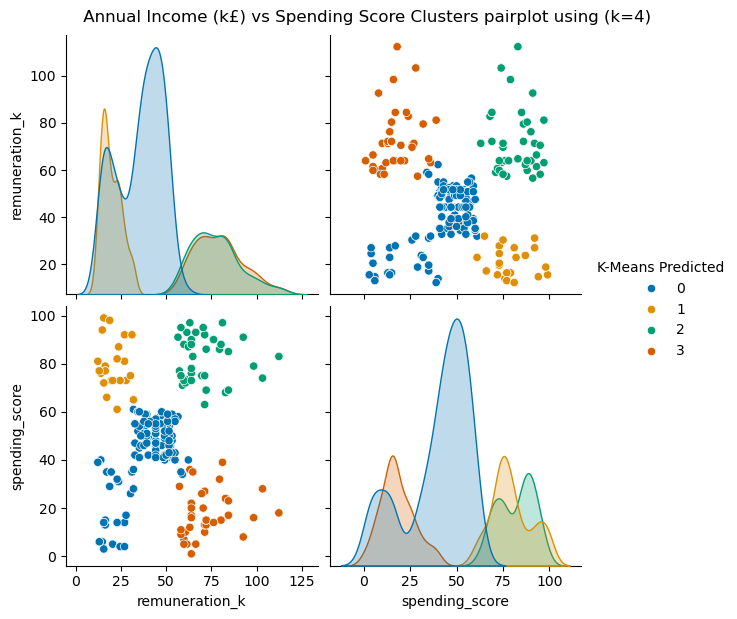

   remuneration_k  spending_score  K-Means Predicted
0           13.94              40                  0
1           35.26              54                  0
2           53.30              48                  0
3           69.70              26                  3
4           12.30              81                  1


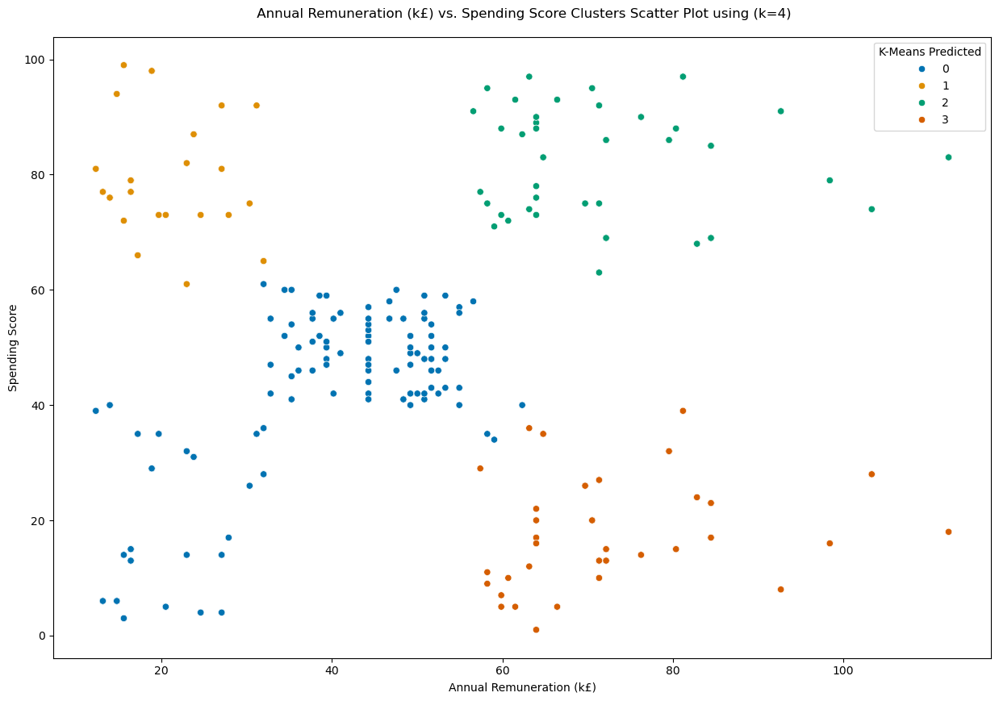

In [187]:
# Pass the number of ks together with clustering DataFrame and '' no title changes to the title
kmean_scat(4,var_cls,'')

#### Set k=5 to examine the model and evaluate the accuracy

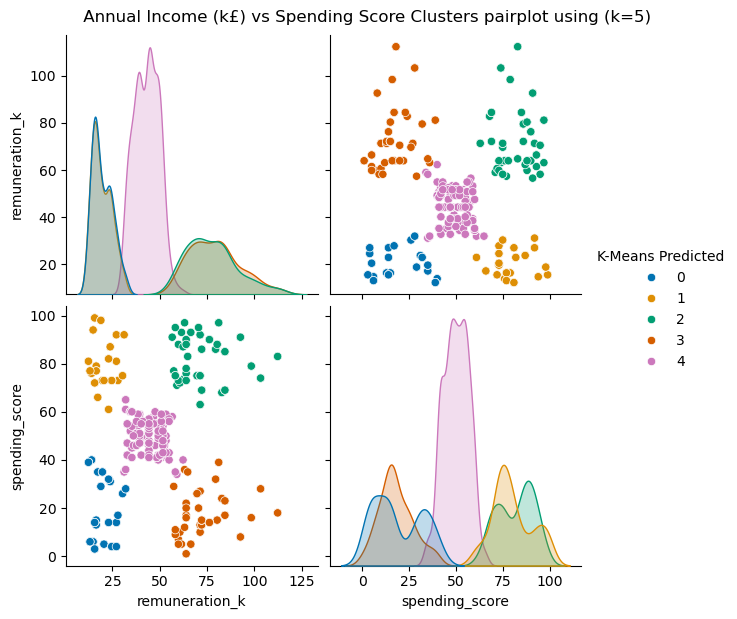

   remuneration_k  spending_score  K-Means Predicted
0           13.94              40                  0
1           35.26              54                  4
2           53.30              48                  4
3           69.70              26                  3
4           12.30              81                  1


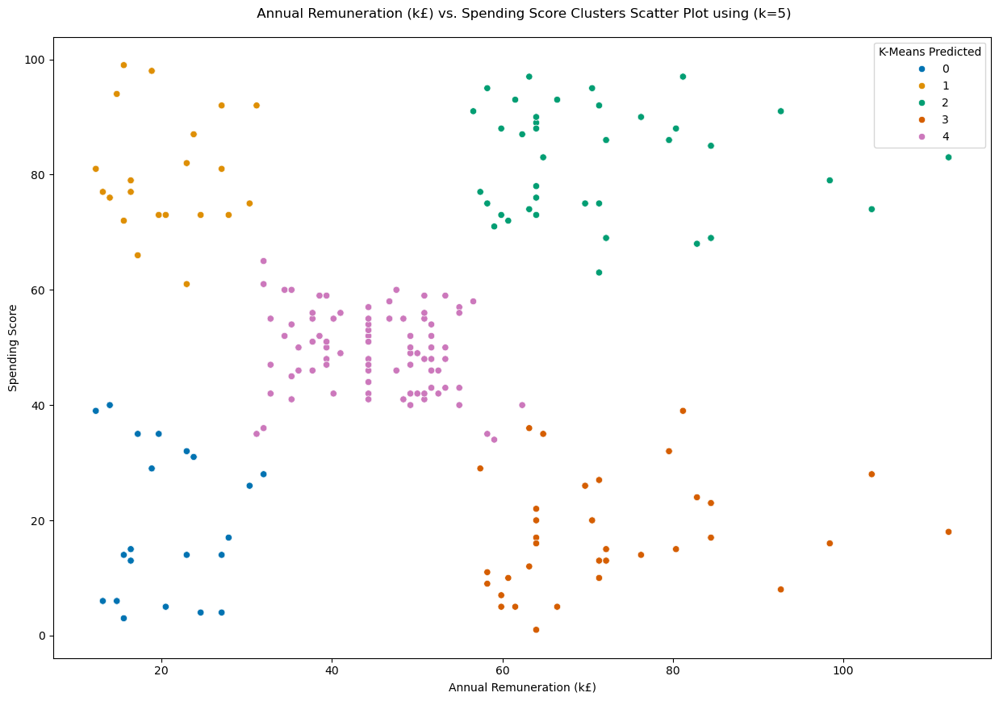

In [189]:
# Pass the number of ks together with clustering DataFrame and '' no title changes to the title
kmean_scat(5,var_cls,'')

#### Set k=6 to examine the model and evaluate the accuracy

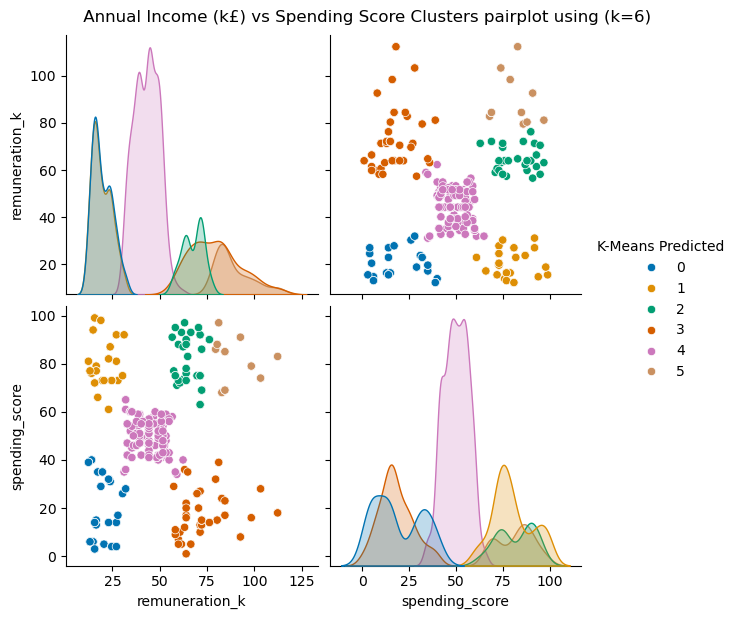

   remuneration_k  spending_score  K-Means Predicted
0           13.94              40                  0
1           35.26              54                  4
2           53.30              48                  4
3           69.70              26                  3
4           12.30              81                  1


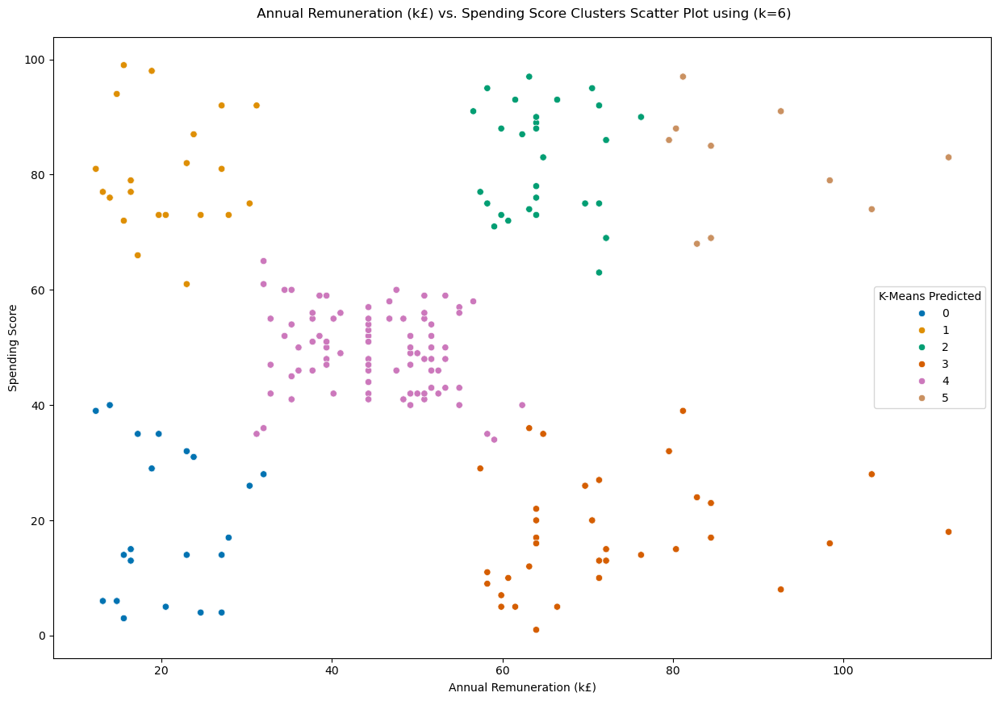

In [191]:
# Pass the number of ks together with clustering DataFrame and '' no title changes to the title
kmean_scat(6,var_cls,'')

### 4b) After Scaling the Data using the StandardScaler

### Set k=3 to examine the model after scaling and evaluate the accuracy

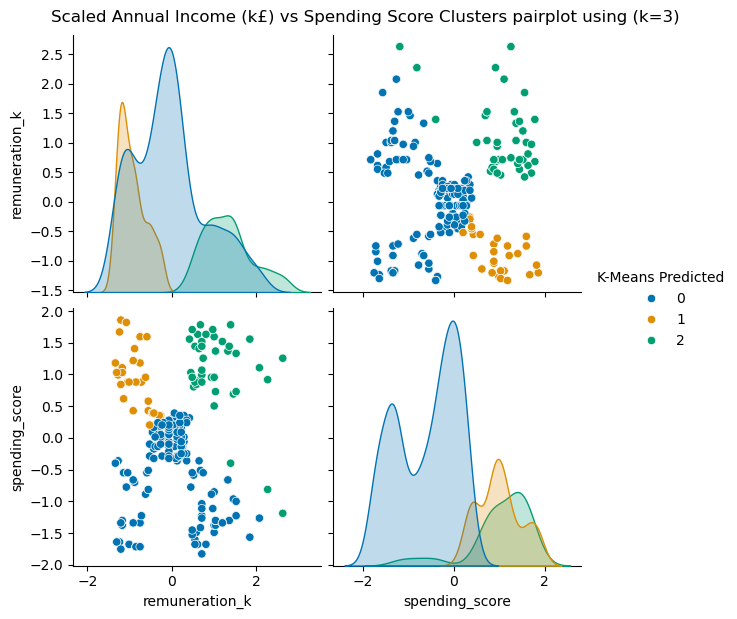

   remuneration_k  spending_score  K-Means Predicted
0       -1.272843       -0.361403                  0
1       -0.427938        0.165376                  0
2        0.286982       -0.060386                  0
3        0.936909       -0.888182                  0
4       -1.337835        1.181308                  1


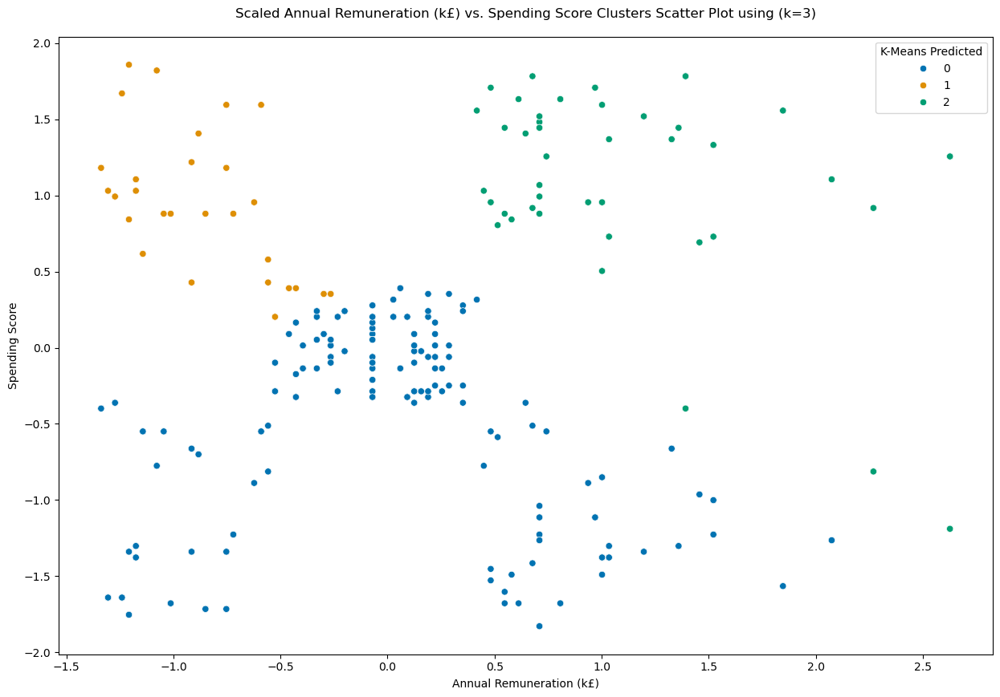

In [194]:
# Pass the number of ks together with clustering DataFrame and adding 'Scaled' to the title
kmean_scat(3,scaled_df3,'Scaled')

### Set k=4 to examine the model after scaling and evaluate the accuracy

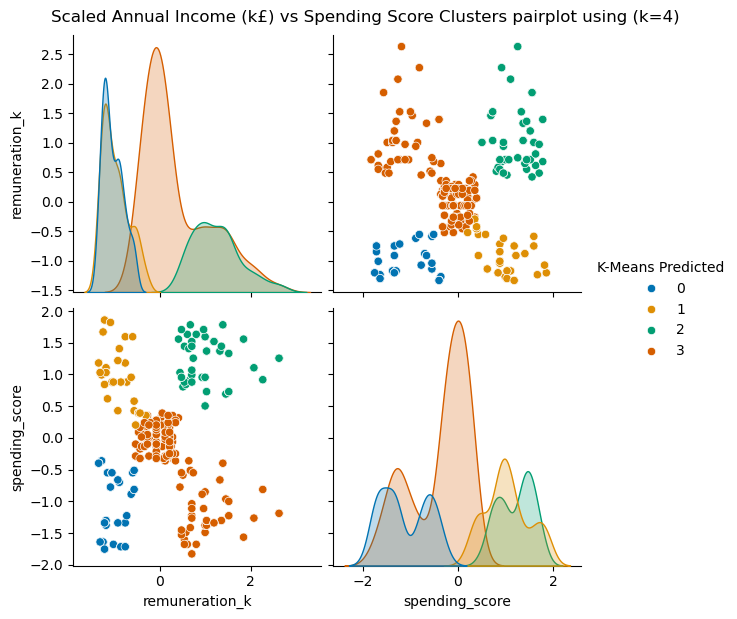

   remuneration_k  spending_score  K-Means Predicted
0       -1.272843       -0.361403                  0
1       -0.427938        0.165376                  3
2        0.286982       -0.060386                  3
3        0.936909       -0.888182                  3
4       -1.337835        1.181308                  1


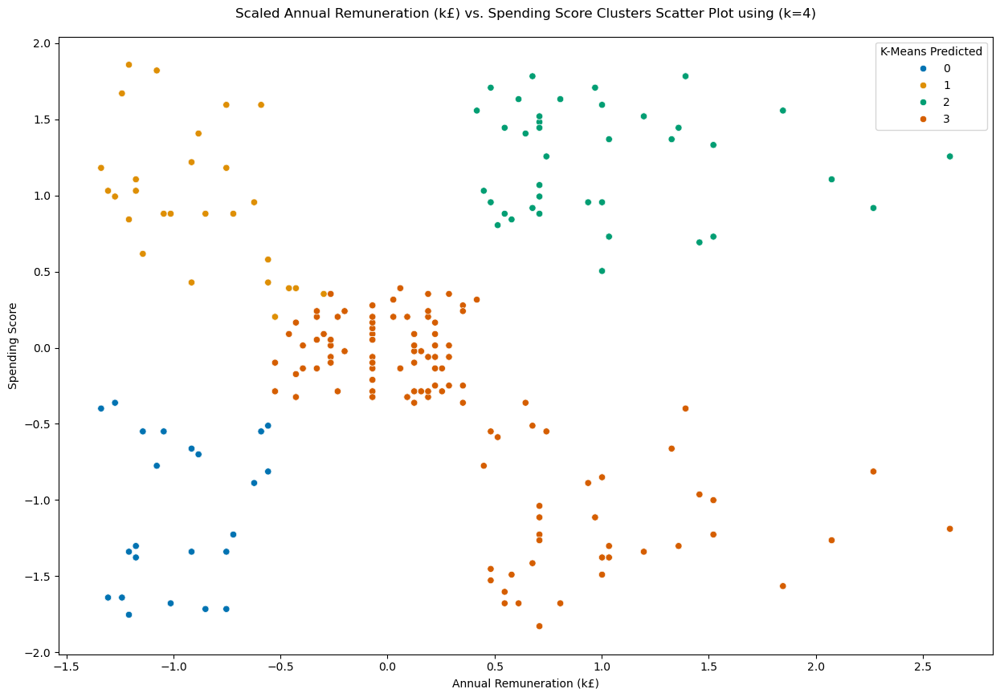

In [196]:
# Pass the number of ks together with clustering DataFrame and adding 'Scaled' to the title
kmean_scat(4,scaled_df3,'Scaled')

### Set k=5 to examine the model after scaling and evaluate the accuracy

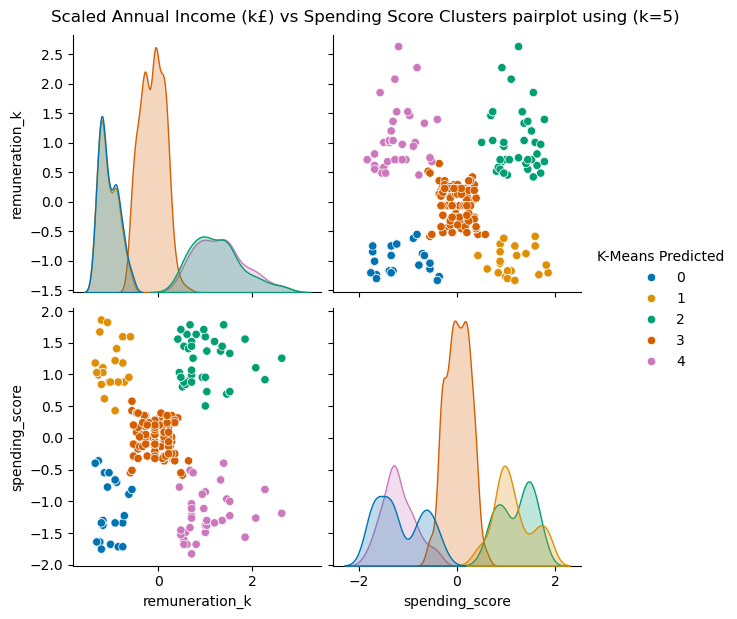

   remuneration_k  spending_score  K-Means Predicted
0       -1.272843       -0.361403                  0
1       -0.427938        0.165376                  3
2        0.286982       -0.060386                  3
3        0.936909       -0.888182                  4
4       -1.337835        1.181308                  1


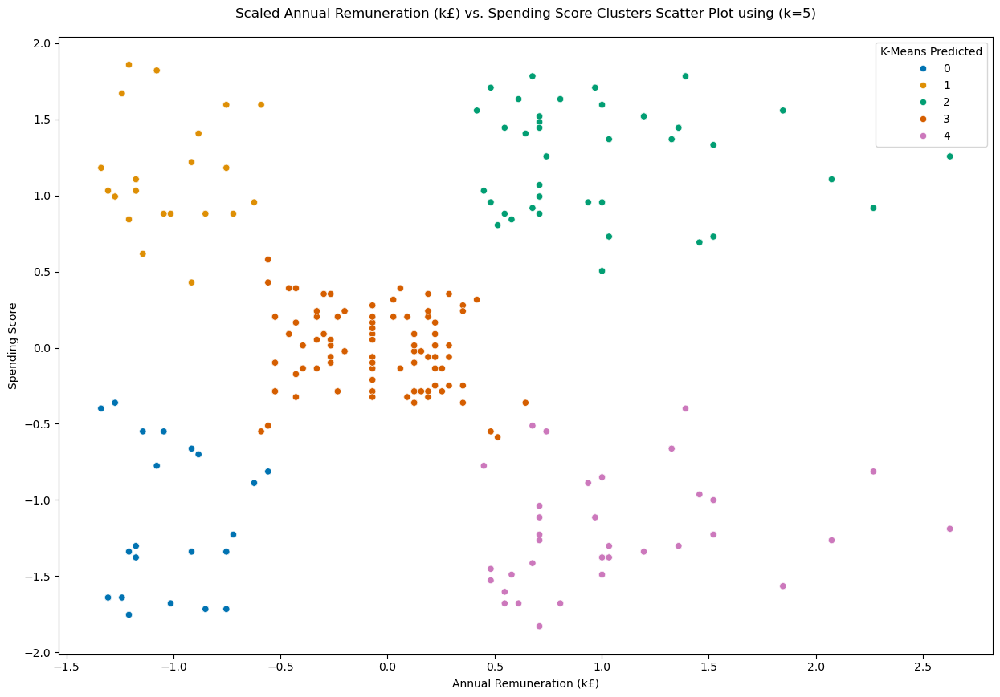

In [198]:
# Pass the number of ks together with clustering DataFrame and adding 'Scaled' to the title
kmean_scat(5,scaled_df3,'Scaled')

### Set k=6 to examine the model after scaling and evaluate the accuracy

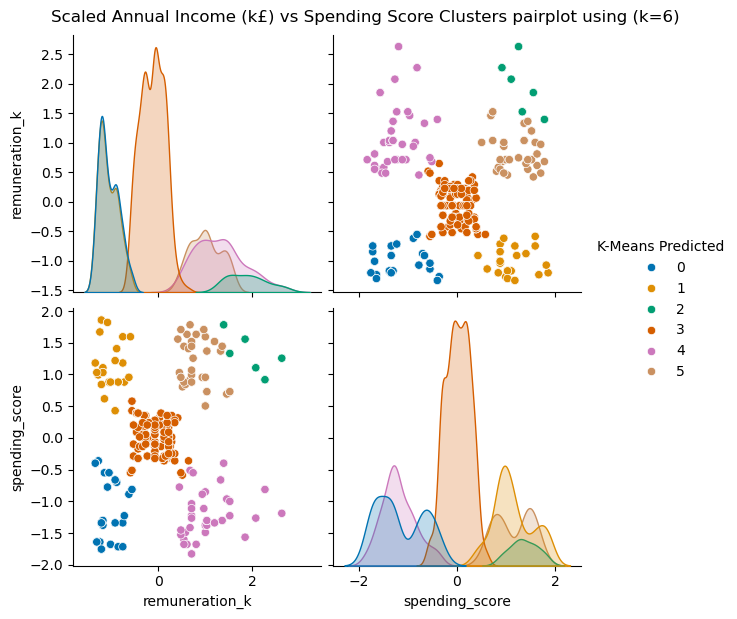

   remuneration_k  spending_score  K-Means Predicted
0       -1.272843       -0.361403                  0
1       -0.427938        0.165376                  3
2        0.286982       -0.060386                  3
3        0.936909       -0.888182                  4
4       -1.337835        1.181308                  1


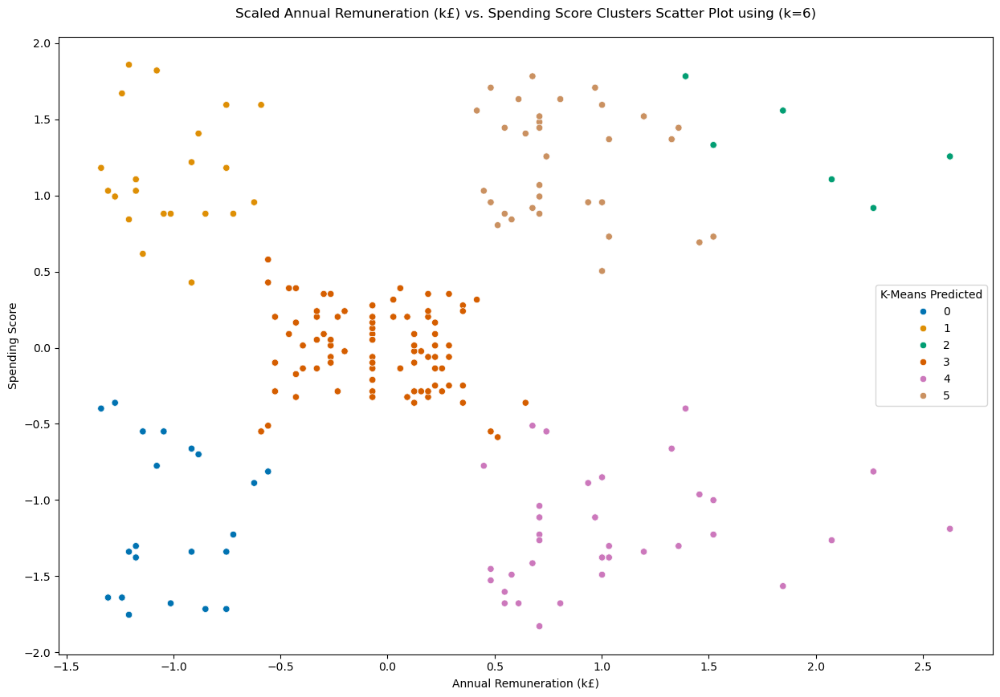

In [200]:
# Pass the number of ks together with clustering DataFrame and adding 'Scaled' to the title
kmean_scat(6,scaled_df3,'Scaled')

## 5. Hierarchical Clustering
To confirm the chosen k=5 hierarchical clustering was applied.

This is because hierarchical clustering doesn't require predefined clusters. 
Plotting the dendrogram of the hierarchical clustering, we can deduce that the ideal clustering number is indeed 5 and this is by cutting it off at the largest vertical distance between merges. 

Hierarchical clustering was applied to both scaled and unscaled data for comparison's sake. 

In [202]:
var_cls = df3[['remuneration_k','spending_score']]

# Transform the NumPy array created by the scaler to a panda DataFrame
scaled_df3 = pd.DataFrame(scaled_data, columns=['remuneration_k','spending_score'], index=df3.index)

In [203]:
# User-defined function to create and plot a dendrogram
def dendro (df,title_prefix):
    dendro = dendrogram(linkage(df, method = "ward"))
    #plt.savefig('dendro_ward.png')

    # Set Chart title
    plt.title(f"{title_prefix} Customer Segmentation Dendrogram")
    plt.xticks([])
    plt.xlabel("Data Points Clustered by Spending and Annual Remuneration (k£)")
    plt.ylabel("Euclidean Distance")

    plt.show()

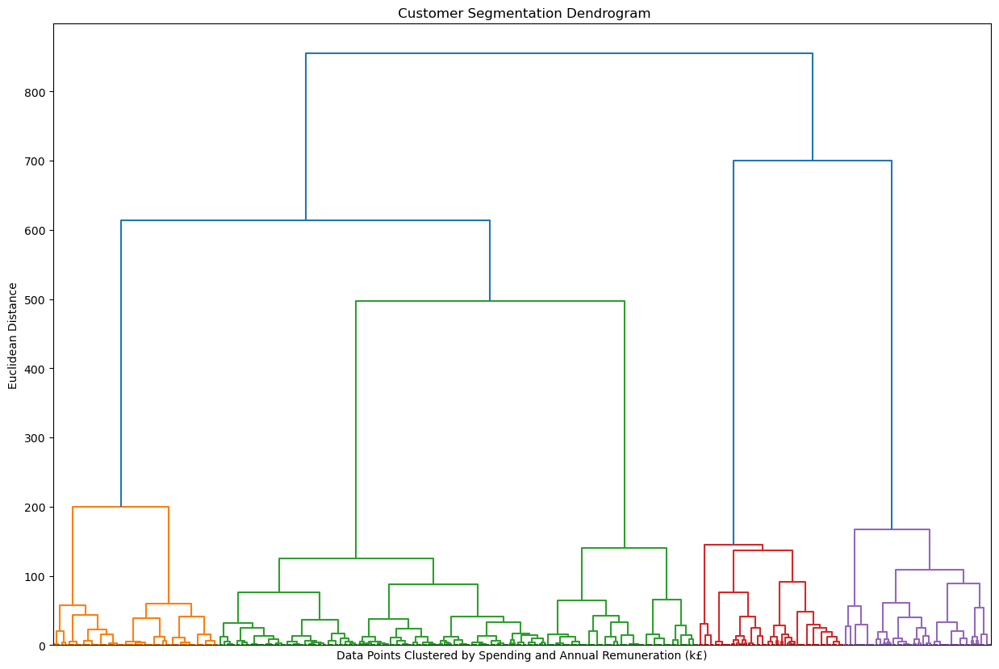

In [204]:
dendro(var_cls,'')

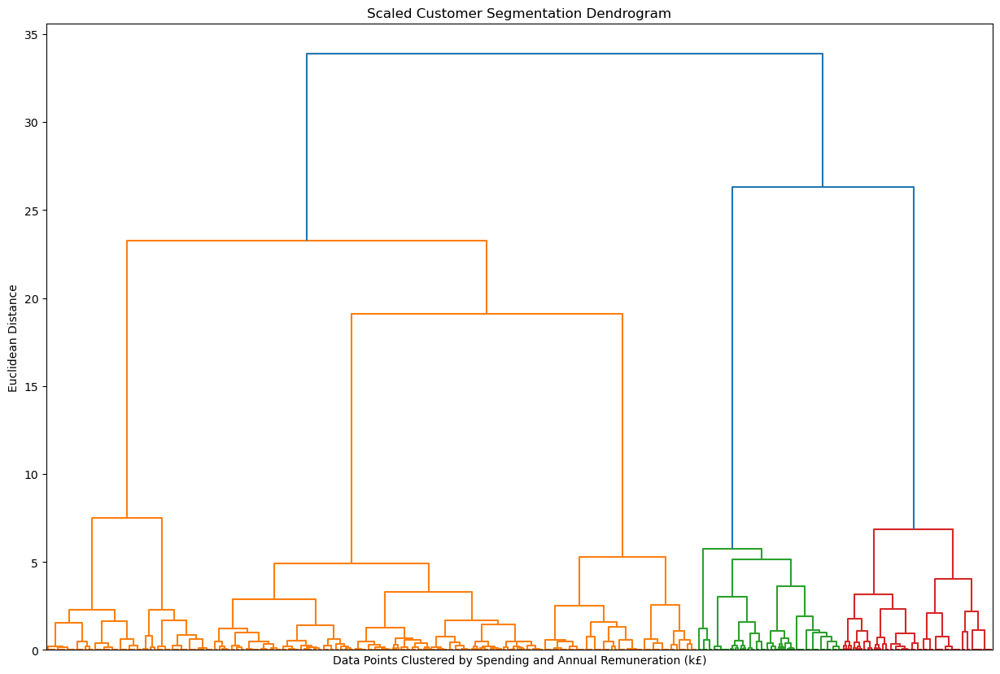

In [205]:
dendro(scaled_df3,'Scaled')

## 6. Fit the final model using the hierarchical clustering

In [207]:
# Let's use the ward and specify the number of clusters that we decided on as 5.
aclust = AgglomerativeClustering(n_clusters = 5, metric = 'euclidean', linkage ='ward')
y_aclust = aclust.fit_predict(scaled_df3)

scaled_df3["Hierarchical Clusters Predicted"] = y_aclust
#scaled_df3['Hierarchical Clusters Predicted'].value_counts()
#scaled_df3

In [208]:
# Reverse the scaling before plotting
# Select only the scaled features
features_to_inverse = ['remuneration_k', 'spending_score']
scaled_features = scaled_df3[features_to_inverse]

# Inverse transform just those columns
original_values = scaler.inverse_transform(scaled_features)

# Rebuild the full DataFrame with original scale + cluster labels
descaled_df = scaled_df3.copy()
descaled_df[features_to_inverse] = original_values
descaled_df['Hierarchical Clusters Predicted'].value_counts()

Hierarchical Clusters Predicted
4    273
0    138
3    127
1    123
2    121
Name: count, dtype: int64

## 7. Plot the final clusters

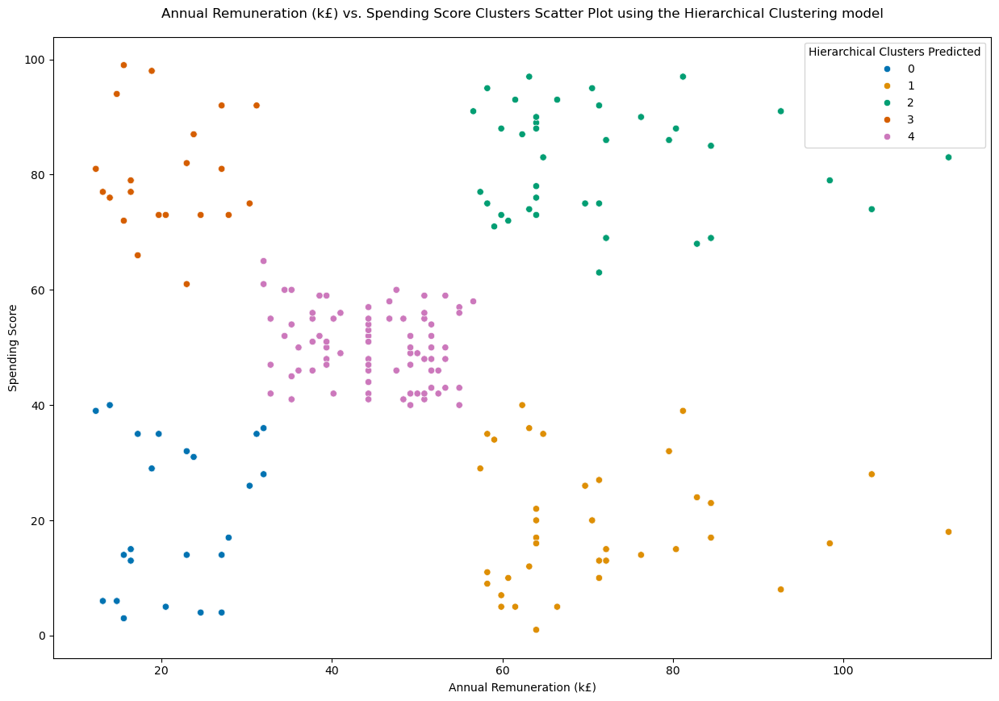

In [210]:
# Visualising the clusters.
# Create a scatterplot.
sns.scatterplot(x='remuneration_k' , 
                y ='spending_score',
                data=descaled_df,
                hue='Hierarchical Clusters Predicted',
                palette='colorblind')

# Set chart title
plt.title("Annual Remuneration (k£) vs. Spending Score Clusters Scatter Plot using the Hierarchical Clustering model", y=1.02)
plt.xlabel("Annual Remuneration (k£)")
plt.ylabel("Spending Score")
plt.show()

In [211]:
# Define cluster labels for mapping
cluster_labels = {
    0: 'Low Income / Low Spend',
    1: 'High Income / Low Spend',
    2: 'High Income / High Spend',
    3: 'Low Income / High Spend',
    4: 'Medium Income / Medium Spend',
}
# Replace cluster numbers with labels
descaled_df['Cluster Segment'] = descaled_df['Hierarchical Clusters Predicted'].map(cluster_labels)
descaled_df

,remuneration_k,spending_score,Hierarchical Clusters Predicted,Cluster Segment
0,13.94,40.0,0,Low Income / Low Spend
1,35.26,54.0,4,Medium Income / Medium Spend
2,53.30,48.0,4,Medium Income / Medium Spend
3,69.70,26.0,1,High Income / Low Spend
4,12.30,81.0,3,Low Income / High Spend
...,...,...,...,...
777,37.72,56.0,4,Medium Income / Medium Spend
778,39.36,47.0,4,Medium Income / Medium Spend
779,40.18,55.0,4,Medium Income / Medium Spend
780,66.42,93.0,2,High Income / High Spend


In [212]:
# Define loyalty tier labels for mapping
loyalty_labels = {
    0: 'Turtle Hatchling',
    1: 'Shell Saver',
    2: 'Mighty Turtle',
    3: 'Adventurous Flipper',
    4: 'Steady Tide',
}
# Replace cluster numbers with labels
descaled_df['Loyalty Tiers'] = descaled_df['Hierarchical Clusters Predicted'].map(loyalty_labels)
descaled_df

,remuneration_k,spending_score,Hierarchical Clusters Predicted,Cluster Segment,Loyalty Tiers
0,13.94,40.0,0,Low Income / Low Spend,Turtle Hatchling
1,35.26,54.0,4,Medium Income / Medium Spend,Steady Tide
2,53.30,48.0,4,Medium Income / Medium Spend,Steady Tide
3,69.70,26.0,1,High Income / Low Spend,Shell Saver
4,12.30,81.0,3,Low Income / High Spend,Adventurous Flipper
...,...,...,...,...,...
777,37.72,56.0,4,Medium Income / Medium Spend,Steady Tide
778,39.36,47.0,4,Medium Income / Medium Spend,Steady Tide
779,40.18,55.0,4,Medium Income / Medium Spend,Steady Tide
780,66.42,93.0,2,High Income / High Spend,Mighty Turtle


In [213]:
# Group by cluster and calculate max and min for each metric
summary = descaled_df.groupby('Hierarchical Clusters Predicted')[['remuneration_k', 'spending_score']].agg(['min', 'max'])

# Clean up column names if needed
summary.columns = ['_'.join(col).strip() for col in summary.columns.values]

# Display the result
summary

,remuneration_k_min,remuneration_k_max,spending_score_min,spending_score_max
Hierarchical Clusters Predicted,,,,
0,12.30,31.98,3.0,40.0
1,57.40,112.34,1.0,40.0
2,56.58,112.34,63.0,97.0
3,12.30,31.16,61.0,99.0
4,31.98,56.58,40.0,65.0


In [214]:
# User Defined function to plot a clustered scatterplot with division lines 
def scat_div(Low_income,High_income,Low_spending,High_spending,title):
    
    '''This function helps plot a scatter plot for the different clusters while also adding division lines and annotating the key zones 
    based on the annual income and spending level.
    The plot also displays the different loyalty tiers in the legend.'''
    
    # Define boundaries 
    low_income = Low_income
    high_income = High_income

    low_spending = Low_spending
    high_spending = High_spending

    # Plot
    #plt.figure(figsize=(10, 7))

    # Scatterplot with cluster hue
    sns.scatterplot(data=descaled_df,
                    x='remuneration_k',
                    y='spending_score',
                    hue='Loyalty Tiers',
                    palette='colorblind',
                    s=80)

    # Draw income division lines
    plt.axvline(x=low_income, color='gray', linestyle='--')
    plt.axvline(x=high_income, color='gray', linestyle='--')

    # Draw spending division lines
    plt.axhline(y=low_spending, color='gray', linestyle='--')
    plt.axhline(y=high_spending, color='gray', linestyle='--')

    # Annotate the key zones
    plt.text(12, 90, 'Low Income,\nHigh Spend', fontsize=12, color='black',fontweight='bold')
    plt.text(12, 20, 'Low Income,\nLow Spend', fontsize=12, color='black',fontweight='bold')
    plt.text(40, 50, 'Medium Income,\nMedium Spend', fontsize=12, color='black', fontweight='bold')
    plt.text(90, 20, 'High Income,\nLow Spend', fontsize=12, color='black',fontweight='bold')
    plt.text(90, 80, 'High Income,\nHigh Spend', fontsize=12, color='black',fontweight='bold')

    # Labels and title
    plt.title(title,fontsize=20)
    plt.xlabel('Annual Remuneration (k£)',fontsize = 12)
    plt.ylabel('Spending Score',fontsize=12)
    plt.legend(title='Loyalty Tier')
    plt.tight_layout()
    plt.savefig(title, dpi=300, bbox_inches='tight')
    plt.show()

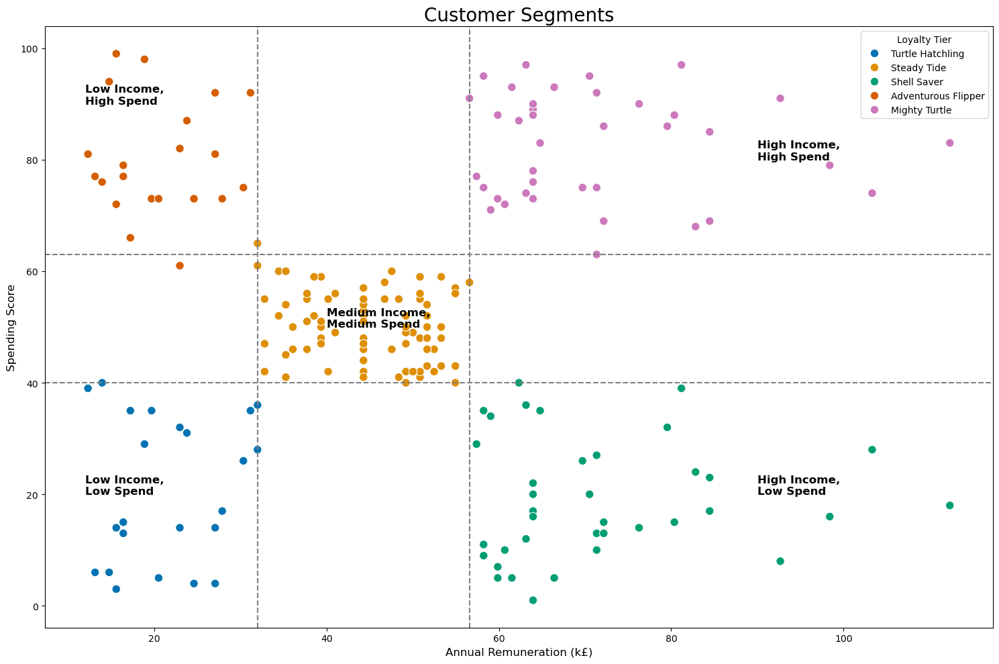

In [215]:
# Pass on the arguments for the division lines
# The lines are defined by checking the summary DataFrame displaying the min and max values of the annual income and the spending score

scat_div(31.98,56.58,40,63,'Customer Segments')

In [216]:
# Another alternative to the previous scatter plot is to define the division lines based on the quantiles
# Quantiles basically divides the plot area in a 3X3 Matrix
low_inc= var_cls['remuneration_k'].quantile(0.34)
high_inc = var_cls['remuneration_k'].quantile(0.69)

low_spen = var_cls['spending_score'].quantile(0.34)
high_spen = var_cls['spending_score'].quantile(0.69)

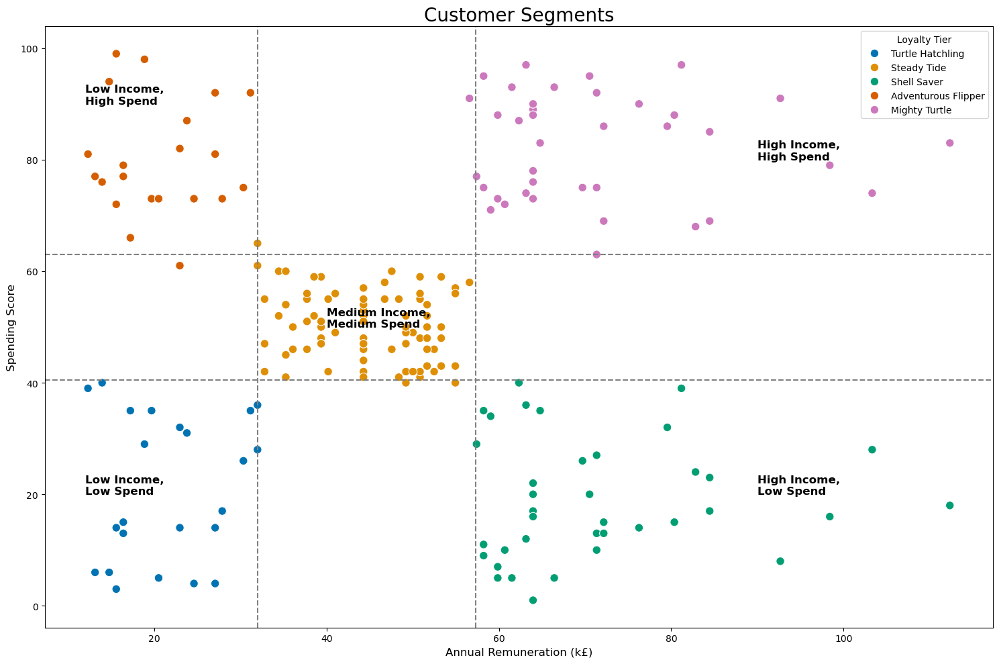

In [217]:
scat_div(low_inc,high_inc,low_spen,high_spen,'Customer Segments')

In [218]:
# Count of customers per cluster segment
cluster_counts = descaled_df['Cluster Segment'].value_counts()

# Percentage of customers per cluster segment
cluster_percentages = descaled_df['Cluster Segment'].value_counts(normalize=True) * 100

# Combine into a single DataFrame
cluster_summary = pd.DataFrame({
    'Count': cluster_counts,
    'Percentage': cluster_percentages.round(2)  
})

print(cluster_summary)

                              Count  Percentage
Cluster Segment                                
Medium Income / Medium Spend    273       34.91
Low Income / Low Spend          138       17.65
Low Income / High Spend         127       16.24
High Income / Low Spend         123       15.73
High Income / High Spend        121       15.47


In [219]:
# Calculate the number of customer per loyalty tier
descaled_df['Loyalty Tiers'].value_counts()

Loyalty Tiers
Steady Tide            273
Turtle Hatchling       138
Adventurous Flipper    127
Shell Saver            123
Mighty Turtle          121
Name: count, dtype: int64

In [220]:
# Join the descaled_df to df_orig to add the Cluster Segment identified through the clustering model
# This step is in preparation for the classification model
loytier_df = df_orig.join(descaled_df[['Hierarchical Clusters Predicted','Cluster Segment']], how='left')
loytier_df

,gender,age,remuneration_k,spending_score,loyalty_points,education,count,Hierarchical Clusters Predicted,Cluster Segment
0,Female,17,13.94,40,233,Postgraduate,1,0,Low Income / Low Spend
1,Female,17,35.26,54,797,Postgraduate,1,4,Medium Income / Medium Spend
2,Female,17,53.30,48,1071,Postgraduate,7,4,Medium Income / Medium Spend
3,Female,17,69.70,26,759,Postgraduate,1,1,High Income / Low Spend
4,Female,18,12.30,81,436,Graduate,1,3,Low Income / High Spend
...,...,...,...,...,...,...,...,...,...
777,Male,72,37.72,56,1264,Postgraduate,7,4,Medium Income / Medium Spend
778,Male,72,39.36,47,1107,Phd,1,4,Medium Income / Medium Spend
779,Male,72,40.18,55,1322,Phd,7,4,Medium Income / Medium Spend
780,Male,72,66.42,93,3695,Phd,1,2,High Income / High Spend


## 8. Classification model
Since customer segments were identified through the clustering model, a classification model was considered valuable for assigning new or  existing customers to their respective segments. 
The approach was as follows:

**Models not relying on the spending score**

Variables that were considered relevant in this case are:

- Age
- Gender
- Education
- Remuneration_k

These variables were chosen because they are typically provided by the customer upon sign-up.
Spending score was excluded as it is a reflection of the spending behaviour of the customers and may not be available upfront.
The aim is to use the classification for early-stage segmentation of new-customers to tailor marketing efforts and loyalty program to the predicted customer segment from the outset. 

Although the logic behind these models was sound, the performance of these models isn't promising and would more likely be misleading to the marketing team, given it could only consistently predict the medium income/medium spend. 

It was deemed inevitable to include the spending score and then assess the performance of the models.

**Models including the spending score**

To simplify the model, only two features were considered, namely annual remuneration and spending score. This model yielded near perfect results, which strongly suggest that it is over fitting the training data, rather than learning to generalize.

Remuneration was then removed and a final model was trained using only the spending score as the input feature. 

This model delivered satisfactory results, correctly identifying customer clusters with the following precisions:
- 71% Low Income / Low Spend
- 69% High Income / Low Spend
- 89% High Income / High Spend
- 87% Low Income / High Spend
- 96% Medium Income / Medium Spend

All high-spend clusters are predicted with high precision, which suggests that any marketing efforts invested towards those classes would highly likely go to their intended customers. 

In [222]:
# User defined model for a classification model
def clas(X_train, X_test, y_train, y_test,cluster_names):
    # Train classifier
    clf = RandomForestClassifier(random_state=42)
    clf.fit(X_train, y_train)

    # Predict and evaluate
    y_pred_class = clf.predict(X_test)
    print("\nClassification Report:")
    print(classification_report(y_test, y_pred_class))

    

    # Generate the confusion matrix again (if needed)
    cm = confusion_matrix(y_test, y_pred_class)
    labels = [cluster_names[i] for i in sorted(cluster_names)]

    # Plot the heatmap
    plt.figure(figsize=(10, 7))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=labels, yticklabels=labels)

    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.title('Confusion Matrix - Customer Loyalty Tiers Classification')
    plt.xticks(rotation=90)
    plt.yticks()
    plt.savefig('class.png',dpi=300, bbox_inches='tight')
    plt.show()

### 8a) CLassification model using all cluster segments
In this case the only segment that was predicted with high accuracy was the Medium Income/Medium spend. 

Other segments' classification precision ranged from 41% to 47%, which means that almost half the time they will be misclassified. 


Classification Report:
              precision    recall  f1-score   support

           0       0.44      0.48      0.46        42
           1       0.47      0.38      0.42        37
           2       0.47      0.56      0.51        36
           3       0.41      0.37      0.39        38
           4       0.98      0.99      0.98        82

    accuracy                           0.63       235
   macro avg       0.55      0.55      0.55       235
weighted avg       0.63      0.63      0.63       235



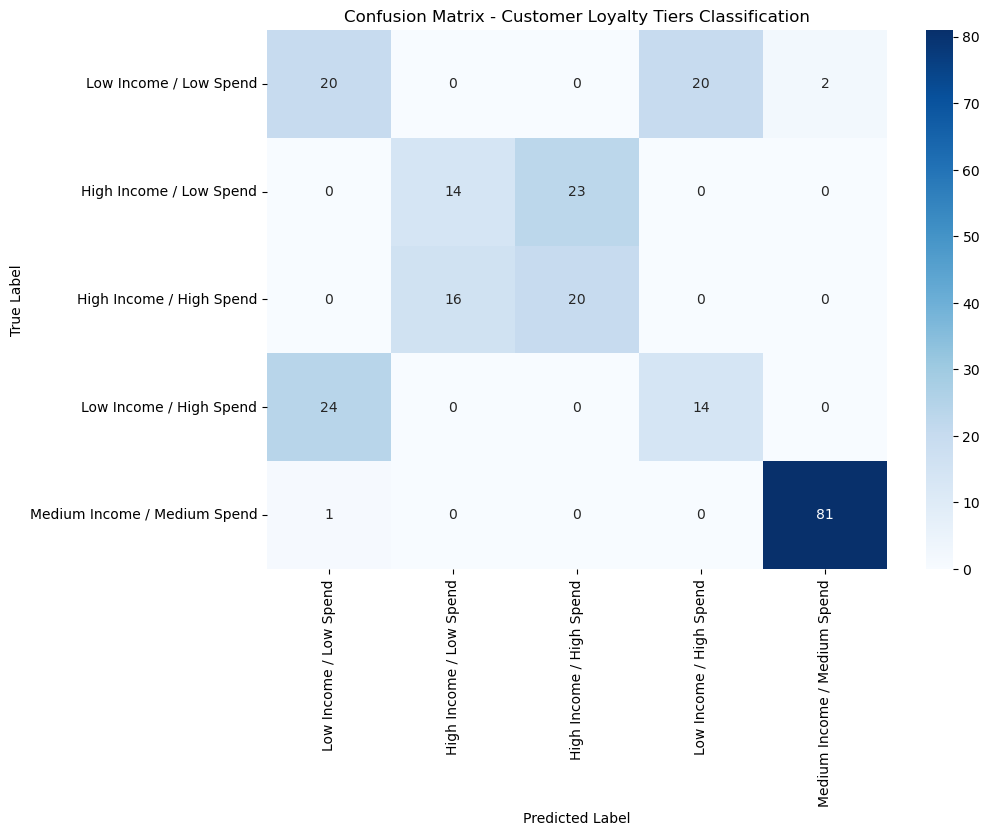

In [224]:
# Select features including categorical ones
Xclass = loytier_df[['age','gender', 'education','remuneration_k']]

# One-hot encode categorical features
Xclass_encoded = pd.get_dummies(Xclass, drop_first=True)

# Target variable
yclass = loytier_df['Hierarchical Clusters Predicted']

# Train-test split
X_train_class, X_test_class, y_train_class, y_test_class = train_test_split(
    Xclass_encoded, yclass, test_size=0.3, random_state=42, stratify=yclass
)

# Map numeric cluster to names (for display only)
cluster_names = {
    0: "Low Income / Low Spend",
    1: "High Income / Low Spend",
    2: "High Income / High Spend",
    3: "Low Income / High Spend",
    4: "Medium Income / Medium Spend"
    }

clas(X_train_class, X_test_class, y_train_class, y_test_class,cluster_names)

In [225]:
# Check the number of customers per segment as this could be causing the low predictive power of the classification
# Medium Income / Medium spend are over-represented in this case
loytier_df['Cluster Segment'].value_counts()

Cluster Segment
Medium Income / Medium Spend    273
Low Income / Low Spend          138
Low Income / High Spend         127
High Income / Low Spend         123
High Income / High Spend        121
Name: count, dtype: int64

### 8b) Apply Synthetic minority oversampling technique (SMOTE) to balance the clusters
SMOTE didn't improve the precision or accuracy of the classification model.

This could be caused by slight overlapps between the clusters.

source: https://www.blog.trainindata.com/smote-in-python-a-guide-to-balanced-datasets/


Classification Report:
              precision    recall  f1-score   support

           0       0.48      0.52      0.50        42
           1       0.42      0.35      0.38        37
           2       0.43      0.50      0.46        36
           3       0.45      0.39      0.42        38
           4       0.98      0.99      0.98        82

    accuracy                           0.63       235
   macro avg       0.55      0.55      0.55       235
weighted avg       0.63      0.63      0.63       235



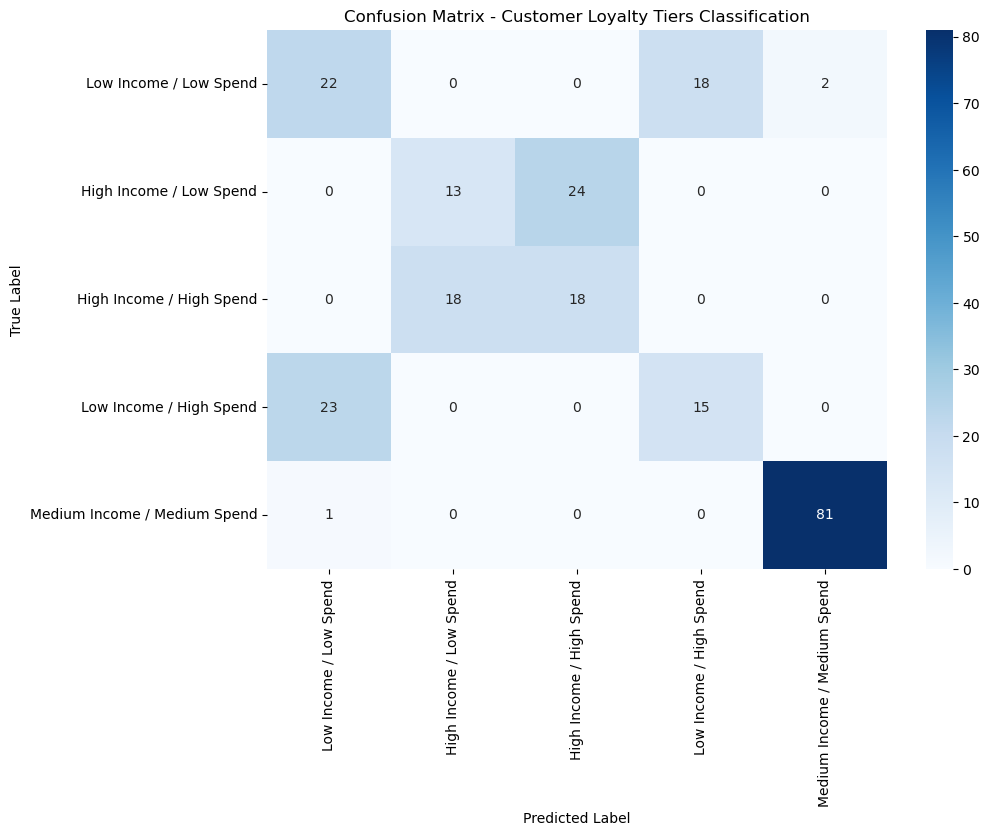

In [227]:
# Apply SMOTE only to the training data
sm = SMOTE(random_state=42)
X_train_smote, y_train_smote = sm.fit_resample(X_train_class, y_train_class)
# Apply SMOTE only to the training data
sm = SMOTE(random_state=42)
X_train_smote, y_train_smote = sm.fit_resample(X_train_class, y_train_class)


clas(X_train_smote, X_test_class, y_train_smote, y_test_class,cluster_names)

### 8c) Classification model including only high and medium income clusters
This is mainly because these clusters are seen to be of high-priority for any marketing or loyalty program investments.
The model in this case has better accuracy 99%, but this could be over-fitting the data


Classification Report:
              precision    recall  f1-score   support

           1       0.39      0.35      0.37        37
           2       0.43      0.49      0.46        37
           4       1.00      0.99      0.99        82

    accuracy                           0.72       156
   macro avg       0.61      0.61      0.61       156
weighted avg       0.72      0.72      0.72       156



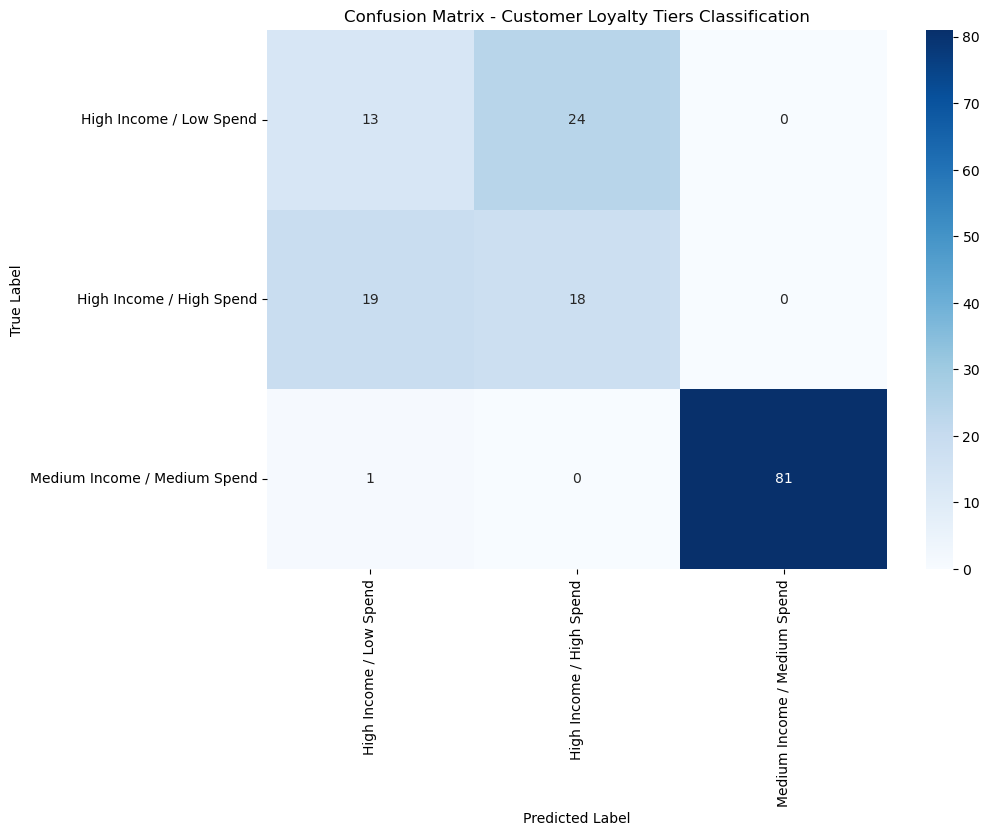

In [229]:
# Define which classes to keep
keep_classes = [1,2,4]

# Create the filtered dataset
filtered_df = loytier_df[loytier_df['Hierarchical Clusters Predicted'].isin(keep_classes)].copy()

# Select features including categorical ones
Xclass2 = filtered_df[['gender', 'education','remuneration_k']]

# One-hot encode categorical features
Xclass_encoded2 = pd.get_dummies(Xclass2, drop_first=True)

# Target variable
yclass2 = filtered_df['Hierarchical Clusters Predicted']

# Train-test split
X_train_class2, X_test_class2, y_train_class2, y_test_class2 = train_test_split(
    Xclass_encoded2, yclass2, test_size=0.3, random_state=42, stratify=yclass2
)
cluster_names = {1:"High Income / Low Spend",
                2:"High Income / High Spend",
                4:"Medium Income / Medium Spend"}

clas(X_train_class2, X_test_class2, y_train_class2, y_test_class2,cluster_names)

### 8d) Classification model excluding only low income/low spend
This is to avoid over-fitting the model and to include all relevant clusters for marketing and loyalty program investments. 
This is because it includes the priority clusters with high spend. 
It also includes high income/low spend that should be prioritized by Turtle games to re-engage them. 

In this case:
The model predicts Medium income/medium spend and high income/high spend with a 100% accuracy
High income/low spend with 55% accuracy and the low income/high spend with 49%. 

The model in this case confuses both clusters, which is problematic as our target would be to re-engage high income/low spend, while giving extra perks and loyalty currency for the low income/high spend. 


Classification Report:
              precision    recall  f1-score   support

           1       0.38      0.43      0.41        37
           2       0.34      0.30      0.32        37
           3       1.00      1.00      1.00        38
           4       1.00      1.00      1.00        82

    accuracy                           0.76       194
   macro avg       0.68      0.68      0.68       194
weighted avg       0.76      0.76      0.76       194



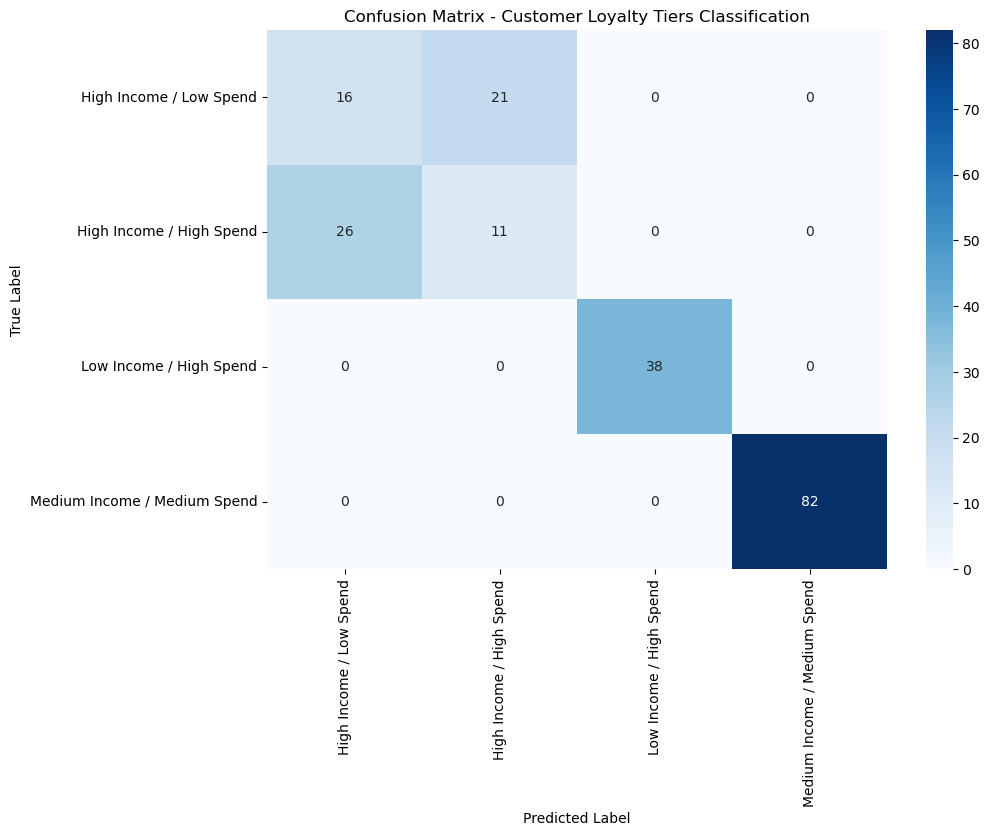

In [231]:
# Define which classes to keep
keep_classes = [1,2,3,4]

# Create the filtered dataset
filtered_df = loytier_df[loytier_df['Hierarchical Clusters Predicted'].isin(keep_classes)].copy()

# Select features including categorical ones
Xclass3 = filtered_df[['gender', 'education','remuneration_k']]

# One-hot encode categorical features
Xclass_encoded3 = pd.get_dummies(Xclass3, drop_first=True)

# Target variable
yclass3 = filtered_df['Hierarchical Clusters Predicted']

# Train-test split
X_train_class3, X_test_class3, y_train_class3, y_test_class3 = train_test_split(
    Xclass_encoded3, yclass3, test_size=0.3, random_state=42, stratify=yclass3
)

cluster_names = {1:"High Income / Low Spend",
                2:"High Income / High Spend",
                3:"Low Income / High Spend",
                4:"Medium Income / Medium Spend"}

clas(X_train_class3, X_test_class3, y_train_class3, y_test_class3,cluster_names)

### 8e) Classification model including all clusters and relying on spending_score and remuneration_k as the features


Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        42
           1       1.00      1.00      1.00        37
           2       0.97      1.00      0.99        36
           3       1.00      1.00      1.00        38
           4       1.00      0.99      0.99        82

    accuracy                           1.00       235
   macro avg       0.99      1.00      1.00       235
weighted avg       1.00      1.00      1.00       235



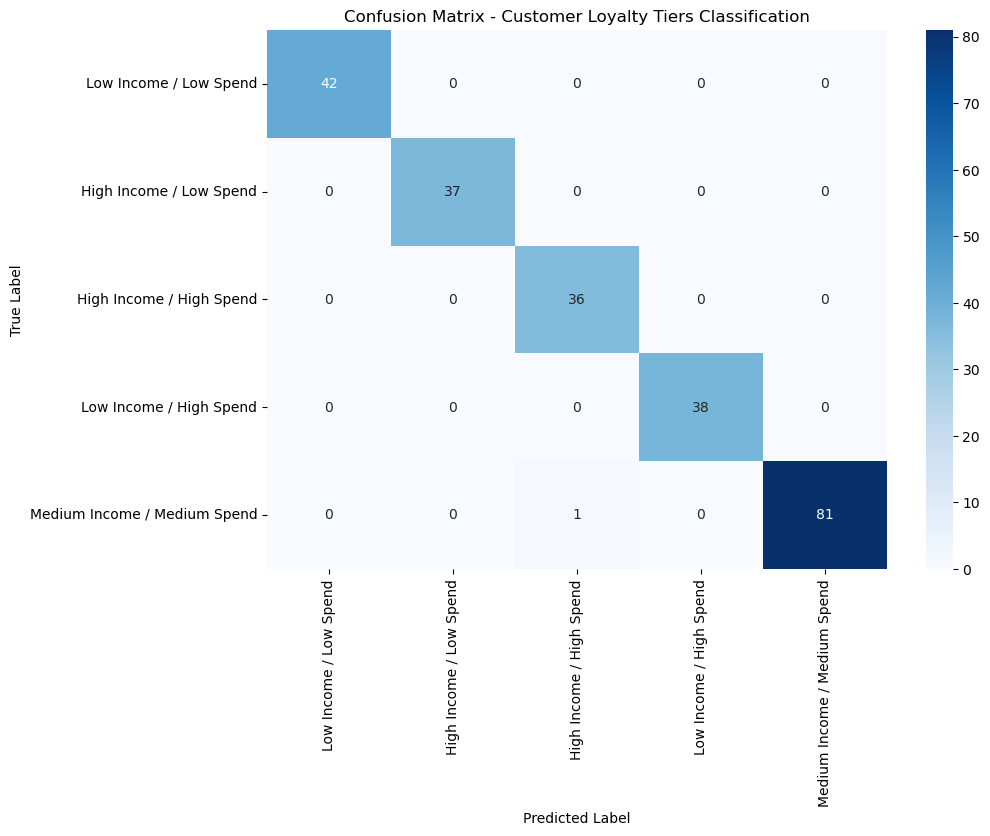

In [233]:
# Select features including categorical ones
Xclass4 = loytier_df[['remuneration_k','spending_score']]

# One-hot encode categorical features
Xclass_encoded4 = pd.get_dummies(Xclass4, drop_first=True)

# Target variable
yclass4 = loytier_df['Hierarchical Clusters Predicted']

# Train-test split
X_train_class4, X_test_class4, y_train_class4, y_test_class4 = train_test_split(
    Xclass_encoded4, yclass4, test_size=0.3, random_state=42, stratify=yclass4
)

# Map numeric cluster to names (for display only)
cluster_names = {
    0: "Low Income / Low Spend",
    1: "High Income / Low Spend",
    2: "High Income / High Spend",
    3: "Low Income / High Spend",
    4: "Medium Income / Medium Spend"
    }

clas(X_train_class4, X_test_class4, y_train_class4, y_test_class4,cluster_names)

### 8e) Classification model including all clusters and relying on spending_score and remuneration_k as the features


Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.69      0.70        42
           1       0.69      0.65      0.67        37
           2       0.89      0.89      0.89        36
           3       0.87      0.89      0.88        38
           4       0.96      0.99      0.98        82

    accuracy                           0.85       235
   macro avg       0.82      0.82      0.82       235
weighted avg       0.85      0.85      0.85       235



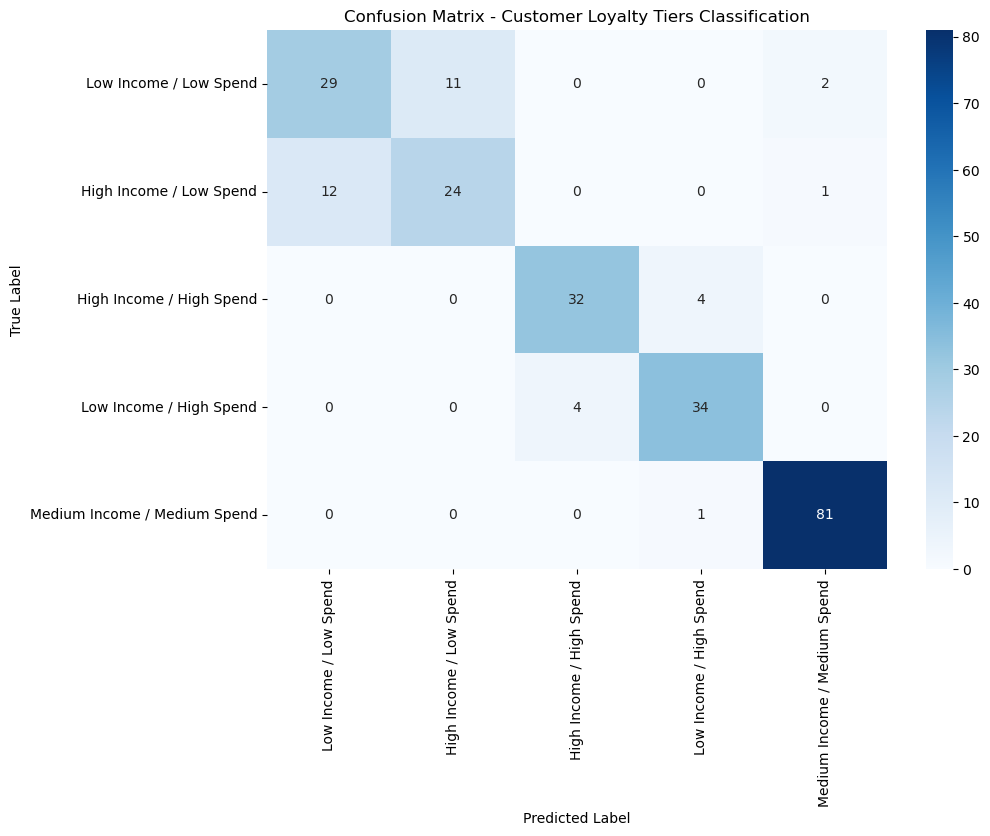

In [235]:
# Select features including categorical ones
Xclass5 = loytier_df[['spending_score']]

# One-hot encode categorical features
Xclass_encoded5 = pd.get_dummies(Xclass5, drop_first=True)

# Target variable
yclass5 = loytier_df['Hierarchical Clusters Predicted']

# Train-test split
X_train_class5, X_test_class5, y_train_class5, y_test_class5 = train_test_split(
    Xclass_encoded5, yclass5, test_size=0.3, random_state=42, stratify=yclass5
)

# Map numeric cluster to names (for display only)
cluster_names = {
    0: "Low Income / Low Spend",
    1: "High Income / Low Spend",
    2: "High Income / High Spend",
    3: "Low Income / High Spend",
    4: "Medium Income / Medium Spend"
    }

clas(X_train_class5, X_test_class5, y_train_class5, y_test_class5,cluster_names)

## 9. Recommendation for a tiered loyalty program based on the customer segments

Given the different income levels and spending behaviors identified in the customer base, our recommendation would be to implement a tiered loyalty program tailored to the customer segments.

**Reasoning**
Not all customers contribute equally to a brand's profit. A one tiered loyalty program or a program that doesn't reward high-value customers, risks neglecting high-spend valuable customers and over spending on low spend ones. 
This is supporet by the following Harvard Business Review.
source: https://hbr.org/1995/05/do-rewards-really-create-loyalty

A tiered approach helps the company allocate resources and investments strategically,while also encouraging deeper customer engagement, ultimately resulting in increased spending on products. 

**Customer Preference in Loyalty Program's Benefits**

As supported by BCG's insights, customers' preference for loyalty program's benefits globally prioritize:
- Loyalty currency
- Benefits
- Discounts
- Membership experience and free content

These preferences, however, vary by region and age as shown in the following charts.

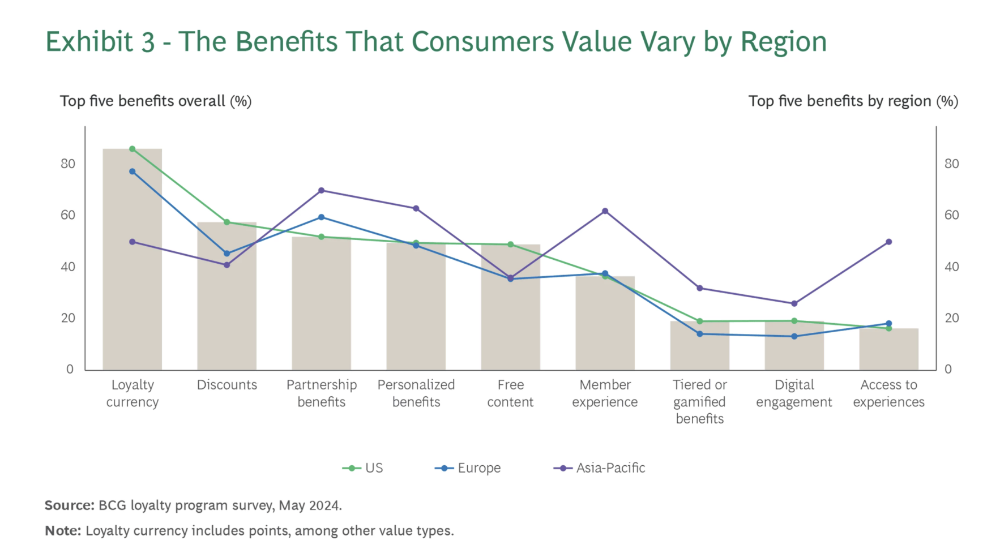
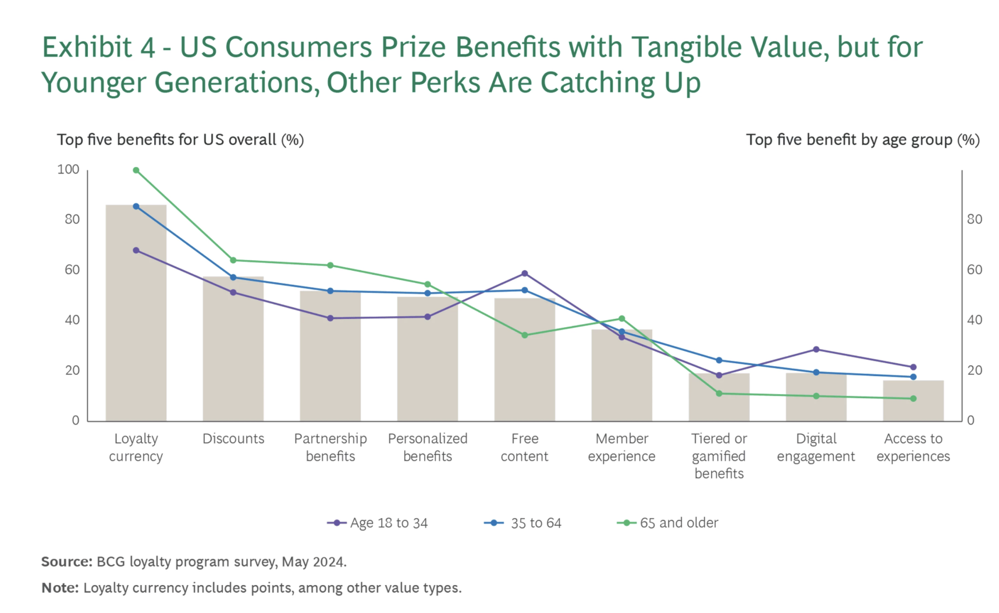
source: https://www.bcg.com/publications/2024/loyalty-programs-customer-expectations-growing

These preferences highlight that the benefits should not only be tailored to the spending behaviour but also to the customers' demographic information. 

**Data-Driven Marketing Strategy**
Our final classification model, trained on spending score, achieved strong performance scores for high-value customer segments. 
This highly encourages Turtle Games to rely on the results of the model to drive tailored reward allocation. 

**Branded Loyalty Program**
The tiers of the loyalty program could be also tailored to Turtle Games' brand as follows:
- Low Income/Low Spend --> Turtle Hatchling
- Low Incom/High Spend --> Adventurous Flipper
- Medium Income/Medium Spend --> Steady Tide
- High Income/Low Spend --> Shell Saver
- High Income/High Spend --> Mighty Turtle

This would add an element of fun and also is consistent with industry's best-practices

**Benchmark Best Practices** 

Drawing inspiration from leading industry loyalty programs such as Xbox Live Rewards, Amazon Prime Gaming & PlayStation Stars:

- Design a tiered loyalty program to cater to the different customer segments and to encourage higher engagement with the brand.
- The engagement can be through gaming challenges, reward point collection, participation in surveys...etc. 
- This could also be through special events and exclusive challenges offered to loyalty program members.
- The loyalty program could also offer a sense of prestige and status for customers belonging to the high tiers.
- This could be achieved by having milestones and clear goals that the customers can aspire to achieve and unlock further perks and benefits
- The program could potentially also include referral benefits
   
Source: https://www.helika.io/top-3-best-customer-loyalty-programs-for-games/

**Overall Recommendations**
1. Invest in high-value customers
2. Re-engage shell savers (High Income/Low Spend)
   - Tailored perks
   - Exclusive events
   - High-value benefits that match their high-earners status


# IV. Natural Language Processing (NLP)

**Methodology**

The logic behind the natural language processing followed the following sequence:

***A. Product and Product Categories***

First reviews and summaries were grouped by product number. This means that all reviews and summaries belonging to the same product number
were joined together. They were then tokenized, lemmatized, and stop words were removed along with extra keywords that were found to be redundant, and a document term matrix (DTM) was then built. 

The most common categories were then collected and categories were assigned to the products based on the keywords in the reviews. While not 100% accurate, assigned categories still give a sense of the categories that dominated the reviews, and where Turtle games need to collect more reviews to have a more representative sample. 

Polarity and subjectivity were then calculated per product, and the median of both scores was calculated to assign a polarity and subjectivity score per product category.

Charts were then created to show the top and lowest 20 products by polarity score. This is particularly useful for Turtle Games to identify problematic products.
Plots were then created for the top and worst 20 products based on polarity scores.

***B. High Loyalty Customers' Sentiment Analysis***

This analysis is extremely valuable in identifying customers with negative sentiment to proactively address their concerns. It is also valuable to identify the customers with positive sentiment to further engage them through the company's marketing efforts. 

***C. Reviews and Summary Analysis***

Other than the analysis per product, product category, and the sentiment analysis of high-loyalty customers, a global assessment of the reviews and summaries was also created.

**Word Clouds:**
- Word clouds were first plotted for summaries and reviews including the stop words
- Stop words were then removed, and updated word clouds were replotted

**Top 15 Keywords**
- Top 15 keywords were plotted for the reviews and the summaries on a horizontal bar plot
- While Word clouds are interesting representation of the most frequently used keywords, they may not be as clear as the bar plot with the top keywords.

**Top 20 Positive And Negative Summaries and Reviews**
A list of the top 20 positive and negative summaries and reviews was created to carefully identify the main concerns in the negative reviews and maintain the positive points in the positive ones. 


## 1. Load and explore the data

In [240]:
# Load the data set as df3.
df3=pd.read_csv('turtle_reviews_updated.csv')

# View DataFrame.
df3.head()

,customer_id,gender,age,education,remuneration_k,spending_score,loyalty_points,product,review,summary
0,1,Male,18,Graduate,12.30,39,210,453,"when it comes to a dm's screen, the space on t...",the fact that 50% of this space is wasted on a...
1,2,Male,23,Graduate,12.30,81,524,466,an open letter to galeforce9*:\n\nyour unpaint...,another worthless dungeon master's screen from...
2,3,Female,22,Graduate,13.12,6,40,254,"nice art, nice printing. why two panels are f...","pretty, but also pretty useless"
3,4,Female,25,Graduate,13.12,77,562,263,amazing buy! bought it as a gift for our new d...,five stars
4,5,Female,33,Graduate,13.94,40,366,291,as my review of gf9's previous screens these w...,money trap


In [241]:
# Explore data set.
df3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 10 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   customer_id     2000 non-null   int64  
 1   gender          2000 non-null   object 
 2   age             2000 non-null   int64  
 3   education       2000 non-null   object 
 4   remuneration_k  2000 non-null   float64
 5   spending_score  2000 non-null   int64  
 6   loyalty_points  2000 non-null   int64  
 7   product         2000 non-null   int64  
 8   review          2000 non-null   object 
 9   summary         2000 non-null   object 
dtypes: float64(1), int64(5), object(4)
memory usage: 156.4+ KB


In [242]:
# Number of represented products
# The results show that we have a representative number of reviews per product
num_products = df3['product'].value_counts()
num_products

product
1012    13
1031    13
979     12
977     11
3498    10
        ..
1459     9
263      9
466      8
254      8
453      8
Name: count, Length: 200, dtype: int64

## 2. Group reviews by Product number and build Document Term Matrix (DTM) to assign appropriate category 

Reviews were grouped and joined by product number. This is to collect all reviews related to a specific product. 

The reviews were then analyzed after tokenizing and lemmatizing, where they were transformed into a Document Term Matrix(DTM). 

The DTM helped count the most commonly used keywords across categories. 
This then enabled us to:
- Identify basic product categories based on the most frequently used keyword in the reviews
- Calculate a polarity and a subjectivity score, both per category and per product

### 2a) Assigning categories to the product numbers based on the Document Term Matrix (DTM)

In [246]:
# Combine reviews by product_number
product_reviews = df3.groupby('product')['review'].apply(lambda x: ' '.join(x)).reset_index()

In [247]:
# Set the product number as the index of the grouped_reviews DataFrame
# The product number will be then used in the document term matrix as the documents
product_reviews.set_index('product', inplace=True)

In [248]:
# Adjust the column width
product_reviews.style.set_properties(subset='review', **{'width':'1200px'})

In [249]:
# Setup tokenizer and lemmatizer

''' Tokenizer: splits the text into individual tokens (words)
Lemmatizer: extracts the word stem from the tokenized words and converts them to their common root'''

tokenizer = RegexpTokenizer(r'\b[a-zA-Z0-9]{2,}\b')
lemmatizer = WordNetLemmatizer()

# Create custom stop words 

'''Custom stop words also removed redundant words with high volumes that weren't included in the English stop words'''

english_stopwords = set(stopwords.words('english'))
#custom_stop_words = list(english_stopwords.union({
 #   'just', 'one', 'get', 'would', 'old', 'new',
  #  'much', 'use', 'also', 'little', 'make', 'playing', 'year','love'
#}))

# Define a custom tokenizer function that uses RegexpTokenizer and lemmatizer
def custom_tokenizer(text):

    ''' The aim of this function is to tokenize and lemmatize the tokens(words). This is to be able to pass them to the count vectorizer'''
    
    tokens = tokenizer.tokenize(text.lower())  # Apply regex tokenizer
    lemmatized = [lemmatizer.lemmatize(token) for token in tokens if token not in english_stopwords]
    return lemmatized

# Create the CountVectorizer with the custom tokenizer
cv = CountVectorizer(tokenizer=custom_tokenizer)

# Apply the transformation to the review column data
cvs = cv.fit_transform(product_reviews['review'])

In [250]:
# Create DataFrame with product number as index
dt = pd.DataFrame(cvs.toarray(), columns=cv.get_feature_names_out(), index=product_reviews.index)

# Transpose to get terms as rows and products as columns
document_term_matrix = dt.T

# Get total frequency for each term
# This step was important to identify the product category based on the reviews
document_term_matrix['total_count'] = document_term_matrix.sum(axis=1)

# Sort the Document Term Matrix based on the total count column
document_term_matrix = document_term_matrix.sort_values(by='total_count', ascending=False)

# Drop the total count column and display the first 20 rows of the DataFrame
#document_term_matrix.drop(columns='total_count',inplace=True)
dtm = document_term_matrix
dtm.head(10)

product,107,123,195,231,249,254,263,283,291,326,...,10270,10281,10995,11003,11004,11025,11056,11084,11086,total_count
game,24,15,13,10,11,5,3,54,12,6,...,12,9,1,9,6,8,5,3,2,1967
great,4,3,5,3,5,1,2,2,5,0,...,1,5,2,4,4,4,3,4,2,598
one,3,4,6,2,2,3,1,7,3,4,...,10,3,2,2,3,1,5,1,1,580
fun,2,6,2,3,4,4,4,5,4,2,...,2,3,0,1,2,1,1,1,1,558
play,1,6,7,2,2,3,2,10,5,2,...,2,6,0,3,2,0,3,2,2,549
love,2,1,4,1,7,1,0,1,5,3,...,6,3,5,5,4,2,3,5,3,477
like,2,2,1,7,3,1,0,8,1,0,...,7,3,1,1,0,0,2,1,1,441
card,5,4,1,2,1,0,1,8,2,0,...,2,2,0,4,4,1,1,0,1,440
tile,4,1,1,0,4,0,0,1,0,0,...,10,24,1,1,0,2,0,0,0,404
get,7,2,3,0,4,1,1,7,1,1,...,1,3,0,2,2,1,0,2,2,370


In [251]:
# Based on the most frequently used kws across products and checked reviews the following categories were defined
# This list will be used to filter the Document Term Matrix 
# Six categories were identified and based on the DTM has been assigned to the products
keywords_to_check = ['board','puzzle','book','card','toy']

In [252]:
# Keep only the keywords that are in present keywords
filtered_dtm = dtm.loc[keywords_to_check]

# Transpose the filtered dtm DataFrame and display the first 20 rows of it
cat_dtm = filtered_dtm.T
cat_dtm.head(20)

,board,puzzle,book,card,toy
product,,,,,
107,5,0,5,5,0
123,3,0,0,4,0
195,1,0,3,1,0
231,4,1,3,2,1
249,0,0,2,1,0
254,0,0,0,0,0
263,0,0,0,1,1
283,10,0,2,8,0
291,1,0,0,2,2


In [253]:
# Define a function that assigns the category based on the column values of each product
def assign_category(row):
   
    ''' If the total of the row is equal to 0, the category is labeled as "other". 
    Otherwise, the category is set to the column with the highest value in the row.
    Limitation: if both columns have the same value, the category is assigned as the category of the first column by order of columns'''
    
    if row.sum() == 0:
        return 'other'
    else:
        return row.idxmax()

# Apply function across rows
cat_dtm['category'] = cat_dtm.apply(assign_category, axis=1)

# Preview result
cat_dtm[['category']].head()

,category
product,
107,board
123,card
195,book
231,board
249,book


In [254]:
cat_dtm['category'].value_counts()

category
book      61
board     55
card      54
puzzle    12
toy       12
other      7
Name: count, dtype: int64

### 2b) Calculate the polarity of the compiled reviews per category and product number

The polarity and subjectivity of the product reviews are calculated to get a score per product. 

This would help turtle games to understand how their products are performing. 
It is also essential in identifying products with negative polarity scores (ie: negative reviews) for development and further improvement. 

***Median polarity and subjectivity scores by category***
- The median polarity and subjectivity scores were calculated for the grouped categories
- The reason for aggregating by the median and not the average is the big difference in number of products per category. The median is less biased by the number of products and would be a better measure compared to the simple mean. 
  
***By plotting the top and bottom 20 products by polarity score:***
- The max polarity score is 0.32 showing moderately positive sentiment
- From the 200 products only 1% have negative polarity (2 products: 6431 & 9597)

In [257]:
# Create a user defined function remove punctuation and sumbols 
def clean_text(text):
    #text = text.lower()
    # Remove punctuation and numbers
    text = re.sub(r'[^a-z\s]', '', text)
    # Remove extra white spaces
    text = re.sub(r'\s+', ' ', text).strip() 
    return text

In [258]:
# Apply clean_text function to the the reviews in product_reviews
product_reviews['review']=product_reviews['review'].apply(clean_text)

In [259]:
# Calculate the polarity and subjectivity of product reviews per product number using the TextBlob library
product_reviews['polarity'] = product_reviews['review'].apply(lambda x: TextBlob(x).sentiment.polarity)
product_reviews['subjectivity'] = product_reviews['review'].apply(lambda x: TextBlob(x).sentiment.subjectivity)
product_reviews

,review,polarity,subjectivity
product,,,
107,i gave this as a christmas present and it seem...,0.027561,0.485155
123,very fun game for my family my year old niece ...,0.126754,0.487309
195,holy cow ok so we use sharpies to color and th...,0.154944,0.505786
231,these are intricate designs for older children...,0.079980,0.532562
249,this was a stocking stuffer for my son it was ...,0.184345,0.513976
...,...,...,...
11004,this was a christmas present for a nephew who ...,0.144399,0.499944
11025,the quality of the book is awesome i gave it a...,0.104156,0.540481
11056,awesome book one of my staff will be using thi...,0.118810,0.430464


In [260]:
# Get the distribution of the polarity score
product_reviews['polarity'].describe()

count    200.000000
mean       0.150908
std        0.060637
min       -0.005720
25%        0.109819
50%        0.146348
75%        0.193302
max        0.322680
Name: polarity, dtype: float64

In [261]:
# Get the distribution of the subjectivity score
product_reviews['subjectivity'].describe()

count    200.000000
mean       0.509092
std        0.038610
min        0.370186
25%        0.481024
50%        0.508911
75%        0.531352
max        0.622927
Name: subjectivity, dtype: float64

In [262]:
# Join the product_reviews with the cat_dtm to have a DataFrame with both polarity and subjectivity score, product number and category
sent_cat = product_reviews.join(cat_dtm)

In [263]:
# Sort the sent_cat DataFrame by polarity
sent_cat = sent_cat.sort_values(by='polarity',ascending=False).reset_index()
sent_cat

,product,review,polarity,subjectivity,board,puzzle,book,card,toy,category
0,11086,awesome starts of by showing basic stick figur...,0.322680,0.521808,0,0,2,1,0,book
1,515,fits perfectly in a party favor bag really gre...,0.295990,0.597712,4,0,0,0,1,board
2,6287,this wasnt really what i thought it would be t...,0.288660,0.565531,0,0,4,0,1,book
3,3657,great purchase and got it in good time pom pom...,0.287023,0.500886,1,0,1,1,0,board
4,6310,i have always been able to draw what i saw wit...,0.281519,0.620873,1,0,1,1,1,board
...,...,...,...,...,...,...,...,...,...,...
195,6424,most of the dover little books are high qualit...,0.026893,0.550152,2,0,1,8,0,card
196,2870,love this little book for an extra little fun ...,0.008710,0.444463,0,1,1,2,0,card
197,2324,this is a very small book but for it was a fun...,0.007844,0.494544,3,0,1,16,0,card
198,6431,i double checked the contents to make sure eve...,-0.004794,0.550037,2,0,1,1,0,board


In [264]:
# User Defined Function to plot a bar plot
def bar_plot(df,X,Y,Hue,Ylabel,Xlabel,title):
    ''' User defined function to plot bar plots by defining:
        -DataFrame
        -X & Y
        -X & Y axis labels and titles'''
    sns.set_palette("colorblind")
    sns.barplot(data=df,x=X,y=Y,hue=Hue)
    plt.ylabel(Ylabel)
    plt.xlabel(Xlabel)
    plt.title(title)
    plt.savefig(title,dpi=300, bbox_inches='tight')
    plt.show()


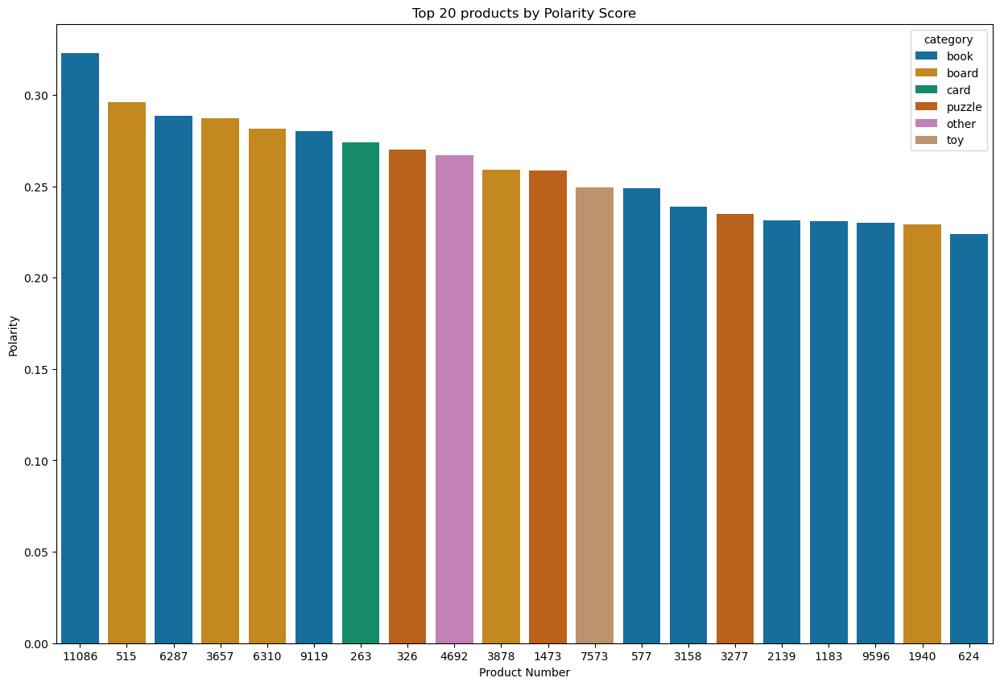

In [265]:
# Set the product column as string
sent_cat['product']=sent_cat['product'].astype(str)

# Sort products by polarity
top_sentiment = sent_cat.sort_values(by='polarity', ascending=False)
top_sentiment = top_sentiment.head(20)

# Plot the products with the top 20 polarity scores
bar_plot(top_sentiment,'product','polarity','category','Polarity','Product Number','Top 20 products by Polarity Score')
plt.show()

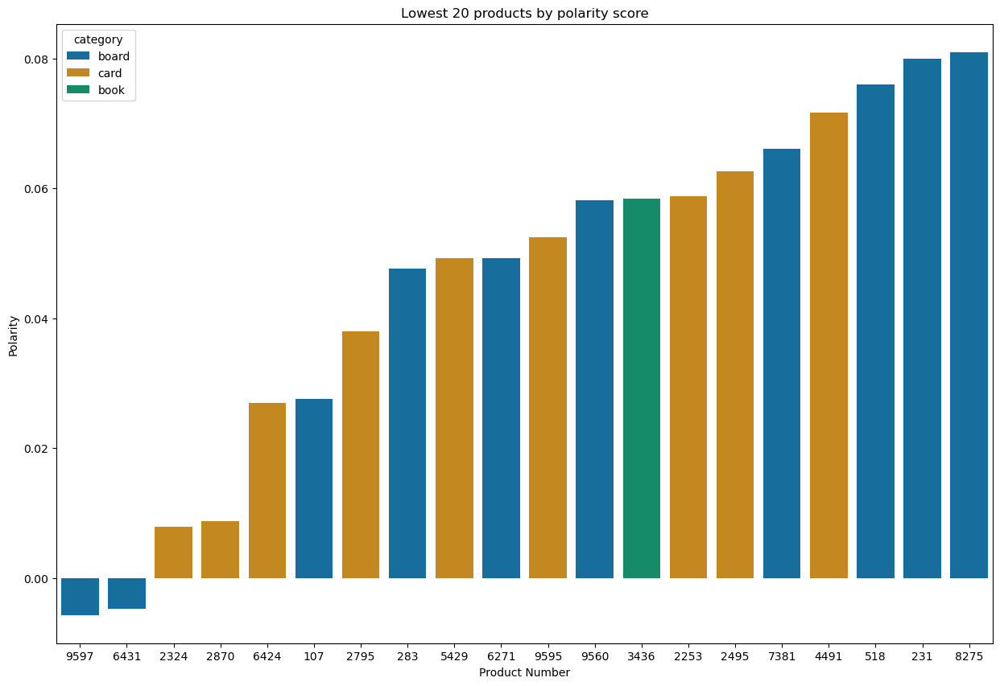

In [266]:
# Sort products by polarity
low_sentiment = sent_cat.sort_values(by='polarity', ascending=True).head(20)

# Plot the lowest 20 products by polarity score
bar_plot(low_sentiment,'product','polarity','category','Polarity','Product Number','Lowest 20 products by polarity score')


In [267]:
# Sort products by polarity
cat_summary = sent_cat.groupby('category').agg(
    med_polarity=('polarity', 'median'),
    med_subjectivity =('subjectivity','median'),
    num_products=('product', 'count')
).reset_index().sort_values(by='med_polarity', ascending=False)
cat_summary

,category,med_polarity,med_subjectivity,num_products
5,toy,0.173275,0.477552,12
4,puzzle,0.171917,0.520422,12
1,book,0.168526,0.513976,61
3,other,0.145745,0.521039,7
0,board,0.136500,0.502255,55
2,card,0.126754,0.510112,53


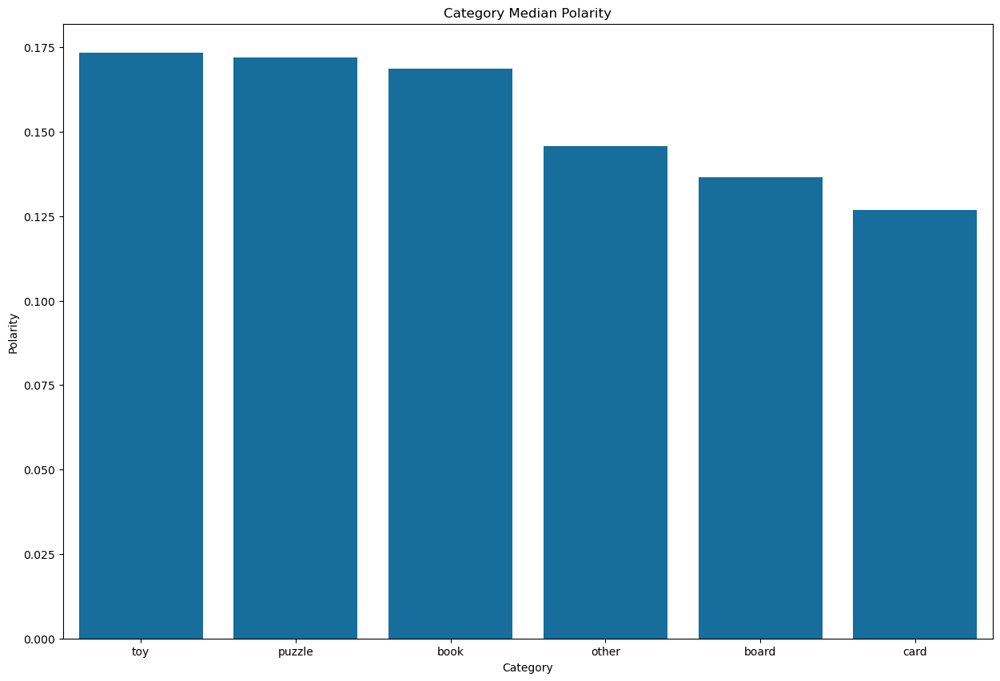

In [268]:
# Plot the lowest 20 products by polarity score
bar_plot(cat_summary,'category','med_polarity',None,'Polarity','Category','Category Median Polarity')

#### Product and Category Sentiment Observations
**Key Insights**
- Only two products have negative polarity. These will be reported to Turtle Games for product development and improvement
- To simplify category assignment, categories were chosen to represent the data in the DTM and the reviews and summaries.
- Products under the board and card category show the lowest positive sentiment, suggesting that customers may have been more subjective writing those reviews. The reviews for these categories mainly focuses on practical aspects like game setup, description and rules, rather than expressing strong emotions.
- Toys, puzzles and books have a higher positive sentiment likely because these products are aimed at younger children. Reviews are, in this case, written by parents or grandparents, who tend to express stronger, more positive emotions in their feedback.

## 3. High Loyalty Customers - Review analysis
This section focuses on analyzing reviews from customers with high loyalty points (>=4000). 
All reviews by each high-loyalty customer are aggregated and cleaned before calculating a polarity score.

The primary objective of the analysis is to:
- Identify customers with negative sentiment to proactively address their concerns and avoid losing them.
- Recognize customers with high polarity who could serve as brand advocates or targeted for extra engagement.

A total of 8 customers with negative sentiment have been identified, while only two customers had a polarity score above 0.8.

In [271]:
# Filter for the customers with mig to high loyalty points
high_loy = df3[df3['loyalty_points']>=4000]
high_loy = high_loy[['customer_id','review']]
high_loy

,customer_id,review
163,164,this was a christmas present for a nephew who ...
167,168,awesome. starts of by showing basic stick figu...
173,174,horrible!\nnothing more to say\nwould give zer...
175,176,great product and clear instructions.
179,180,i double checked the contents to make sure eve...
...,...,...
1984,769,"yes, you can find obscure short words to use i..."
1986,771,love playing quiddler and this dictionary help...
1993,190,gift
1995,778,the perfect word game for mixed ages (with mom...


In [272]:
grouped_highloy = high_loy.groupby('customer_id')['review'].apply(lambda x: ' '.join(x)).reset_index()
grouped_highloy

,customer_id,review
0,164,this was a christmas present for a nephew who ...
1,168,awesome. starts of by showing basic stick figu...
2,174,horrible!\nnothing more to say\nwould give zer...
3,176,great product and clear instructions. similar ...
4,180,i double checked the contents to make sure eve...
...,...,...
61,767,fun game
62,769,"yes, you can find obscure short words to use i..."
63,771,love playing quiddler and this dictionary help...
64,778,the perfect word game for mixed ages (with mom...


In [273]:
# Calculate the polarity of product reviews per product number using the TextBlob library
grouped_highloy['polarity'] = grouped_highloy['review'].apply(lambda x: TextBlob(x).sentiment.polarity)
grouped_highloy['subjectivity'] = grouped_highloy['review'].apply(lambda x: TextBlob(x).sentiment.subjectivity)
grouped_highloy

,customer_id,review,polarity,subjectivity
0,164,this was a christmas present for a nephew who ...,0.055677,0.550288
1,168,awesome. starts of by showing basic stick figu...,0.150064,0.487364
2,174,horrible!\nnothing more to say\nwould give zer...,0.214194,0.660348
3,176,great product and clear instructions. similar ...,0.058686,0.470823
4,180,i double checked the contents to make sure eve...,0.251087,0.503382
...,...,...,...,...
61,767,fun game,-0.050000,0.300000
62,769,"yes, you can find obscure short words to use i...",0.020000,0.380000
63,771,love playing quiddler and this dictionary help...,0.187500,0.453333
64,778,the perfect word game for mixed ages (with mom...,0.233929,0.564286


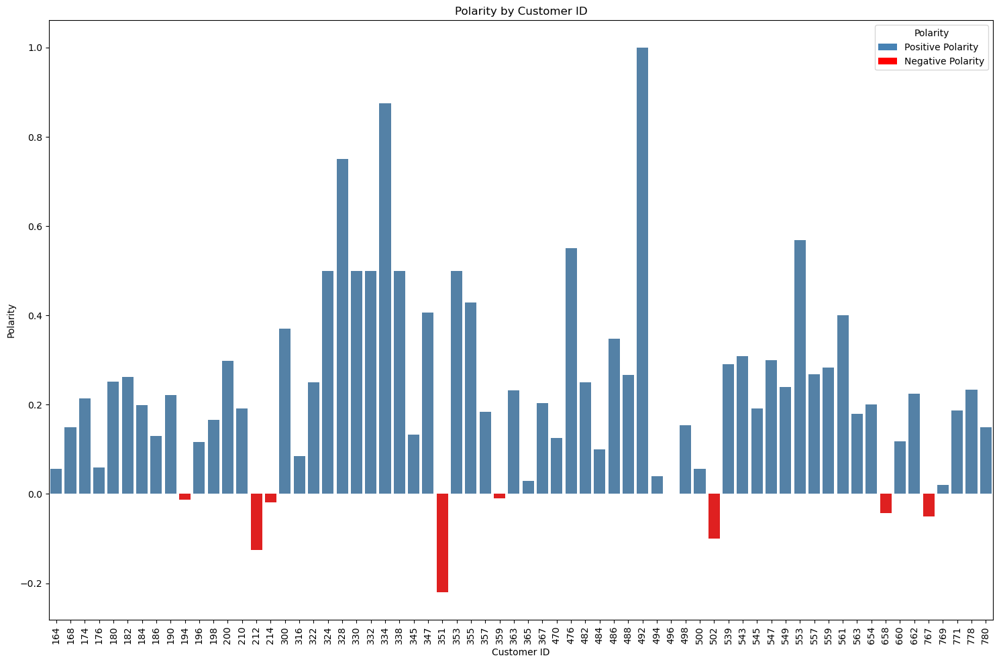

In [274]:
# Plot grouped_highloy to display the customer ID together with their polarity score
# This is mainly to identify customers with negative polarity
# Assign colors: red for negative, blue (or any) for positive
colors = ['red' if val < 0 else 'steelblue' for val in grouped_highloy['polarity']]

# Plot with custom colors
sns.barplot(
    data=grouped_highloy,
    x='customer_id',
    y='polarity',
    palette=colors,
    edgecolor='none'
)

# Add labels and formatting
plt.xlabel('Customer ID')
plt.ylabel('Polarity')
plt.title('Polarity by Customer ID')
plt.xticks(rotation=90)
plt.tight_layout()

# Create custom legend
legend_elements = [
    Patch(facecolor='steelblue', label='Positive Polarity'),
    Patch(facecolor='red', label='Negative Polarity')
]
plt.legend(handles=legend_elements, title='Polarity')
plt.savefig('Polarity by Customer ID.png',dpi=300, bbox_inches='tight')
plt.show()

In [275]:
# Filter grouped_highloy DataFrame to only include customers with negative polarity reviews
negative_highloy = grouped_highloy[grouped_highloy['polarity']<0]
negative_highloy 

,customer_id,review,polarity,subjectivity
9,194,"i ran out of yarn, actually ran short while ma...",-0.013006,0.434924
14,212,the base game is extremely fun and easy to lea...,-0.124848,0.549394
15,214,this is a very well designed and balanced set ...,-0.019127,0.471727
27,351,this says it is 5 sheets when in fact it is 5 ...,-0.220833,0.320833
31,359,after the usual round of discussing the rules ...,-0.010000,0.350000
46,502,i haven't had much time to play with it - when...,-0.100000,0.400000
58,658,"omg, don't hesitate to buy, we play so much th...",-0.042857,0.400000
61,767,fun game,-0.050000,0.300000


In [276]:
# Filter grouped_highloy DataFrame to only include customers with positive polarity reviews
positive_highloy = grouped_highloy[grouped_highloy['polarity']>0]
positive_highloy.head()

,customer_id,review,polarity,subjectivity
0,164,this was a christmas present for a nephew who ...,0.055677,0.550288
1,168,awesome. starts of by showing basic stick figu...,0.150064,0.487364
2,174,horrible!\nnothing more to say\nwould give zer...,0.214194,0.660348
3,176,great product and clear instructions. similar ...,0.058686,0.470823
4,180,i double checked the contents to make sure eve...,0.251087,0.503382


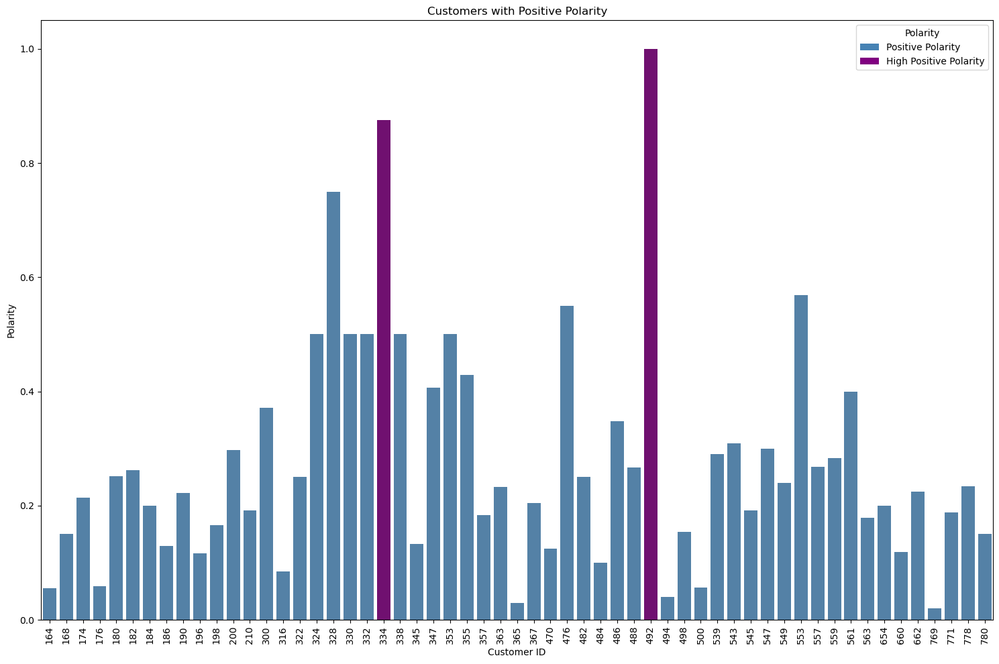

In [277]:
# Assign colors: red for negative, blue (or any) for positive
colors = ['purple' if val > 0.8 else 'steelblue' for val in positive_highloy['polarity']]

# Plot with custom colors
sns.barplot(
    data=positive_highloy,
    x='customer_id',
    y='polarity',
    palette=colors,
    edgecolor='none'
)

# Add labels and formatting
plt.xlabel('Customer ID')
plt.ylabel('Polarity')
plt.title('Customers with Positive Polarity')
plt.xticks(rotation=90)
plt.tight_layout()

# Create custom legend
legend_elements = [
    Patch(facecolor='steelblue', label='Positive Polarity'),
    Patch(facecolor='purple', label='High Positive Polarity')
]
plt.legend(handles=legend_elements, title='Polarity')
plt.savefig('Customers with positive polarity.png',dpi=300, bbox_inches='tight')
plt.show()

## 4. Global Review and Summary Assessment using Natural Language Processing (NLP)

### 4a) Prep the review and summary columns for the NLP
- Drop the numerical columns and only keep the summary and review columms
- Check for NA values in the review and summary columns
- Check for duplicates in the DataFrame and in the individual columns (review and summary)
- Only reviews in the review column that appeared to be copy-paste errors or exact duplicates were removed. These were the 3 sentences identified in the initial data exploration.
- Duplicates in the summary column were retained as they mostly consist of a word or two and it seemed reasonable that there would be duplicates. 

In [280]:
# Drop all columns except for the review and summary ones
rev_sum = df3[['review','summary']]
rev_sum

,review,summary
0,"when it comes to a dm's screen, the space on t...",the fact that 50% of this space is wasted on a...
1,an open letter to galeforce9*:\n\nyour unpaint...,another worthless dungeon master's screen from...
2,"nice art, nice printing. why two panels are f...","pretty, but also pretty useless"
3,amazing buy! bought it as a gift for our new d...,five stars
4,as my review of gf9's previous screens these w...,money trap
...,...,...
1995,the perfect word game for mixed ages (with mom...,the perfect word game for mixed ages (with mom
1996,great game. did not think i would like it whe...,super fun
1997,great game for all.........\nkeeps the mind ni...,great game
1998,fun game!,four stars


In [281]:
# Determine if there are any missing values.
rev_sum.isna().sum()

review     0
summary    0
dtype: int64

In [282]:
# Determine the number of duplicated rows in each column
rev_sum.duplicated().sum()

25

In [283]:
# Determine the number of duplicated rows in the summary column
dupl_review = rev_sum[rev_sum.duplicated(subset=['review'],keep='first')]
dupl_review

,review,summary
326,love it,five stars
371,great!,five stars
408,great,five stars
416,love it,five stars
430,love it,five stars
811,great game,five stars
959,love it,five stars
979,great game,five stars
1006,great game,five stars
1037,awesome,five stars


In [284]:
# Create a list of reviews to remove if present in the review column
# As these are highly unlikely to be correct duplicates, it would be better to remove them 
review_to_remove = ['on-time and nice item', 'this set is slightly worse than earlier ones', 'great expansion to a great game']

# Create regex pattern to match any of the reviews in the review_to_remove list
pattern = '|'.join(review_to_remove)

# Filter rows where 'review' does NOT contain any of those words
filtered_revsum = rev_sum[~rev_sum['review'].str.contains(pattern, case=False, na=False)]

In [285]:
# Check if the duplicated reviews were removed
dupl_review_check = filtered_revsum[filtered_revsum.duplicated(subset=['review'],keep='first')]
dupl_review_check

,review,summary
326,love it,five stars
371,great!,five stars
408,great,five stars
416,love it,five stars
430,love it,five stars
811,great game,five stars
959,love it,five stars
979,great game,five stars
1006,great game,five stars
1037,awesome,five stars


### 4b) Replace punctuation in each of the columns respectively (review and summary)

In [287]:
# Replace all the punctuations in review column.
rev_sum['review']=rev_sum['review'].str.replace('[^\w\s]','',regex=True)

# Preview the review column after the change
rev_sum['review'].head()

0    when it comes to a dms screen the space on the...
1    an open letter to galeforce9\n\nyour unpainted...
2    nice art nice printing  why two panels are fil...
3    amazing buy bought it as a gift for our new dm...
4    as my review of gf9s previous screens these we...
Name: review, dtype: object

In [288]:
# Replace all the punctuations in summary column.
rev_sum['summary']=rev_sum['summary'].str.replace('[^\w\s]','',regex=True)

# Preview the summary column after the change
rev_sum['summary'].head()

0    the fact that 50 of this space is wasted on ar...
1    another worthless dungeon masters screen from ...
2                       pretty but also pretty useless
3                                           five stars
4                                           money trap
Name: summary, dtype: object

### 4c) Create initial wordclouds

In [290]:
# Create new DataFrame (copy DataFrame).
nlp = rev_sum

# View DataFrame.
nlp['review']

0       when it comes to a dms screen the space on the...
1       an open letter to galeforce9\n\nyour unpainted...
2       nice art nice printing  why two panels are fil...
3       amazing buy bought it as a gift for our new dm...
4       as my review of gf9s previous screens these we...
                              ...                        
1995    the perfect word game for mixed ages with mom ...
1996    great game  did not think i would like it when...
1997            great game for all\nkeeps the mind nimble
1998                                             fun game
1999    this game is fun a lot like scrabble without a...
Name: review, Length: 2000, dtype: object

### Reviews

In [292]:
# String all the reviews together in a single variable
# Create an empty string variable
all_review = ''
for i in range (nlp.shape[0]):
    # Add each review
    all_review = all_review + nlp['review'].iloc[i]

# View the reviews string
all_review

'when it comes to a dms screen the space on the screen itself is at an absolute premium the fact that 50 of this space is wasted on art and not terribly informative or needed art as well makes it completely useless the only reason that i gave it 2 stars and not 1 was that technically speaking it can at least still stand up to block your notes and dice rolls other than that it drops the ball completelyan open letter to galeforce9\n\nyour unpainted miniatures are very not bad your spell cards are great your board games are meh your dm screens however are freaking terrible im still waiting for a single screen that isnt polluted with pointless artwork where useful referenceable tables should be once again youve created a single use screen that is only useful when running the storm kings thunder adventure even despite the fact that its geared to that adventure path its usefulness negligible at best i massive swath of the inner panel is wasted on artwork and a bloated overland map which coul

In [293]:
# Review: Create a word cloud.
# Set the colour palette.
sns.set(color_codes=True)

# Create a WordCloud object.
review_cloud = WordCloud(width = 1600, height = 900, 
                background_color ='white',
                colormap = 'plasma', 
                stopwords = 'none',
                min_font_size = 10).generate(all_review) 

In [294]:
# User defined function to plot the Word Cloud
def plt_wordcloud (obj,title):
    
    '''The function of this user defined function is to draw the Word cloud and give it a title'''
    
    plt.figure(figsize = (16, 9), facecolor = None) 
    plt.imshow(obj) 
    plt.axis('off') 
    plt.title(title,fontsize=30)
    plt.tight_layout(pad = 0) 
    plt.savefig(title,dpi=300,bbox_inches='tight')
    plt.show()

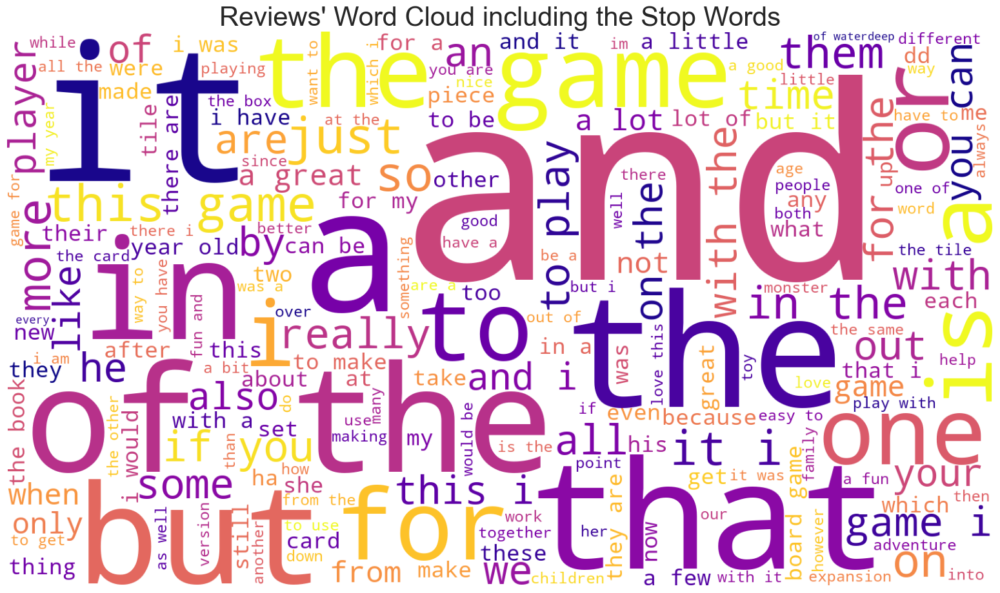

In [295]:
# Review: Plot the WordCloud image.
# Plot the WordCloud image.       
plt_wordcloud(review_cloud,"Reviews' Word Cloud including the Stop Words")


### Summary

In [297]:
# String all the summaries together in a single variable
# Create an empty string variable
all_summary = ''
for i in range (nlp.shape[0]):
    # Add each review
    all_summary = all_summary + nlp['summary'].iloc[i]

# View the reviews string
all_summary


'the fact that 50 of this space is wasted on art and not terribly informative or needed art another worthless dungeon masters screen from galeforce9pretty but also pretty uselessfive starsmoney trapfive starsbest gm screen everfive starsgreat but could be even betteranother missed opportunity  not a value add to the product linefive starslove the mapnot a general dm screenvery weak gamefell completely flatfive starsgood bookbuckley was a card mommervery advanced but as good as it getsyou better know what youre getting intodont botherthe worst value ive ever seennot enough productgood product buttemporary tattoos were good gifthuge hitgorgeous picturesfive starswonderful designswow great coloring booknice bookgreat picturesperfectwell donemy relaxationbeautiful coloring bookthe pictures are great ive done one and gave it to a great buy cant wait to work on this bookstained glass perfectionfour starsso beautifulgreat picturesvery nicefive starsfive starsfive starsfive starsfive starsfive

In [298]:
# Summary: Create a word cloud.
# Set the colour palette.
sns.set(color_codes=True)

# Create a WordCloud object.
summary_cloud = WordCloud(width = 1600, height = 900, 
                background_color ='white',
                colormap = 'plasma', 
                stopwords = 'none',
                min_font_size = 10).generate(all_summary) 

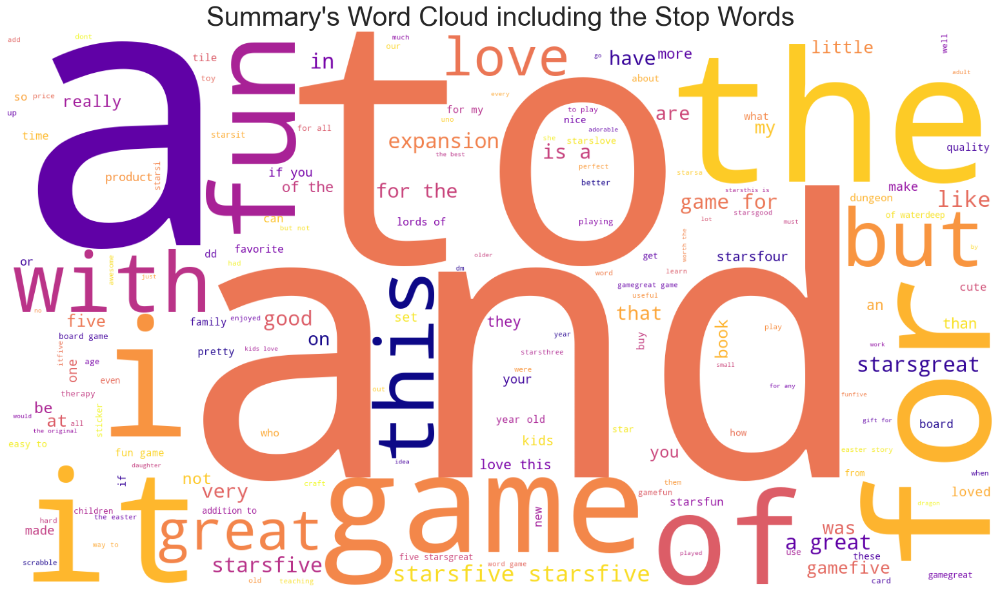

In [299]:
# Summary: Plot the WordCloud image.
# Plot the WordCloud image.                    
plt_wordcloud(summary_cloud,"Summary's Word Cloud including the Stop Words")

### 4d) Create frequency distribution

In [301]:
# Determine the frequency distribution for the reviews

# Tokenize the string of all_review into words
review_tokens = word_tokenize(all_review.lower())

# Calculate the frequency distribution.
fdist_rev = FreqDist(review_tokens)

# Preview data.
fdist_rev

FreqDist({'the': 5360, 'and': 3234, 'to': 3163, 'a': 3113, 'of': 2486, 'it': 1949, 'i': 1838, 'is': 1779, 'game': 1549, 'for': 1535, ...})

In [302]:
# Determine the frequency distribution for the summaries

# Tokenize the string of all_review into words
summary_tokens = word_tokenize(all_summary.lower())

# Calculate the frequency distribution.
fdist_sum = FreqDist(summary_tokens)

# Preview data.
fdist_sum

FreqDist({'for': 227, 'the': 226, 'to': 190, 'a': 184, 'game': 164, 'and': 161, 'of': 139, 'starsfive': 126, 'is': 101, 'great': 88, ...})

### 4e) Remove alphanumeric characters and stopwords

In [304]:
# Delete all the alpanum for the reviews
# Filter out tokens that are neither alphabets nor numbers 
reviews = [word for word in review_tokens if word.isalnum()]

In [305]:
# Delete all the alpanum for the summaries
# Filter out tokens that are neither alphabets nor numbers 
summary = [word for word in summary_tokens if word.isalnum()]

In [306]:
# Create a set of English stopwords.
english_stopwords = set(stopwords.words('english'))

In [307]:
# Remove all the stopwords from reviews
# Create a filtered list of tokens without stopwords.
reviews_stp = [x for x in reviews if x.lower() not in english_stopwords ]

# Define an empty string variable.
reviews_stp_string = ''

for value in reviews_stp:
    # Add each filtered token word to the string.
    reviews_stp_string = reviews_stp_string + value + ' '

In [308]:
# Remove all the stopwords from summaries
# Create a filtered list of tokens without stopwords.
summary_stp = [x for x in summary if x.lower() not in english_stopwords]

# Define an empty string variable.
summary_stp_string = ''

for value in summary_stp:
    # Add each filtered token word to the string.
    summary_stp_string = summary_stp_string + value + ' '

### 4f) Create wordcloud without stopwords

In [310]:
# Create a wordcloud without stop words for reviews
# Review: Create a word cloud.
# Set the colour palette.
sns.set(color_codes=True)

# Create a WordCloud object.
review_cloud_stp = WordCloud(width = 1600, height = 900, 
                background_color ='white',
                colormap = 'plasma', 
                stopwords = 'none',
                min_font_size = 10).generate(reviews_stp_string) 

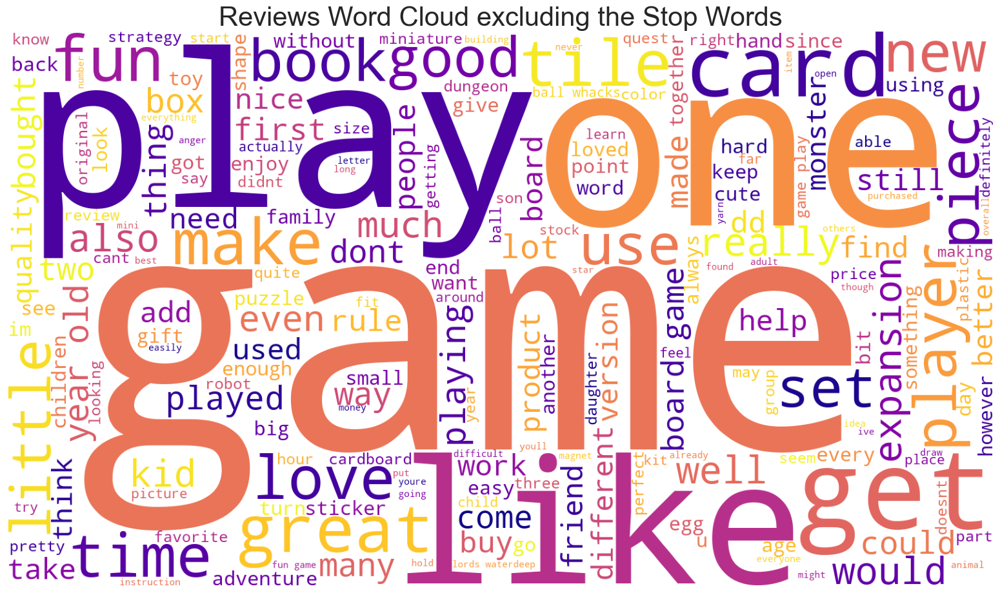

In [311]:
# Plot the wordcloud image for reviews                   
plt_wordcloud(review_cloud_stp,'Reviews Word Cloud excluding the Stop Words')


In [312]:
# Create a wordcloud without stop words for summary
# Summary: Create a word cloud.
# Set the colour palette.
sns.set(color_codes=True)

# Create a WordCloud object.
summary_cloud_stp = WordCloud(width = 1600, height = 900, 
                background_color ='white',
                colormap = 'plasma', 
                stopwords = 'none',
                min_font_size = 10).generate(summary_stp_string) 

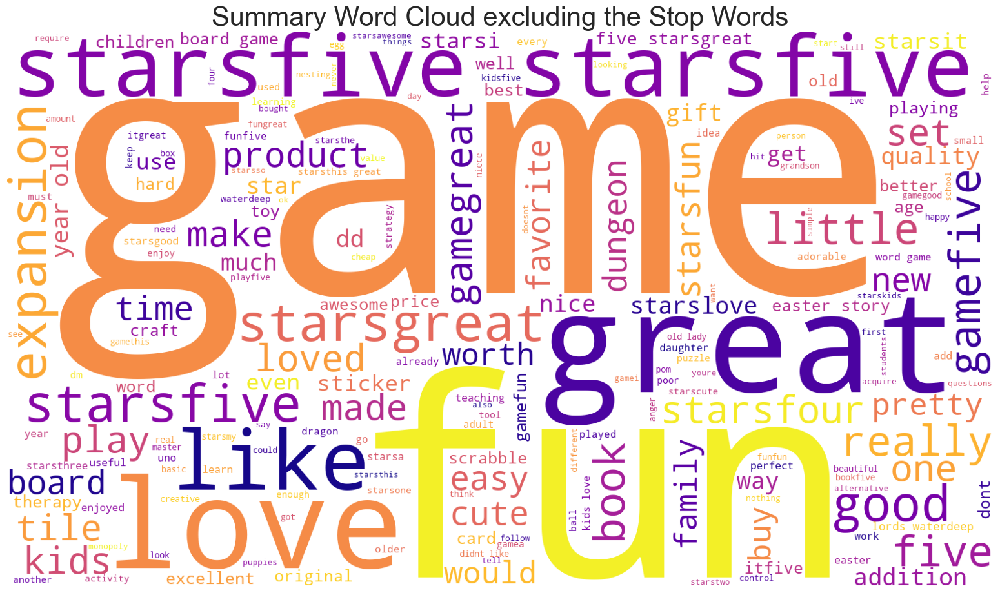

In [313]:
# Plot the wordcloud image for summary                
plt_wordcloud(summary_cloud_stp,'Summary Word Cloud excluding the Stop Words')


### 4g) Identify 15 most common words and polarity

In [315]:
# Determine the 15 most common words in reviews
# Tokenize the string of all_review into words
review_tokens_stp = word_tokenize(reviews_stp_string.lower())

# View the frequency distribution.
fdist_review_stp = FreqDist(review_tokens_stp)

# Preview the data.
fdist_review_stp

FreqDist({'game': 1549, 'one': 506, 'play': 483, 'fun': 475, 'great': 419, 'like': 409, 'get': 315, 'really': 306, 'tiles': 295, 'cards': 292, ...})

In [316]:
# Generate a DataFrame from Counter.
counts_review = pd.DataFrame(Counter(review_tokens_stp).most_common(15),
                      columns=['Word', 'Frequency']).set_index('Word')

# Preview data.
counts_review

,Frequency
Word,
game,1549
one,506
play,483
fun,475
great,419
like,409
get,315
really,306
tiles,295


In [317]:
# User Defined function to plot the reviews and summary words together with their frequency on a horizontal bar chat
def horiz_bar (df,title):
    plt.rcParams['figure.facecolor'] = 'white'
    plt.rcParams['axes.facecolor'] = 'white'

    cmap = mpl.cm.get_cmap('tab10')

    ax = df.plot(kind='barh', figsize=(16, 9), fontsize=12,
                        color=cmap.colors)

    # Set labels and title
    ax.set_xlabel('Count', fontsize=12)
    ax.set_ylabel('Word', fontsize=12)
    ax.set_title(title, fontsize=20)

    # Draw the bar labels
    for i in ax.patches:
        ax.text(i.get_width() + 0.41, i.get_y() + 0.1, str(round(i.get_width(), 2)),
                fontsize=12, color='black')

    # Add borders by customizing the spines
    for spine in ax.spines.values():
        spine.set_visible(True)        
        spine.set_linewidth(1.5)      
        spine.set_color('black')    
    plt.savefig(title,dpi=300,bbox_inches='tight')
    plt.show()

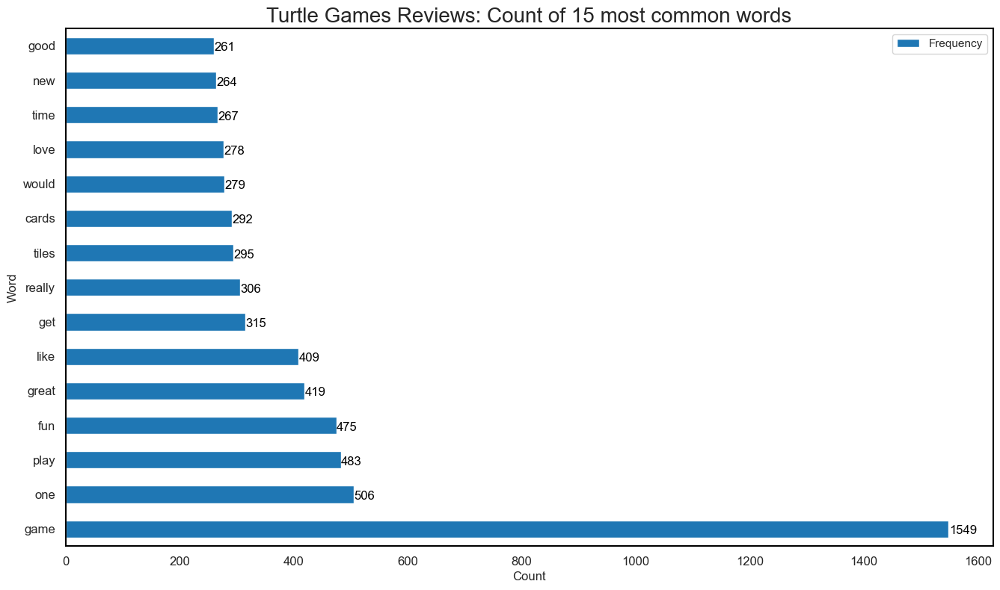

In [318]:
# Plot the top 15 most common words in the reviews together with their count
horiz_bar(counts_review,'Turtle Games Reviews: Count of 15 most common words')

In [319]:
# Determine the 15 most common words in summaries
# Tokenize the string of all_review into words
summary_tokens_stp = word_tokenize(summary_stp_string.lower())

# View the frequency distribution.
fdist_summary_stp = FreqDist(summary_tokens_stp)

# Preview the data.
fdist_summary_stp

FreqDist({'game': 164, 'starsfive': 126, 'great': 88, 'fun': 83, 'love': 52, 'starsgreat': 48, 'like': 47, 'five': 35, 'good': 33, 'expansion': 30, ...})

In [320]:
# Generate a DataFrame from Counter.
counts_summary = pd.DataFrame(Counter(summary_tokens_stp).most_common(15),
                      columns=['Word', 'Frequency']).set_index('Word')

# Preview data.
counts_summary

,Frequency
Word,
game,164
starsfive,126
great,88
fun,83
love,52
starsgreat,48
like,47
five,35
good,33


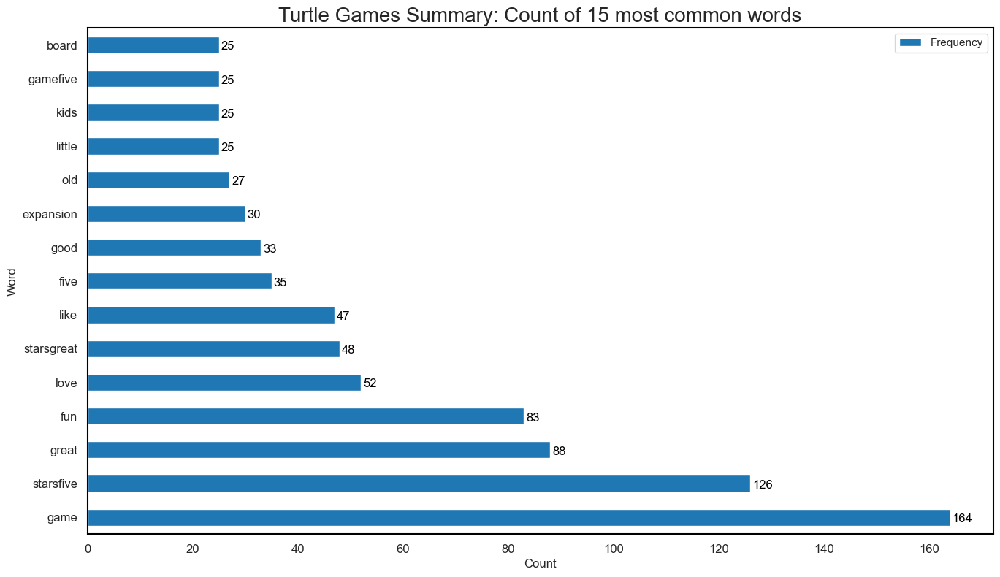

In [321]:
# Plot the top 15 most common words in the summaries together with their count
horiz_bar(counts_summary,'Turtle Games Summary: Count of 15 most common words')


### 4h) Review polarity and sentiment: Plot histograms of polarity and sentiment scores for the respective columns


In [323]:
# User-Defined function to generate polarity
def generate_polarity(comment):
    '''Extract polarity score (-1 to +1) for each comment'''
    return TextBlob(comment).sentiment[0]

In [324]:
# User-Defined function to generate subjectivity
def generate_subjectivity(comment):
    '''Extract subjectivity score (0 to 1) for each comment'''
    return TextBlob(comment).sentiment[1]

In [325]:
nlp['review']

0       when it comes to a dms screen the space on the...
1       an open letter to galeforce9\n\nyour unpainted...
2       nice art nice printing  why two panels are fil...
3       amazing buy bought it as a gift for our new dm...
4       as my review of gf9s previous screens these we...
                              ...                        
1995    the perfect word game for mixed ages with mom ...
1996    great game  did not think i would like it when...
1997            great game for all\nkeeps the mind nimble
1998                                             fun game
1999    this game is fun a lot like scrabble without a...
Name: review, Length: 2000, dtype: object

In [326]:
# Determine polarity of review column

nlp['polarity_rv']=nlp['review'].apply(generate_polarity)

# View output.
nlp['polarity_rv'].head()

0   -0.036111
1    0.035952
2    0.116640
3    0.578788
4   -0.316667
Name: polarity_rv, dtype: float64

In [327]:
# Determine subjectivity of review column

nlp['subjectivity_rv']=nlp['review'].apply(generate_subjectivity)

# View output.
nlp['subjectivity_rv'].head()

0    0.486111
1    0.442976
2    0.430435
3    0.784848
4    0.316667
Name: subjectivity_rv, dtype: float64

In [328]:
# Determine polarity of summary column

nlp['polarity_sm']=nlp['summary'].apply(generate_polarity)

# View output.
#nlp

In [329]:
# Determine subjectivity of summary column

nlp['subjectivity_sm']=nlp['summary'].apply(generate_subjectivity)

# View output.
nlp

,review,summary,polarity_rv,subjectivity_rv,polarity_sm,subjectivity_sm
0,when it comes to a dms screen the space on the...,the fact that 50 of this space is wasted on ar...,-0.036111,0.486111,0.150000,0.500000
1,an open letter to galeforce9\n\nyour unpainted...,another worthless dungeon masters screen from ...,0.035952,0.442976,-0.800000,0.900000
2,nice art nice printing why two panels are fil...,pretty but also pretty useless,0.116640,0.430435,0.000000,0.733333
3,amazing buy bought it as a gift for our new dm...,five stars,0.578788,0.784848,0.000000,0.000000
4,as my review of gf9s previous screens these we...,money trap,-0.316667,0.316667,0.000000,0.000000
...,...,...,...,...,...,...
1995,the perfect word game for mixed ages with mom ...,the perfect word game for mixed ages with mom,0.168750,0.491667,0.200000,0.550000
1996,great game did not think i would like it when...,super fun,0.158333,0.310043,0.316667,0.433333
1997,great game for all\nkeeps the mind nimble,great game,0.200000,0.575000,0.200000,0.575000
1998,fun game,four stars,-0.050000,0.300000,0.000000,0.000000


In [330]:
# User Definded function to plot the historgram with the sentiment score polarity
def hist_sent(column,title,xlabel,color):
    # Histogram of polarity
    # Set the number of bins
    num_bins = 15

    # Set the plot
    plt.figure(figsize=(16,9))

    # Set xlabesl
    plt.xticks(np.arange(-1,1.1,0.2))

    # Define the bars
    n, bins, patches = plt.hist(column,num_bins,
                            facecolor = color, alpha = 0.6)

    # Set the labels 
    plt.xlabel(xlabel,fontsize = 12)
    plt.ylabel('Count',fontsize = 12)
    plt.title(title, fontsize = 20)

    # Get current axes
    ax = plt.gca()

    # Add borders by customizing the spines
    for spine in ax.spines.values():
        spine.set_visible(True)        
        spine.set_linewidth(1.5)      
        spine.set_color('black')       
    plt.savefig(title,dpi=300,bbox_inches='tight')
    plt.show()


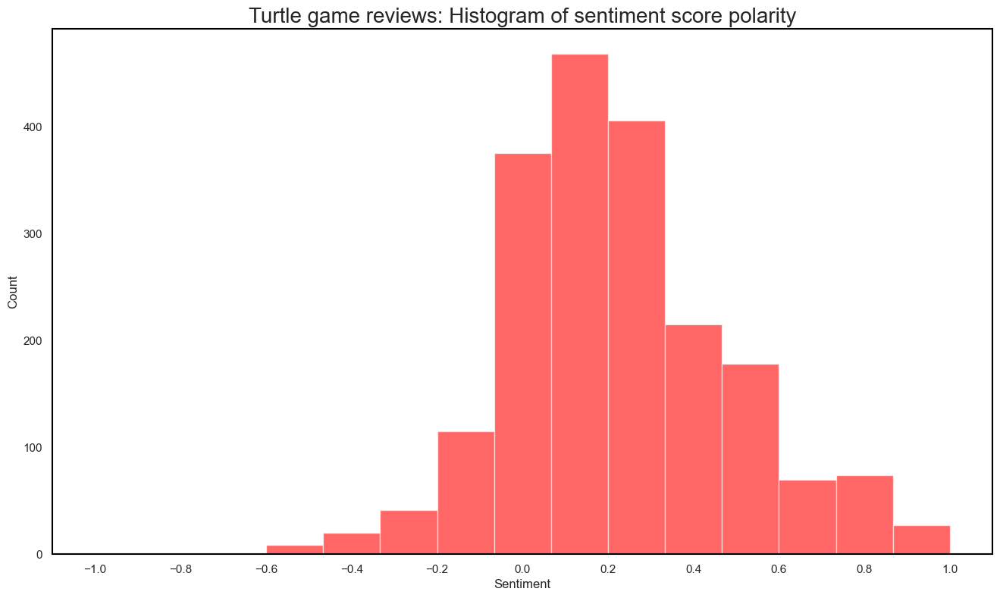

In [331]:
# Plot the histogram of the polarity score of the reviews
rv_column = nlp['polarity_rv']
hist_sent(rv_column,'Turtle game reviews: Histogram of sentiment score polarity','Sentiment','red')

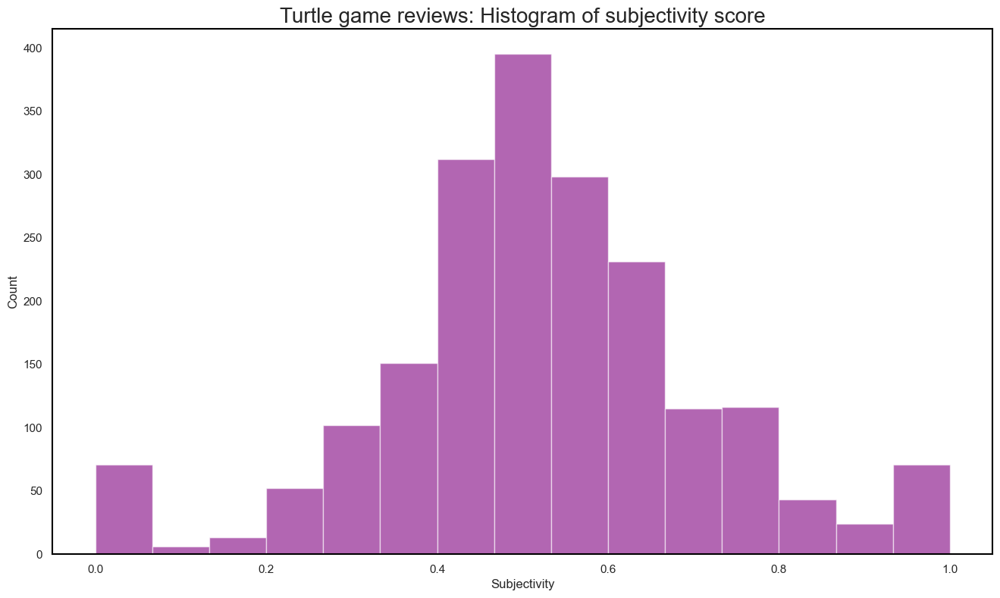

In [332]:
# Plot the histogram of the subjectivity score of the reviews
rv_column_sub = nlp['subjectivity_rv']
hist_sent(rv_column_sub,'Turtle game reviews: Histogram of subjectivity score','Subjectivity','purple')

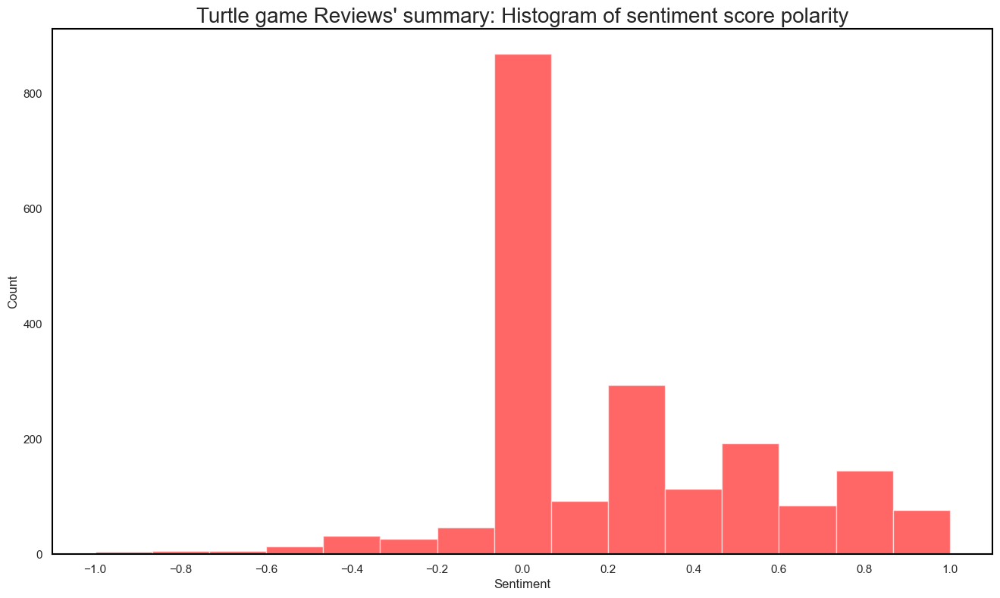

In [333]:
# Plot the histogram of the polarity score of the reviews
sm_column = nlp['polarity_sm']
hist_sent(sm_column,"Turtle game Reviews' summary: Histogram of sentiment score polarity",'Sentiment','red')

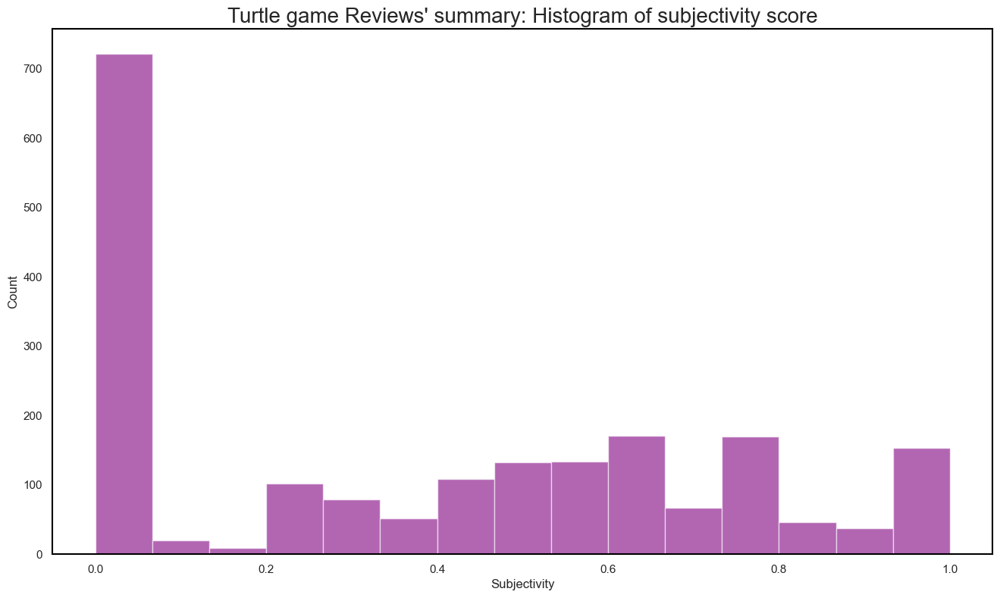

In [334]:
# Plot the histogram of the polarity score of the reviews
sm_column_sub = nlp['subjectivity_sm']
hist_sent(sm_column_sub,"Turtle game Reviews' summary: Histogram of subjectivity score",'Subjectivity','purple')

### 4i) Identify top 20 positive and negative reviews and summaries respectively

#### Negative Reviews and summaries

Negative reviews and summaries are mostly triggered by one of the following reasons:
- too difficult or not suitable for the age of the child
- requires a certain level of skill to put together
- quality issues especially with card/board games

In [337]:
# Top 20 negative reviews.
negative_reviews = nlp.nsmallest(20,'polarity_rv')

# View output.
negative_reviews = negative_reviews [['review','polarity_rv']]

# Adjust the column width
negative_reviews.style.set_properties(subset='review', **{'width':'1200px'})

,review,polarity_rv
208,booo unles you are patient know how to measure i didnt have the patience neither did my daughter boring unless you are a craft person which i am not,-1.000000
182,incomplete kit very disappointing,-0.780000
1804,im sorry i just find this product to be boring and to be frank juvenile,-0.583333
364,one of my staff will be using this game soon so i dont know how well it works as yet but after looking at the cards i believe it will be helpful in getting a conversation started regarding anger and what to do to control it,-0.550000
117,i bought this as a christmas gift for my grandson its a sticker book so how can i go wrong with this gift,-0.500000
227,this was a gift for my daughter i found it difficult to use,-0.500000
230,i found the directions difficult,-0.500000
290,instructions are complicated to follow,-0.500000
301,difficult,-0.500000
1524,expensive for what you get,-0.500000


In [338]:
# Top 20 negative summaries.
negative_summary = nlp.nsmallest(20,'polarity_sm')

# View output.
negative_summary = negative_summary [['summary','polarity_sm']]

# Adjust the column width
negative_summary.style.set_properties(subset='summary', **{'width':'500px'})
# View output.


,summary,polarity_sm
21,the worst value ive ever seen,-1.000000
208,boring unless you are a craft person which i am,-1.000000
829,boring,-1.000000
1166,before this i hated running any rpg campaign dealing with towns because it,-0.900000
1,another worthless dungeon masters screen from galeforce9,-0.800000
144,disappointed,-0.750000
631,disappointed,-0.750000
793,disappointed,-0.750000
1620,disappointed,-0.750000
363,promotes anger instead of teaching calming methods,-0.700000


#### Positive Reviews and summaries
Positive reviews were mostly triggered by:
- great quality products
- good educational values

In [340]:
# Top 20 positive reviews
positive_reviews = nlp.nlargest(20,'polarity_rv')

# View output.
positive_reviews = positive_reviews [['review','polarity_rv']]

# Adjust the column width
positive_reviews.style.set_properties(subset='review', **{'width':'1200px'})

# View output.


,review,polarity_rv
7,came in perfect condition,1.000000
165,awesome book,1.000000
194,awesome gift,1.000000
496,excellent activity for teaching selfmanagement skills,1.000000
524,perfect just what i ordered,1.000000
591,wonderful product,1.000000
609,delightful product,1.000000
621,wonderful for my grandson to learn the resurrection story,1.000000
790,perfect,1.000000
933,awesome,1.000000


In [341]:
# Top 20 positive summaries
positive_summary = nlp.nlargest(20,'polarity_sm')

# View output.
positive_summary = positive_summary [['summary','polarity_sm']]

# Adjust the column width
positive_summary.style.set_properties(subset='summary', **{'width':'500px'})
# View output.

# View output.


,summary,polarity_sm
6,best gm screen ever,1.000000
28,wonderful designs,1.000000
32,perfect,1.000000
80,theyre the perfect size to keep in the car or a diaper,1.000000
134,perfect for preschooler,1.000000
140,awesome sticker activity for the price,1.000000
161,awesome book,1.000000
163,he was very happy with his gift,1.000000
187,awesome,1.000000
210,awesome and welldesigned for 9 year olds,1.000000


### Reviews and Summaries Key-Takeaways
- Customers identified having high-negative polarity should be approached to address their concerns. This would be a proactive measure to avoid losing them as custmers.
- Customers with high-positive polarity should be approached to become brand ambassadors and to further engage with exclusive events and perks.
- Products identified with negative polarity should be examined for further development and improvement.
- Overall, turtle games have positive sentiment reviews and summaries. This indicates the general satisfaction of the customers with the company's product portfolio. A proactive approach towards negative sentiment products and customer reviews would help the company's image and would deepen the customers' loyalty and engagement with the brand.
- The analysis of the reviews and summaries was in general, insightful as it clarified the reason behind the presence of senior (age-wise) customers. Many of the reviews included the words gift, grandkids, granddaughter...etc clearly explaining the presence of this age bracket.
- Senior customers can be targeted with seasonal offers and discounts around holidays to allow them to keep buying gifts for their loved ones at Turtle Games. 